In [1]:
import sys
from pymodulon.io import *
from pymodulon.plotting import *
from os import path
from pymodulon.enrichment import *

In [2]:
sys.path.append('/home/annie/Documents/modulome/notebook/iModulon/pyvenn/')
from venn import venn
from matplotlib_venn import venn2

In [3]:
import matplotlib
import matplotlib.font_manager
import matplotlib.pyplot as plt
matplotlib.rcParams['pdf.fonttype'] = 42
plt.rc('font', family='sans-serif', size=16)
plt.rc('text', usetex=False)
plt.rc('font', serif='Arial')
plt.rcParams['axes.axisbelow'] = True

In [4]:
data_dir = path.join('..','data','processed_data')
# interim_dir = path.join('..','data','interim')

In [5]:
ica_data = load_json_model(path.join(data_dir,'ica_wip.json.gz'))

In [6]:
DF_enrichments = pd.read_csv(path.join(data_dir,'functional_enrichments.csv'),index_col=0)

<BarContainer object of 57 artists>

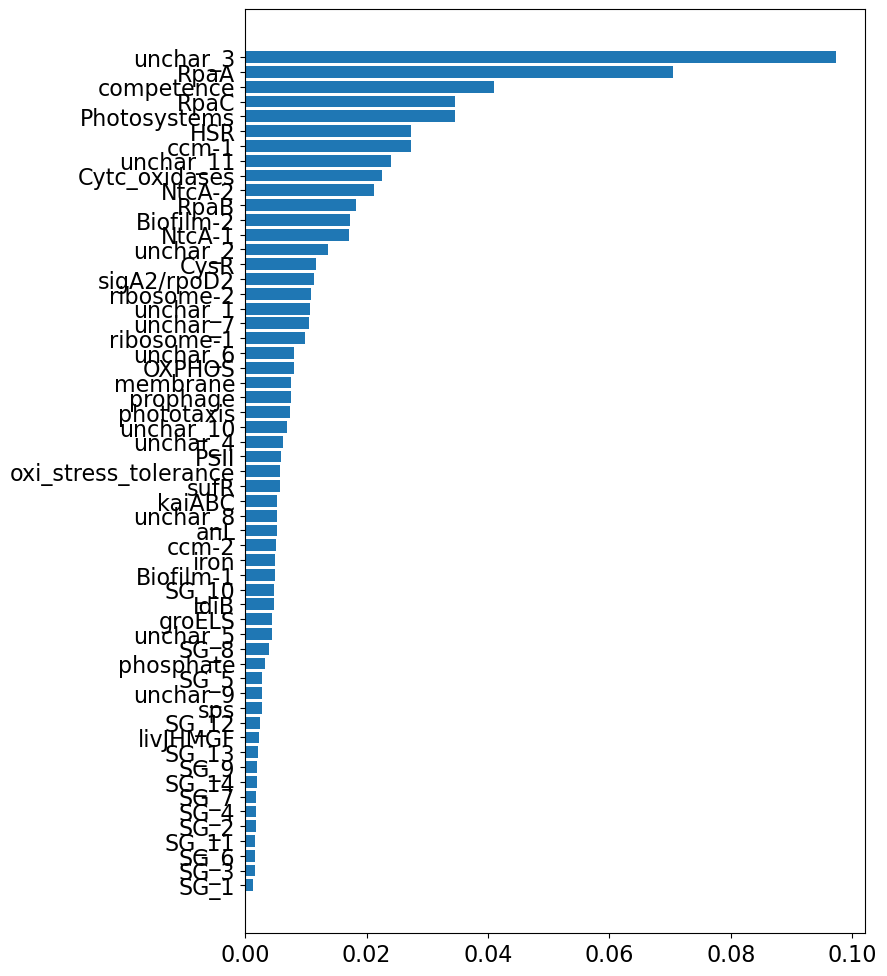

In [7]:
plt.figure(figsize = (8,12))
plt.barh(y = [str(x) for x in ica_data.imodulon_table.sort_values(by='explained_variance', ascending=True).index],
        width=ica_data.imodulon_table.sort_values(by='explained_variance', ascending=True).explained_variance)

In [8]:
ica_data.imodulon_table.sort_values(by='explained_variance',ascending=False)

,regulator,pvalue,qvalue,precision,recall,f1score,TP,regulon_size,imodulon_size,n_regs,single_gene,explained_variance,type,category
unchar_3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42,NaN,NaN,0.097238,Uncharacterized,Uncharacterized
RpaA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,121,NaN,NaN,0.070433,Regulatory,Transcription
competence,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41,NaN,NaN,0.040916,Uncharacterized,Uncharacterized
RpaC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31,NaN,NaN,0.034515,Uncharacterized,Uncharacterized
Photosystems,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44,NaN,NaN,0.034484,Functional,Energy
HSR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31,NaN,NaN,0.027318,Functional,Stress
ccm-1,ccmR,1.397716e-10,1.397716e-10,0.227273,0.833333,0.357143,5.0,6.0,22,1.0,NaN,0.027318,Regulatory,Transport
unchar_11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8,NaN,NaN,0.023951,Uncharacterized,Uncharacterized
Cytc_oxidases,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19,NaN,NaN,0.022565,Functional,Energy
NtcA-2,ntcA,2.770449e-09,8.311348e-09,0.175000,0.388889,0.241379,7.0,18.0,40,1.0,NaN,0.021265,Regulatory,Metabolism


In [1217]:
# light_1_idx = ica_data.sample_table[ica_data.sample_table['project'] == 'light_1'].index
# light_2_idx = ica_data.sample_table[ica_data.sample_table['project'] == 'light_2'].index

# Investigations

## Regulatory -- RpaA

From this paper:https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3935230/#SD1, https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE51112or the 'clock' study in our metadata: <br>

rpaA is required for global circadian gene expression and its deletion arrests cells in a subjective dawn-like state <br>

clock rescue restores circadian gene expression oscillations. No strong oscillations were observed in either class of genes in the ΔrpaA clock rescue . We conclude that RpaA is required for the orchestration of robust circadian gene expression by the PTO, ruling out the scenario in which RpaA’s role is limited to supporting oscillator function <br>

Phosphorylated RpaA binds to the kaiBC promoter and upregulates kaiBC expression <br>

Active RpaA is sufficient to switch cells between the two major gene expression states produced by the circadian clock

In [359]:
# https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3935230/#SD1
rpaa_regulon = ["Synpcc7942_0004", "Synpcc7942_0012", "Synpcc7942_0013", "Synpcc7942_0017", "Synpcc7942_0018", "Synpcc7942_0065", "Synpcc7942_0095", "Synpcc7942_0100", "Synpcc7942_0101", "Synpcc7942_0102", "Synpcc7942_0156", "Synpcc7942_0157", "Synpcc7942_0170", "Synpcc7942_0171", "Synpcc7942_0172", "Synpcc7942_0243", "Synpcc7942_0244", "Synpcc7942_0245", "Synpcc7942_0314", "Synpcc7942_0315", "Synpcc7942_0316", "Synpcc7942_0342", "Synpcc7942_0369", "Synpcc7942_0370", "Synpcc7942_0371", "Synpcc7942_0394", "Synpcc7942_0433", "Synpcc7942_0434", "Synpcc7942_0457", "Synpcc7942_0462", "Synpcc7942_0463", "Synpcc7942_0464", "Synpcc7942_0465", "Synpcc7942_0466", "Synpcc7942_0467", "Synpcc7942_0468", "Synpcc7942_0469", "Synpcc7942_0482", "Synpcc7942_0483", "Synpcc7942_0556", "Synpcc7942_0557", "Synpcc7942_0558", "Synpcc7942_0570", "Synpcc7942_0571", "Synpcc7942_0572", "Synpcc7942_0657", "Synpcc7942_0797", "Synpcc7942_0834", "Synpcc7942_0846", "Synpcc7942_0847", "Synpcc7942_0891", "Synpcc7942_0905", "Synpcc7942_0906", "Synpcc7942_1150", "Synpcc7942_1156", "Synpcc7942_1157", "Synpcc7942_1164", "Synpcc7942_1216", "Synpcc7942_1217", "Synpcc7942_1313", "Synpcc7942_1327", "Synpcc7942_1328", "Synpcc7942_1336", "Synpcc7942_1337", "Synpcc7942_1393", "Synpcc7942_1475", "Synpcc7942_1505", "Synpcc7942_1506", "Synpcc7942_1548", "Synpcc7942_1552", "Synpcc7942_1553", "Synpcc7942_1557", "Synpcc7942_1572", "Synpcc7942_1573", "Synpcc7942_1574", "Synpcc7942_1575", "Synpcc7942_1586", "Synpcc7942_1610", "Synpcc7942_1611", "Synpcc7942_1612", "Synpcc7942_1621", "Synpcc7942_1622", "Synpcc7942_1646", "Synpcc7942_1647", "Synpcc7942_1656", "Synpcc7942_1661", "Synpcc7942_1740", "Synpcc7942_1741", "Synpcc7942_1742", "Synpcc7942_1745", "Synpcc7942_1746", "Synpcc7942_1753", "Synpcc7942_1754", "Synpcc7942_1755", "Synpcc7942_1756", "Synpcc7942_1757", "Synpcc7942_1784", "Synpcc7942_1802", "Synpcc7942_1803", "Synpcc7942_1804", "Synpcc7942_1833", "Synpcc7942_1834", "Synpcc7942_1835", "Synpcc7942_1849", "Synpcc7942_1914", "Synpcc7942_1949", "Synpcc7942_1950", "Synpcc7942_1951", "Synpcc7942_1960", "Synpcc7942_1974", "Synpcc7942_1975", "Synpcc7942_1976", "Synpcc7942_1987", "Synpcc7942_1999", "Synpcc7942_2058", "Synpcc7942_2059", "Synpcc7942_2113", "Synpcc7942_2114", "Synpcc7942_2116", "Synpcc7942_2117", "Synpcc7942_2118", "Synpcc7942_2119", "Synpcc7942_2120", "Synpcc7942_2121", "Synpcc7942_2185", "Synpcc7942_2248", "Synpcc7942_2254", "Synpcc7942_2266", "Synpcc7942_2267", "Synpcc7942_2279", "Synpcc7942_2306", "Synpcc7942_2307", "Synpcc7942_2308", "Synpcc7942_2326", "Synpcc7942_2333", "Synpcc7942_2334", "Synpcc7942_2335", "Synpcc7942_2336", "Synpcc7942_2378", "Synpcc7942_2379", "Synpcc7942_2387", "Synpcc7942_2388", "Synpcc7942_2394", "Synpcc7942_2395", "Synpcc7942_2460", "Synpcc7942_2473", "Synpcc7942_2474", "Synpcc7942_2475", "Synpcc7942_2487", "Synpcc7942_2488", "Synpcc7942_2522", "Synpcc7942_2523", "Synpcc7942_2524", "Synpcc7942_2525", "Synpcc7942_2526", "Synpcc7942_2527", "Synpcc7942_2552", "Synpcc7942_2553", "Synpcc7942_2554", "Synpcc7942_2555", "Synpcc7942_2556", "Synpcc7942_2557", "Synpcc7942_2590", "Synpcc7942_2591", "Synpcc7942_2596", "Synpcc7942_2597", "Synpcc7942_2605", "Synpcc7942_R0032", "Synpcc7942_R0002", "Synpcc7942_R0024"]
# Remove the last few locus tags as they're not in the collection of genes in the imodulons
# rpaa_regulon = rpaa_regulon[:-3]

<AxesSubplot:xlabel='Gene Start', ylabel='RpaA Gene Weight'>

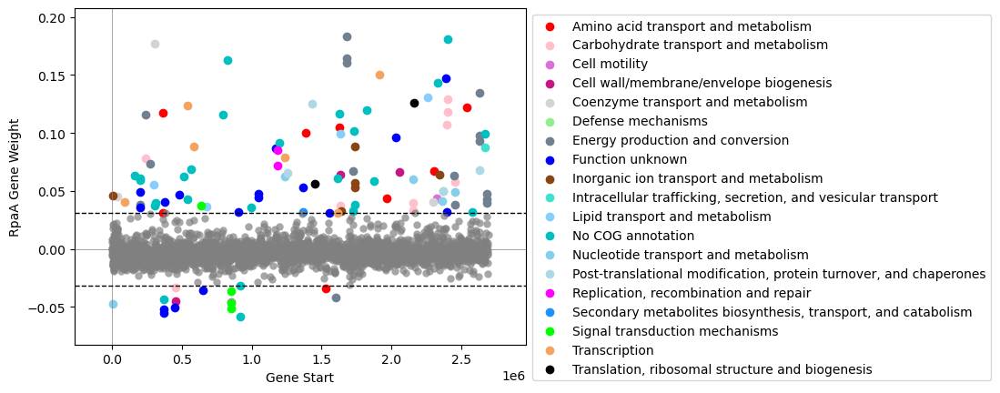

In [941]:
plot_gene_weights(ica_data,'RpaA')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

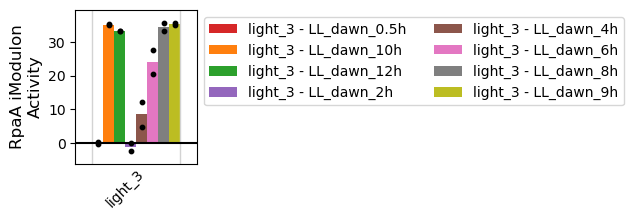

In [939]:
plot_activities(ica_data,'RpaA',projects='light_3')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

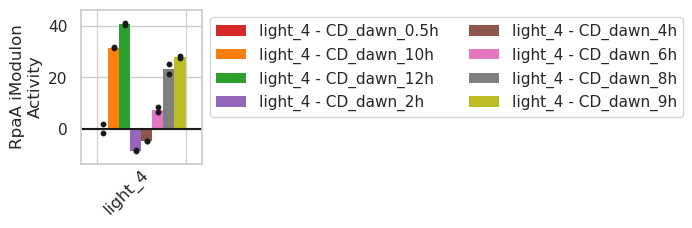

In [1774]:
plot_activities(ica_data,'RpaA',projects='light_4')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

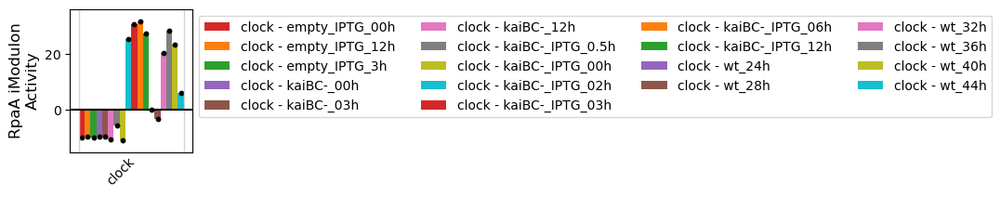

In [269]:
plot_activities(ica_data,'RpaA',projects='clock')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

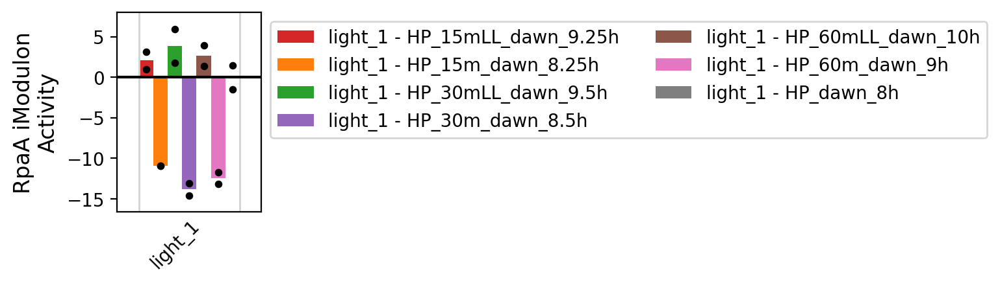

In [438]:
plot_activities(ica_data,'RpaA',projects='light_1')

<AxesSubplot:xlabel='rpaA_2:del_2dark_015', ylabel='rpaA_2:wt_2dark_015'>

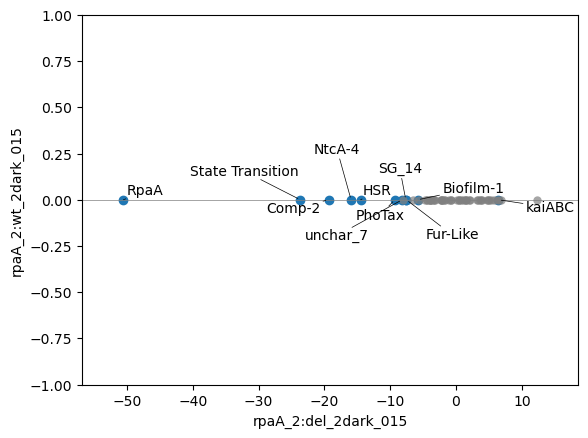

In [348]:
plot_dima(ica_data,'rpaA_2:del_2dark_015','rpaA_2:wt_2dark_015')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

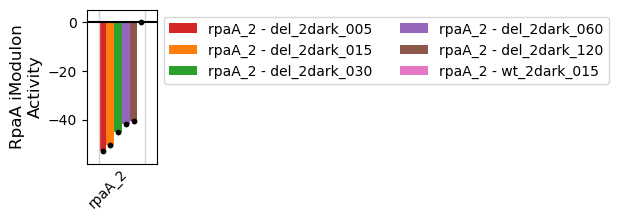

In [355]:
plot_activities(ica_data,'RpaA',projects='rpaA_2')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

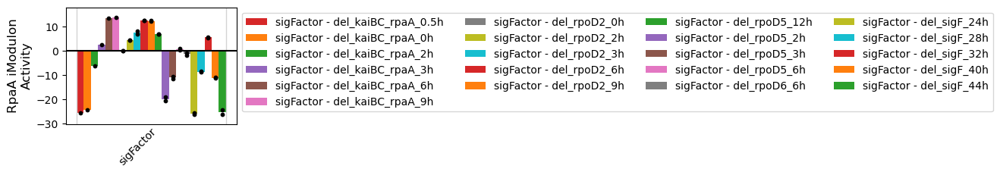

In [278]:
plot_activities(ica_data,'RpaA',projects='sigFactor')

In [295]:
cat = dict(collections. Counter(ica_data.view_imodulon('RpaA')['COG']))

In [296]:
l = ica_data.view_imodulon('RpaA').shape[0]
key = []
val = []
for k in cat:
    pct = round(100*cat[k]/l, 2)
    key.append(str(k)+ '(' + str(cat[k]) + ')')
    val.append(cat[k])

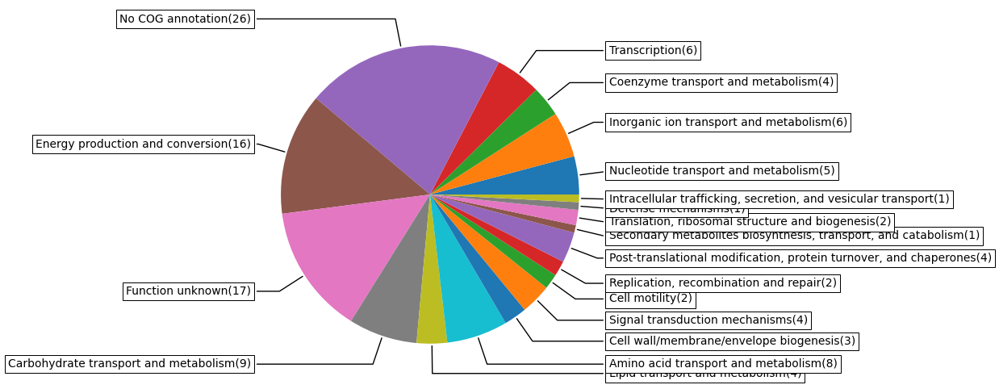

In [297]:
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw=dict(aspect="equal"))
wedges, texts = ax.pie(val)


bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate(key[i], xy=(x, y), xytext=(1.2*np.sign(x),1.2*y),
                horizontalalignment=horizontalalignment, **kw)
None

In [ ]:
# https://www.pnas.org/doi/full/10.1073/pnas.0912673106
dusk_dawn = pd.read_excel('~/Downloads/sd1.xlsx',sheet_name = 'Analysis of Circadian Gene Exp',index_col=0)
dusk_genes = dusk_dawn[dusk_dawn['Non-Circadian 0, Dusk 1, Dawn 2'] == 1]['7942 ID'].dropna()
dawn_genes = dusk_dawn[dusk_dawn['Non-Circadian 0, Dusk 1, Dawn 2'] == 2]['7942 ID'].dropna()

{'matrix': <AxesSubplot:>,
 'shading': <AxesSubplot:>,
 'totals': <AxesSubplot:>,
 'intersections': <AxesSubplot:ylabel='Intersection size'>}

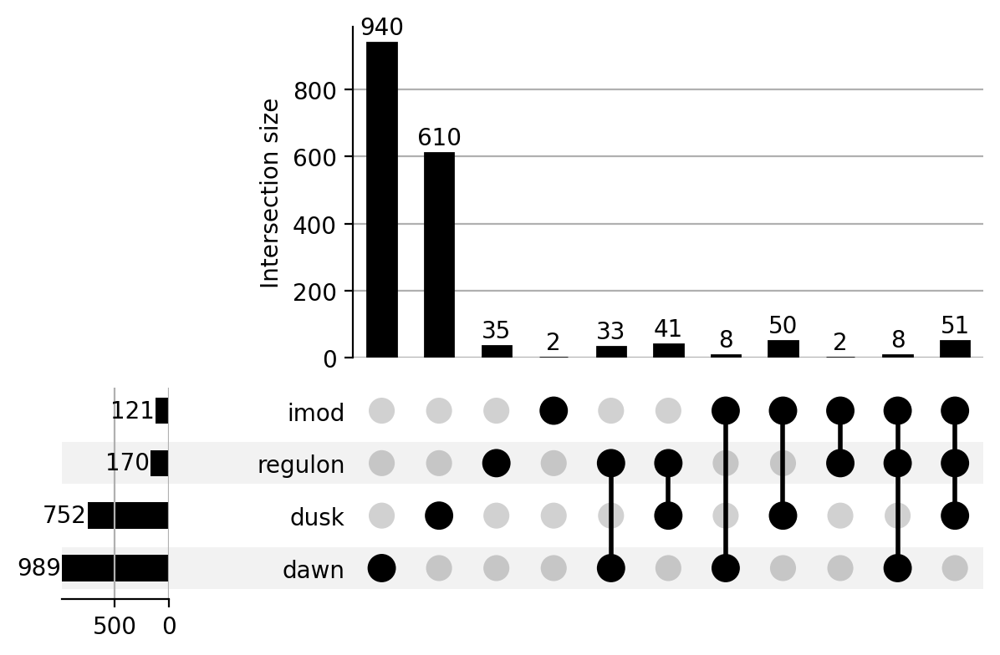

In [425]:
UpSet(from_contents({
    'dusk':set(dusk_genes),
    'dawn':set(dawn_genes),
    'imod':set(ica_data.view_imodulon('RpaA').index),
    'regulon':set(rpaa_regulon)
}),show_counts=True).plot()

In [1770]:
# https://elifesciences.org/articles/32032
early = [
    "Synpcc7942_2487", "Synpcc7942_2369", "Synpcc7942_1809", "Synpcc7942_1125",
    "Synpcc7942_0309", "Synpcc7942_2243", "Synpcc7942_0236", "Synpcc7942_2476",
    "Synpcc7942_1275", "Synpcc7942_0577", "Synpcc7942_2367", "Synpcc7942_1827",
    "Synpcc7942_0595", "Synpcc7942_0421", "Synpcc7942_1587", "Synpcc7942_0307",
    "Synpcc7942_0096", "Synpcc7942_0686", "Synpcc7942_1656", "Synpcc7942_0668",
    "Synpcc7942_2603", "Synpcc7942_1557", "Synpcc7942_0680", "Synpcc7942_1108",
    "Synpcc7942_0383", "Synpcc7942_2604", "Synpcc7942_2602", "Synpcc7942_0687",
    "Synpcc7942_0199", "Synpcc7942_0316", "Synpcc7942_0201", "Synpcc7942_1804",
    "Synpcc7942_0556", "Synpcc7942_0198", "Synpcc7942_1960"
]

middle = [
    "Synpcc7942_0223", "Synpcc7942_2500", "Synpcc7942_1466", "Synpcc7942_0781",
    "Synpcc7942_0267", "Synpcc7942_2609", "Synpcc7942_2499", "Synpcc7942_1976",
    "Synpcc7942_1567", "Synpcc7942_1460", "Synpcc7942_1445", "Synpcc7942_0215",
    "Synpcc7942_1506", "Synpcc7942_1397", "Synpcc7942_0770", "Synpcc7942_2498",
    "Synpcc7942_1446", "Synpcc7942_1914", "Synpcc7942_0571", "Synpcc7942_2185",
    "Synpcc7942_2200", "Synpcc7942_2002", "Synpcc7942_2352", "Synpcc7942_1572",
    "Synpcc7942_0391", "Synpcc7942_2297", "Synpcc7942_1115", "Synpcc7942_1646",
    "Synpcc7942_2384", "Synpcc7942_1195", "Synpcc7942_1573", "Synpcc7942_2388",
    "Synpcc7942_0422", "Synpcc7942_2385", "Synpcc7942_2326", "Synpcc7942_2103",
    "Synpcc7942_0369", "Synpcc7942_1678", "Synpcc7942_1987", "Synpcc7942_2306",
    "Synpcc7942_2333", "Synpcc7942_2387", "Synpcc7942_1402", "Synpcc7942_2334",
    "Synpcc7942_2484", "Synpcc7942_2307", "Synpcc7942_1849", "Synpcc7942_0305",
    "Synpcc7942_0989", "Synpcc7942_2335", "Synpcc7942_2080", "Synpcc7942_0244",
    "Synpcc7942_1150", "Synpcc7942_0527", "Synpcc7942_2079", "Synpcc7942_0581",
    "Synpcc7942_0370", "Synpcc7942_1949", "Synpcc7942_2556", "Synpcc7942_1950",
    "Synpcc7942_0245", "Synpcc7942_1757", "Synpcc7942_0769", "Synpcc7942_2308",
    "Synpcc7942_0304", "Synpcc7942_2557", "Synpcc7942_1209", "Synpcc7942_2082",
    "Synpcc7942_2336", "Synpcc7942_0086", "Synpcc7942_1830", "Synpcc7942_0644",
    "Synpcc7942_2485", "Synpcc7942_1290", "Synpcc7942_2486", "Synpcc7942_0491",
    "Synpcc7942_0780", "Synpcc7942_1824", "Synpcc7942_0180", "Synpcc7942_0252"
]
late = [
    "Synpcc7942_2349", "Synpcc7942_2540", "Synpcc7942_2096", "Synpcc7942_2458",
    "Synpcc7942_0768", "Synpcc7942_1411", "Synpcc7942_2432", "Synpcc7942_0401",
    "Synpcc7942_2535", "Synpcc7942_0100", "Synpcc7942_0573", "Synpcc7942_0522",
    "Synpcc7942_2507", "Synpcc7942_1784", "Synpcc7942_2553", "Synpcc7942_0033",
    "Synpcc7942_1327", "Synpcc7942_0703", "Synpcc7942_1096", "Synpcc7942_1777",
    "Synpcc7942_1412", "Synpcc7942_0256", "Synpcc7942_0834", "Synpcc7942_0704",
    "Synpcc7942_1420", "Synpcc7942_2590", "Synpcc7942_2187", "Synpcc7942_2591",
    "Synpcc7942_1610", "Synpcc7942_1227", "Synpcc7942_1612", "Synpcc7942_0599",
    "Synpcc7942_2346", "Synpcc7942_0647", "Synpcc7942_0312", "Synpcc7942_1095",
    "Synpcc7942_1556", "Synpcc7942_0032", "Synpcc7942_1838", "Synpcc7942_1611",
    "Synpcc7942_1064", "Synpcc7942_2461", "Synpcc7942_0069", "Synpcc7942_1776",
    "Synpcc7942_0677", "Synpcc7942_1396", "Synpcc7942_2301", "Synpcc7942_0499",
    "Synpcc7942_1636", "Synpcc7942_2254", "Synpcc7942_2192", "Synpcc7942_1019",
    "Synpcc7942_0705", "Synpcc7942_0590", "Synpcc7942_1696", "Synpcc7942_0355",
    "Synpcc7942_1419", "Synpcc7942_2404", "Synpcc7942_0423", "Synpcc7942_1865",
    "Synpcc7942_0291", "Synpcc7942_1661", "Synpcc7942_2554", "Synpcc7942_1040",
    "Synpcc7942_0529", "Synpcc7942_2253", "Synpcc7942_0963", "Synpcc7942_0477",
    "Synpcc7942_1416", "Synpcc7942_1871", "Synpcc7942_1499", "Synpcc7942_1057"
]

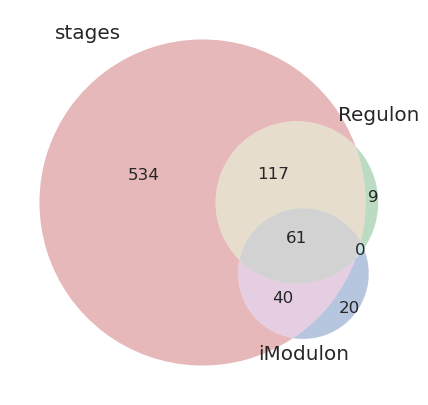

In [1771]:
venn3([set(dusk_genes),set(early+middle+late),set(ica_data.view_imodulon('RpaA').index)],
     set_labels=('stages','Regulon','iModulon'))

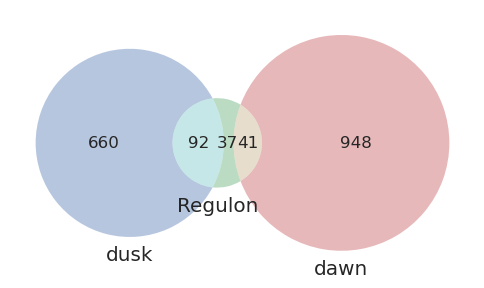

In [1772]:
venn3([set(dawn_genes),set(rpaa_regulon),set(dusk_genes)],
     set_labels=('dawn','Regulon','dusk'))

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

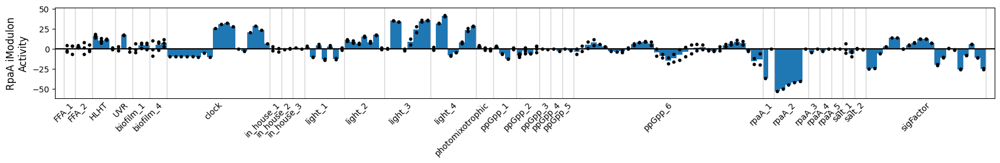

In [966]:
plot_activities(ica_data,'RpaA')

wt_24:subjective dawn   wt_36:subjective dusk <br>
strains are del_rpaA_del_kaiBC_RpaA~P<br>
empty: del_rpaA_del_kaiBC_<br>

See the activity of the RpaA iModulon increase when the strain has phosphomimetic RpaA and IPTG expression induction. Also high activity around subjective dusk. Highly consistent with literature

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

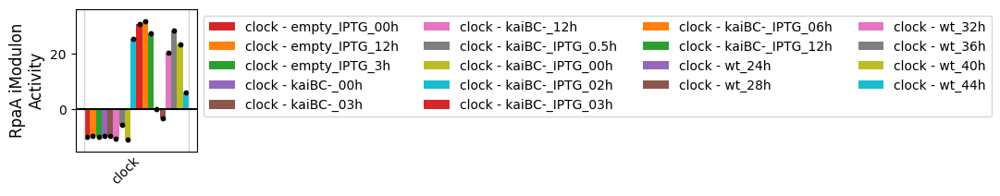

In [967]:
plot_activities(ica_data,'RpaA',projects='clock')

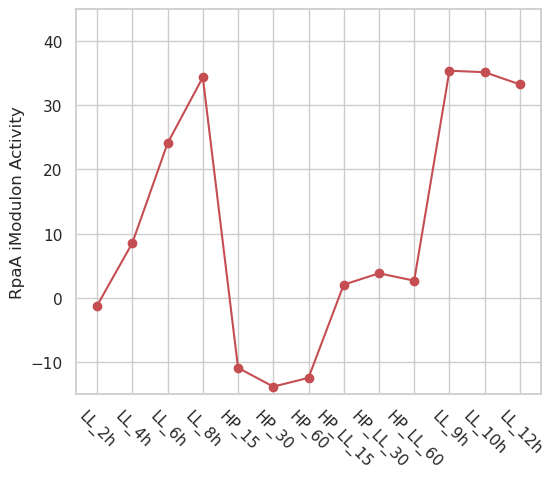

In [1773]:
plt.plot(high_light(ica_data,['RpaA']).T,'-ro')
plt.xticks(rotation=-45)
plt.ylabel('RpaA iModulon Activity')
plt.ylim([-15,45])
# plt.savefig('/home/annie/Documents/high_light.pdf',bbox_inches='tight')
None

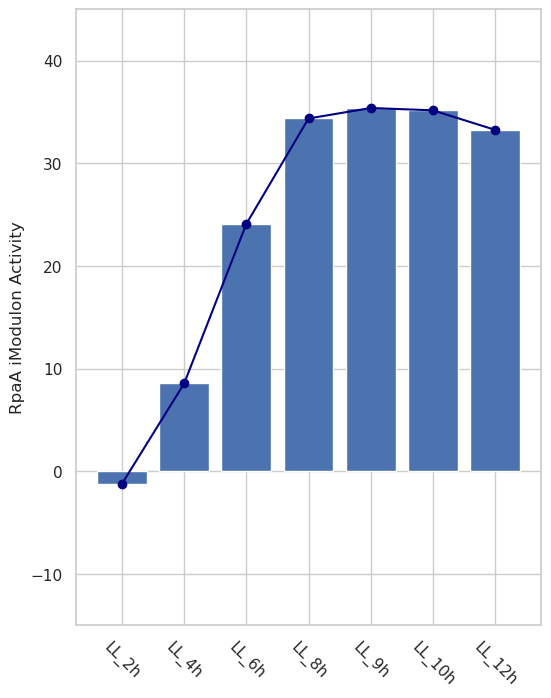

In [1450]:
# plt.figure(figsize=(6,8))
# plt.bar(light3_activity(ica_data,['RpaA']).T.index,height=light3_activity(ica_data,['RpaA']).loc['RpaA'])
# plt.plot(light3_activity(ica_data,['RpaA']).T,'-o',color='navy')
# plt.xticks(rotation=-45)
# plt.ylabel('RpaA iModulon Activity')
# plt.ylim([-15,45])
# # plt.savefig('../data/Figures/Low_light_rpaa.pdf',bbox_inches='tight',transparent='True')
# None

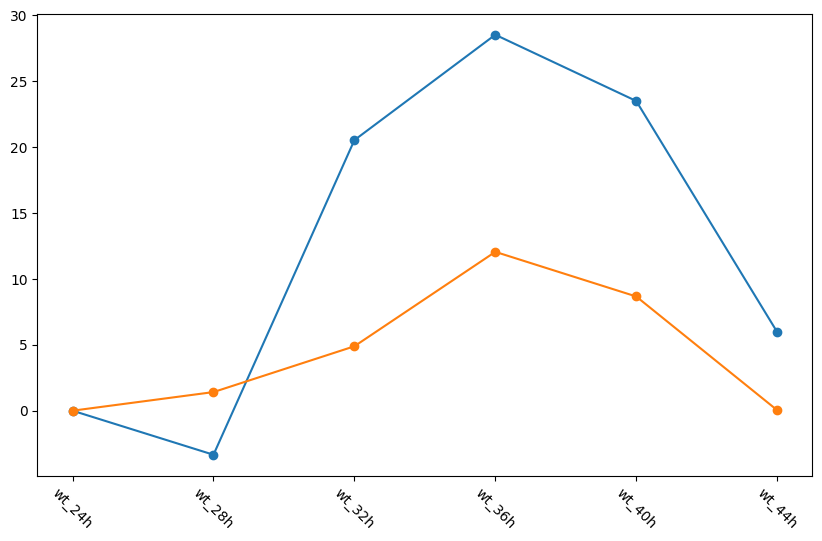

In [9]:
wt_time_idx = ica_data.sample_table[ica_data.sample_table['project'] == 'clock']['condition'][0:6].index
plt.figure(figsize = (10,6))
for i in ['RpaA','Comp-2']:
#     plt.figure(figsize = (14,6))
    plt.plot(ica_data.A[wt_time_idx].loc[i],'-o')
    plt.xticks(range(6),ica_data.sample_table.loc[wt_time_idx]['condition'],rotation=-45)
#     plt.title(i)

Time information encoded in the PTO is read out through the histidine kinases SasA and CikA, which antagonistically regulate RpaA phosphorylation to generate oscillations of RpaA~P that peak at or immediately preceding subjective dusk. The accumulation of RpaA~P switches the cell’s gene expression program from subjective dawn to subjective dusk via transcriptional programs hardwired into the RpaA regulon. RpaA~P accumulation also initiates closure of the cell division gate. RpaA~P decreases during the subjective night, allowing gene expression to revert to its default dawn-like state and also opening the cell division gate.

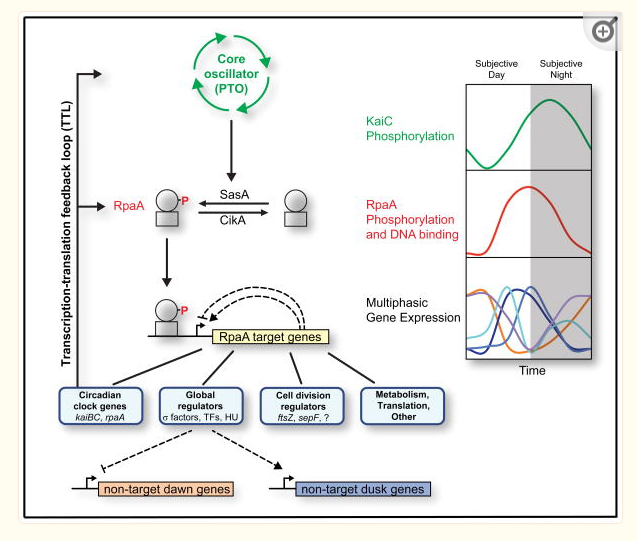

Activity of RpaA peaks right before dusk (12 hours since dawn) <br>
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5785211/ <br>
https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE104203

## Regulatory -- NtcA-1, NtcA-2

<AxesSubplot:>

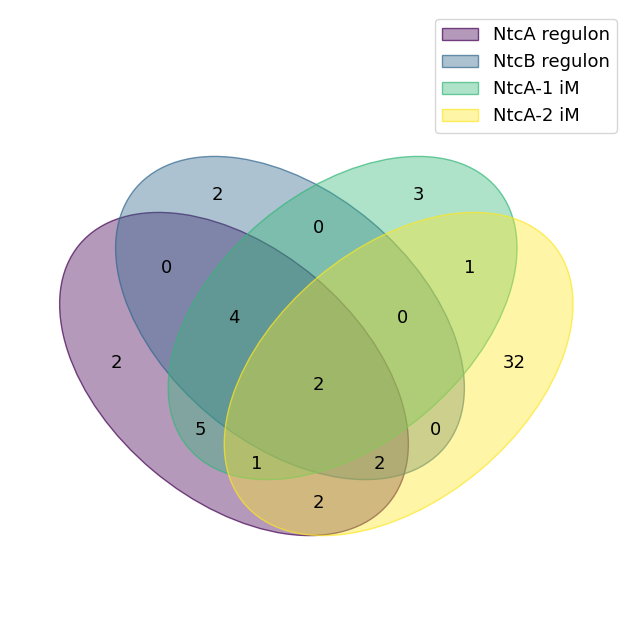

In [797]:
venn({'NtcA regulon':set(ica_data.trn[ica_data.trn.regulator=='ntcA'].gene_id),
      'NtcB regulon':set(ica_data.trn[ica_data.trn.regulator=='ntcB'].gene_id),
      'NtcA-1 iM':set(ica_data.view_imodulon('NtcA-1').index),
      'NtcA-2 iM':set(ica_data.view_imodulon('NtcA-2').index)})

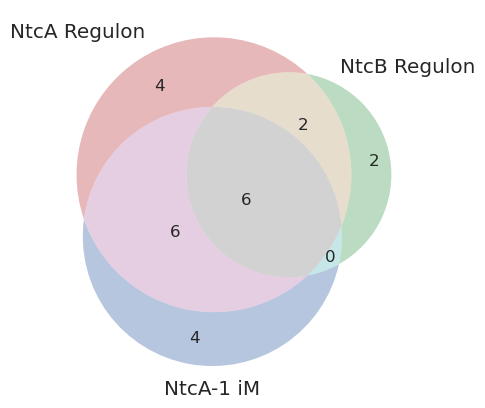

In [1775]:
venn3([set(ica_data.trn[ica_data.trn.regulator=='ntcA'].gene_id),
       set(ica_data.trn[ica_data.trn.regulator=='ntcB'].gene_id),
      set(ica_data.view_imodulon('NtcA-1').index)],
      set_labels=['NtcA Regulon','NtcB Regulon','NtcA-1 iM'])

<AxesSubplot:xlabel='NtcA-1 iModulon Activity', ylabel='NtcA-2 iModulon Activity'>

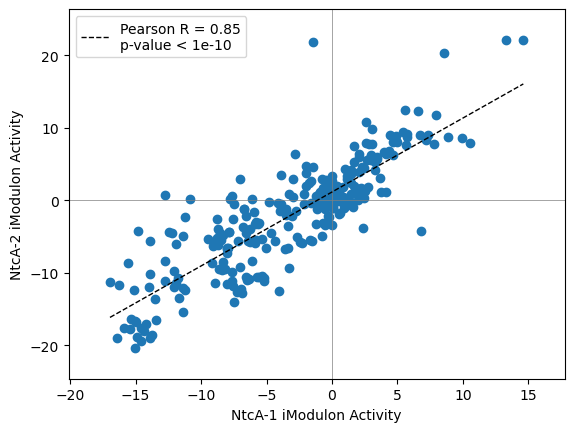

In [944]:
compare_activities(ica_data,'NtcA-1','NtcA-2')

<AxesSubplot:xlabel='Gene Start', ylabel='NtcA-1 Gene Weight'>

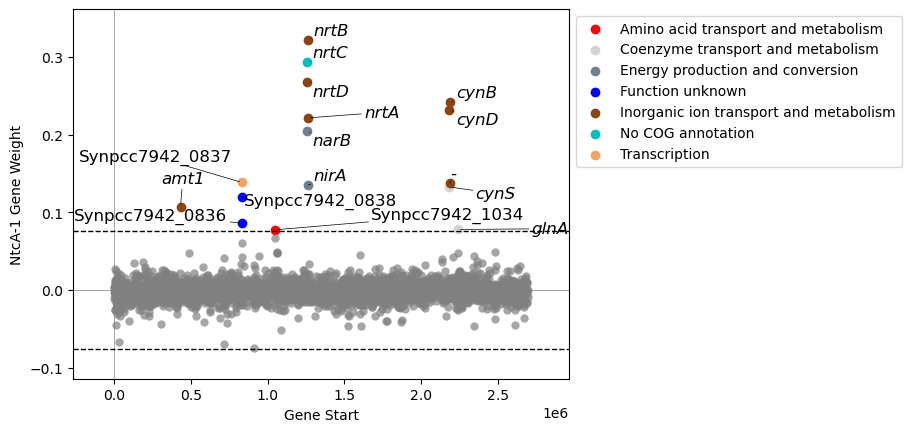

In [947]:
plot_gene_weights(ica_data,'NtcA-1',show_labels=True)

<AxesSubplot:xlabel='Gene Start', ylabel='NtcA-2 Gene Weight'>

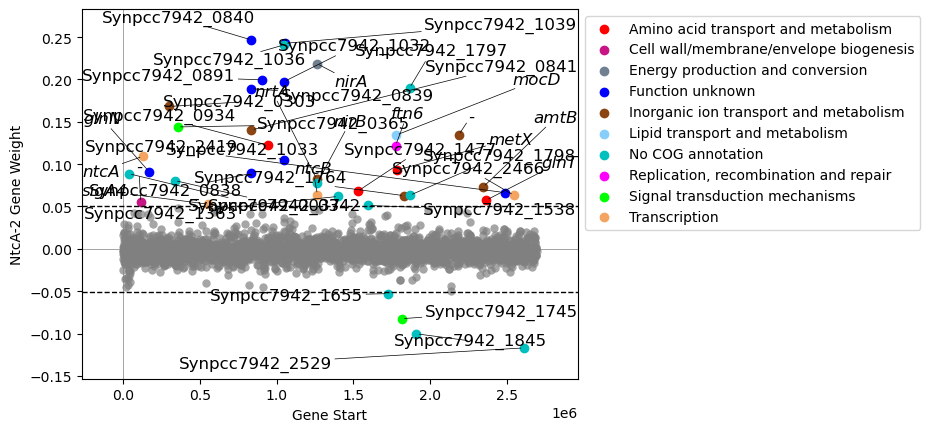

In [946]:
plot_gene_weights(ica_data,'NtcA-2',show_labels=True)

<AxesSubplot:ylabel='NtcA-1 iModulon\nActivity'>

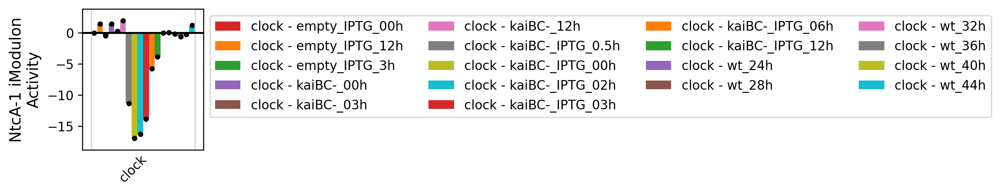

In [752]:
plot_activities(ica_data,'NtcA-1',projects='clock')

<AxesSubplot:ylabel='NtcA-2 iModulon\nActivity'>

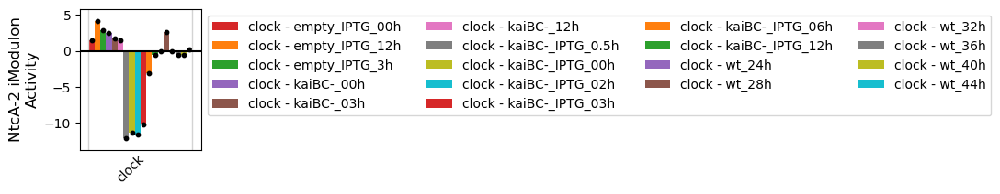

In [948]:
plot_activities(ica_data,'NtcA-2',projects='clock')

<AxesSubplot:ylabel='NtcA-2 iModulon\nActivity'>

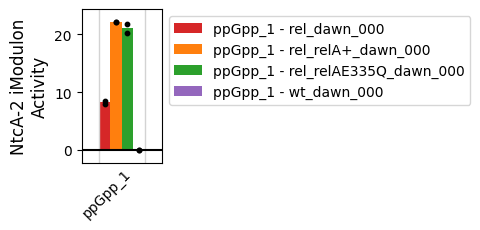

In [762]:
plot_activities(ica_data,'NtcA-2',projects='ppGpp_1')

<AxesSubplot:ylabel='NtcA-1 iModulon\nActivity'>

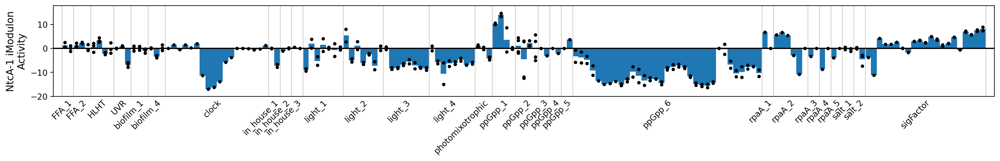

In [566]:
plot_activities(ica_data,'NtcA-1')

<AxesSubplot:ylabel='NtcA-2 iModulon\nActivity'>

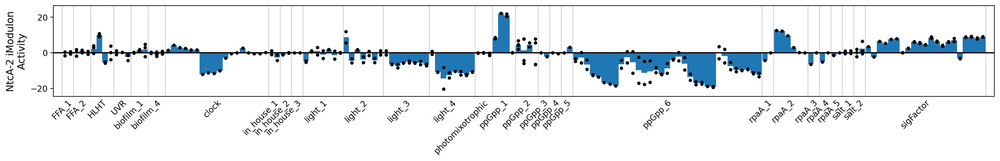

In [716]:
plot_activities(ica_data,'NtcA-2')

<AxesSubplot:ylabel='NtcA-1 iModulon\nActivity'>

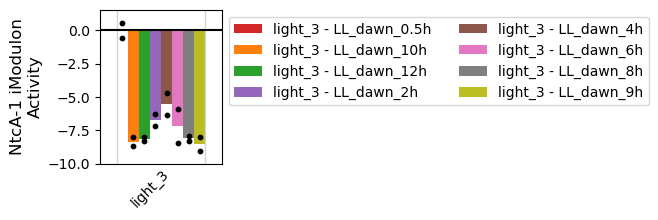

In [974]:
plot_activities(ica_data,'NtcA-1',projects='light_3')

<AxesSubplot:xlabel='NtcA-2 iModulon Activity', ylabel='ccm-1 iModulon Activity'>

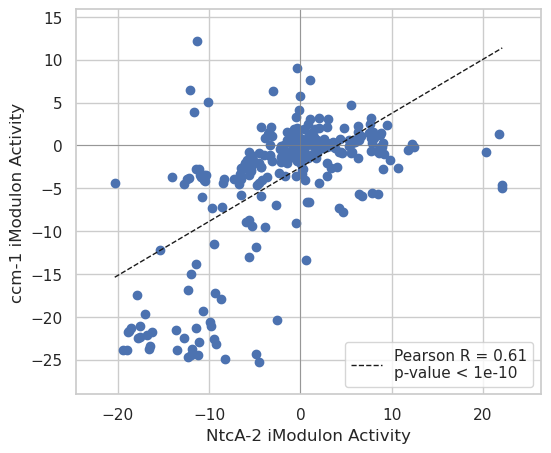

In [1776]:
compare_activities(ica_data,'NtcA-2','ccm-1')

## carbon concentrating mechanisms

In [1777]:
ccmr = set(ica_data.trn[ica_data.trn.regulator=='ccmR'].gene_id)

In [1781]:
ccm1 = set(ica_data.view_imodulon('ccm-1').index)

In [1782]:
ccm2 = set(ica_data.view_imodulon('ccm-2').index)

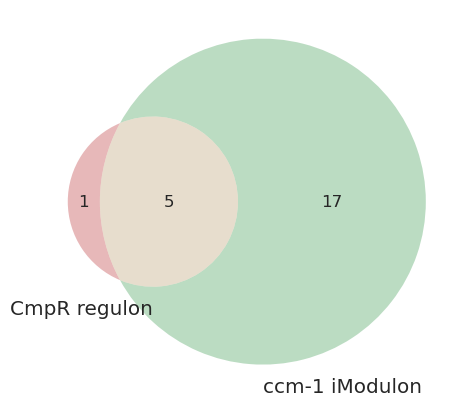

In [1783]:
venn2([ccmr,ccm1],set_labels=('CmpR regulon','ccm-1 iModulon'))
# plt.savefig('../data/Figures/cmpr.pdf',transparent=True)

In [572]:
ica_data.view_imodulon('ccm-1')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0900,0.125901,Synpcc7942_0900,CP000100.1,NaN,909440,909643,-,conserved hypothetical protein,No COG annotation,Q31PT9,Op689,NaN
Synpcc7942_1421,0.183955,ccmK2,CP000100.1,NaN,1475239,1475547,+,putative carboxysome assembly protein,Energy production and conversion,Q03511,Op1073,NaN
Synpcc7942_1422,0.230108,ccmL,CP000100.1,NaN,1475694,1475993,+,carbon dioxide concentrating mechanism protein...,Energy production and conversion,Q03512,Op1074,NaN
Synpcc7942_1423,0.242445,ccmM,CP000100.1,NaN,1476059,1477678,+,Carbonate dehydratase,Energy production and conversion,Q03513,Op1075,NaN
Synpcc7942_1424,0.207627,ccmN,CP000100.1,NaN,1477713,1478198,+,carbon dioxide concentrating mechanism protein,Function unknown,P46204,Op1075,NaN
Synpcc7942_1426,0.172065,cbbL,CP000100.1,NaN,1479461,1480879,+,ribulose-1%2C5-bisphosphate carboxylase/oxygen...,Coenzyme transport and metabolism,Q31NB3,Op1077,NaN
Synpcc7942_1427,0.184956,cbbS,CP000100.1,NaN,1480970,1481305,+,ribulose 1%2C5-bisphosphate carboxylase small ...,Energy production and conversion,Q31NB2,Op1077,NaN
Synpcc7942_1447,0.104194,ccaA,CP000100.1,NaN,1500489,1501307,+,Carbonate dehydratase,Inorganic ion transport and metabolism,P27134,Op1095,NaN
Synpcc7942_1476,-0.107101,Synpcc7942_1476,CP000100.1,NaN,1527717,1528031,+,conserved hypothetical protein,Amino acid transport and metabolism,Q31N63,Op1114,NaN
Synpcc7942_1673,0.134972,Synpcc7942_1673,CP000100.1,NaN,1743189,1743854,-,conserved hypothetical protein,Signal transduction mechanisms,Q31ML6,Op1264,NaN


In [557]:
ica_data.view_imodulon('ccm-2')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0074,-0.067794,Synpcc7942_0074,CP000100.1,NaN,73306,73659,-,conserved hypothetical protein,No COG annotation,Q31S63,Op93,NaN
Synpcc7942_0834,0.065401,Synpcc7942_0834,CP000100.1,NaN,828582,829235,+,conserved hypothetical protein,No COG annotation,Q31Q04,Op640,NaN
Synpcc7942_1345,0.074989,ndhG,CP000100.1,NaN,1378990,1379595,+,NADH dehydrogenase subunit 6,Energy production and conversion,Q31NJ4,Op1011,NaN
Synpcc7942_1346,0.076882,ndhE,CP000100.1,NaN,1379614,1379925,+,NADH dehydrogenase subunit 4L,Energy production and conversion,Q31NJ3,Op1011,NaN
Synpcc7942_1468,0.075560,mnhB1,CP000100.1,NaN,1521482,1522141,-,putative multicomponent Na+:H+ antiporter subu...,Inorganic ion transport and metabolism,Q31N71,Op1111,NaN
Synpcc7942_1469,0.088137,mnhB2,CP000100.1,NaN,1522138,1522719,-,putative multicomponent Na+:H+ antiporter subu...,Inorganic ion transport and metabolism,Q31N70,Op1111,NaN
Synpcc7942_1470,0.096660,-,CP000100.1,NaN,1522712,1523005,-,conserved hypothetical protein,Inorganic ion transport and metabolism,Q31N69,Op1112,NaN
Synpcc7942_1471,0.097226,Synpcc7942_1471,CP000100.1,NaN,1523002,1523259,-,conserved hypothetical protein,No COG annotation,Q31N68,Op1111,NaN
Synpcc7942_1472,0.116698,Synpcc7942_1472,CP000100.1,NaN,1523256,1523642,-,conserved hypothetical protein,Inorganic ion transport and metabolism,Q31N67,Op1111,NaN
Synpcc7942_1473,0.135673,mnhD,CP000100.1,NaN,1523639,1525081,-,putative multicomponent Na+:H+ antiporter subu...,Energy production and conversion,Q31N66,Op1111,NaN


<AxesSubplot:xlabel='Gene Start', ylabel='ccm-1 Gene Weight'>

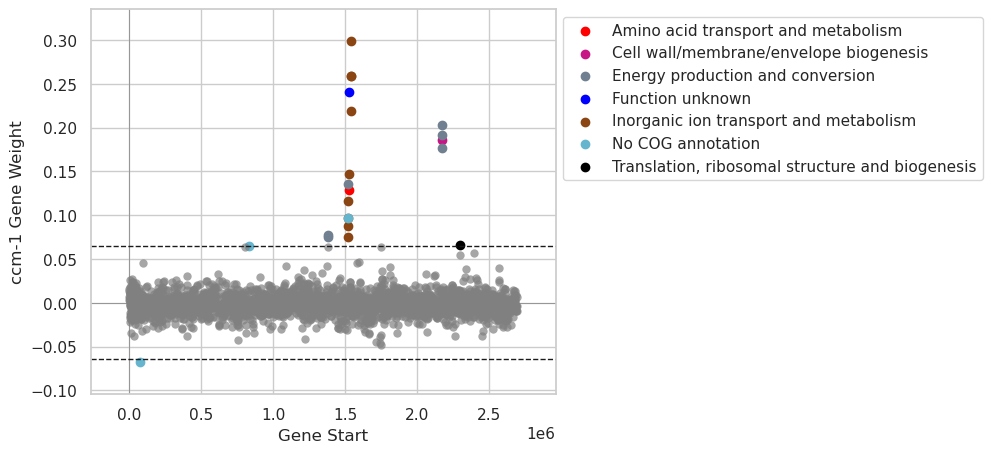

In [1784]:
plot_gene_weights(ica_data,'ccm-1')

<AxesSubplot:ylabel='ccm-1 iModulon\nActivity'>

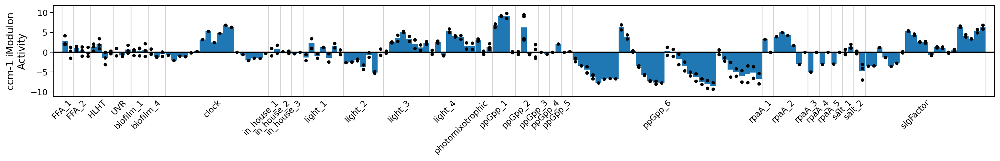

In [682]:
plot_activities(ica_data,'ccm-1')

<AxesSubplot:xlabel='Gene Start', ylabel='ccm-2 Gene Weight'>

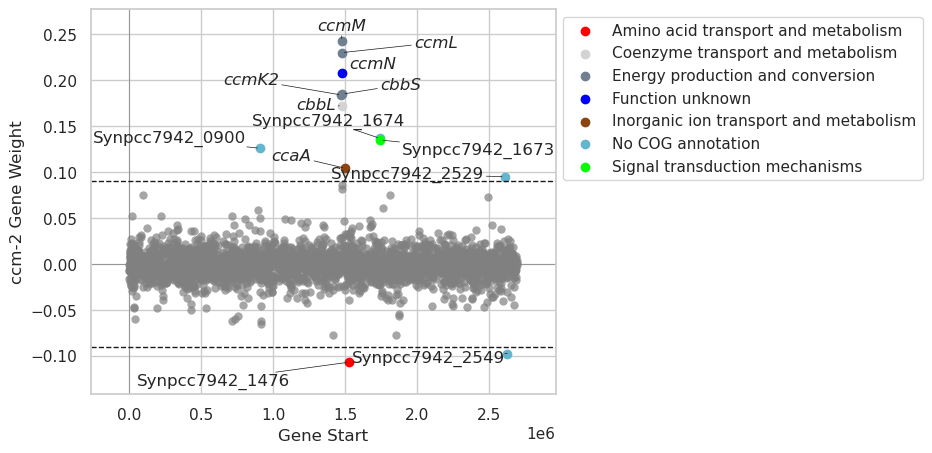

In [1785]:
plot_gene_weights(ica_data,'ccm-2')

<AxesSubplot:ylabel='ccm-2 iModulon\nActivity'>

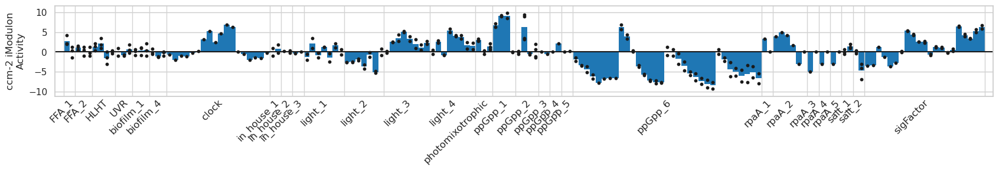

In [1786]:
plot_activities(ica_data,'ccm-2')

## RpaB

In [1787]:
ica_data.view_imodulon('RpaB')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0091,0.091744,ubiC,CP000100.1,,89715,90326,-,conserved hypothetical protein YCF21,Coenzyme transport and metabolism,Q31S46,Op105,
Synpcc7942_0196,0.061992,bcmo1,CP000100.1,,196094,197575,-,Beta-carotene 15%2C15'-dioxygenase,Energy production and conversion,Q31RU1,Op182,
Synpcc7942_0197,0.083055,Synpcc7942_0197,CP000100.1,,197572,198933,-,folate/biopterin transporter,Carbohydrate transport and metabolism,O68867,Op182,
Synpcc7942_0217,0.085053,Synpcc7942_0217,CP000100.1,,219113,219871,+,phosphatases-like,Function unknown,Q31RS0,Op196,
Synpcc7942_0243,0.153191,hliC,CP000100.1,,238379,238522,-,possible high light inducible polypeptide HliC,Function unknown,Q31RP4,Op214,
...,...,...,...,...,...,...,...,...,...,...,...,...
Synpcc7942_2414,0.112962,Synpcc7942_2414,CP000100.1,,2485595,2486650,-,conserved hypothetical protein,"Secondary metabolites biosynthesis, transport,...",Q31KH5,Op1807,
Synpcc7942_2416,0.097898,Synpcc7942_2416,CP000100.1,,2488440,2489207,-,two component transcriptional regulator%2C win...,Transcription,Q31KH3,Op1809,
Synpcc7942_2425,0.090701,ycf39,CP000100.1,,2497699,2498661,-,chaperon-like protein for quinone binding in p...,Carbohydrate transport and metabolism,Q31KG4,Op1817,
Synpcc7942_2503,-0.071350,por,CP000100.1,,2584495,2585460,-,chlorophyll synthase / NADPH-protochlorophylli...,Energy production and conversion,Q935X4,Op1875,


<AxesSubplot:xlabel='Gene Start', ylabel='UV Gene Weight'>

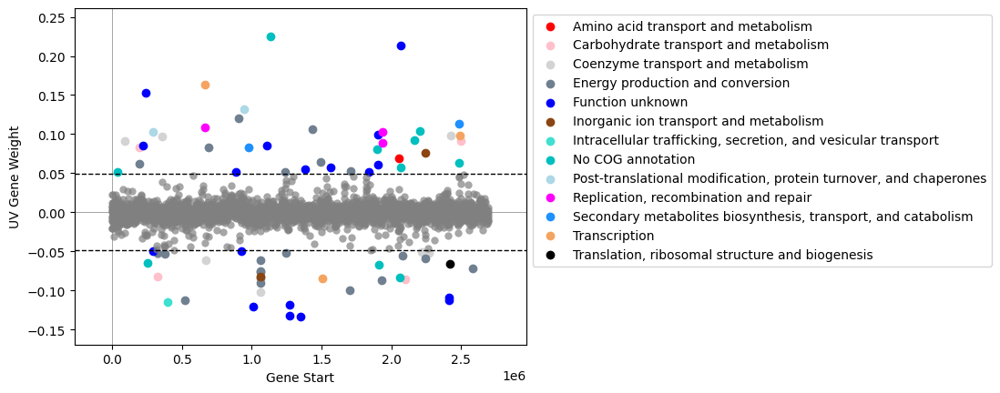

In [683]:
plot_gene_weights(ica_data,'RpaB')

<AxesSubplot:ylabel='UV iModulon\nActivity'>

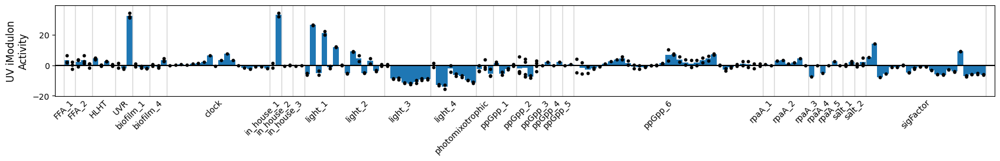

In [684]:
plot_activities(ica_data,'RpaB')

<AxesSubplot:ylabel='RpaB iModulon\nActivity'>

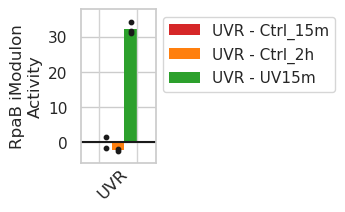

In [1788]:
plot_activities(ica_data,'RpaB',projects = ['UVR'])

<AxesSubplot:ylabel='RpaB iModulon\nActivity'>

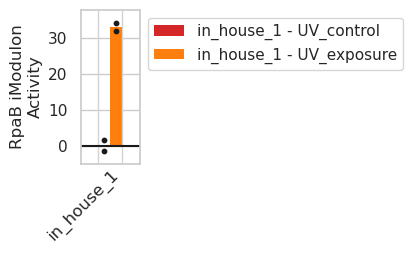

In [1789]:
plot_activities(ica_data,'RpaB',projects = ['in_house_1'])

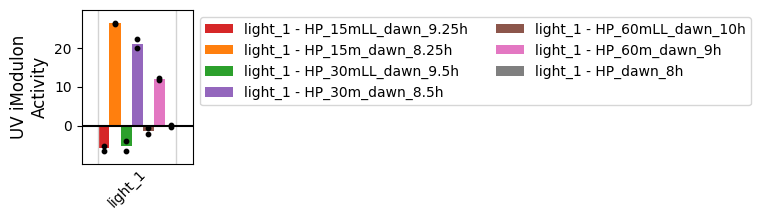

In [91]:
plot_activities(ica_data,'RpaB',projects = ['light_1'])

In [800]:
# https://www.pnas.org/doi/full/10.1073/pnas.2211789119
de = pd.read_excel('~/Downloads/pnas.2211789119.sd01.xlsx',index_col=0)

In [801]:
de_15m = de[(de['log2FoldChange_15m'] > 2) | (de['log2FoldChange_15m'] < -2) & (de['padj_15m'] < 0.05)]

In [802]:
de_2hr = de[(de['log2FoldChange_2hr'] > 2) | (de['log2FoldChange_2hr'] < -2) & (de['padj_2hr'] < 0.05)]

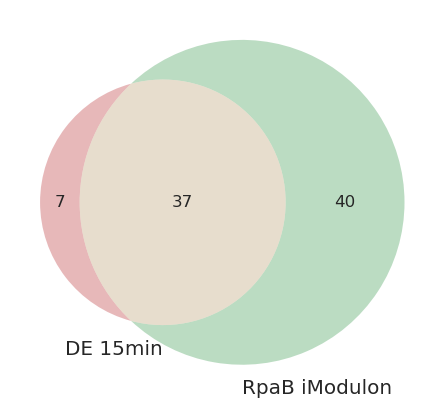

In [1790]:
venn2([set(de_15m.index),set(ica_data.view_imodulon('RpaB').index)],set_labels=('DE 15min','RpaB iModulon'))

## Functional -- Biofilm

In [696]:
ica_data.view_imodulon('Biofilm-1')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_1128,0.191740,Synpcc7942_1128,CP000100.1,,1147349,1148437,+,conserved hypothetical protein,"Secondary metabolites biosynthesis, transport,...",Q31P61,Op856,
Synpcc7942_1132,0.155034,Synpcc7942_1132,CP000100.1,,1151670,1153373,-,conserved hypothetical protein,Defense mechanisms,Q31P57,Op860,
Synpcc7942_1133,0.247298,Synpcc7942_1133,CP000100.1,,1153415,1155559,-,bacteriocin-processing peptidase. Cysteine pep...,Defense mechanisms,Q31P56,Op861,
Synpcc7942_1134,0.469370,Synpcc7942_1134,CP000100.1,,1155654,1155962,-,hypothetical protein,No COG annotation,Q31P55,Op862,
Synpcc7942_1798,0.170659,Synpcc7942_1798,CP000100.1,,1867864,1868490,+,conserved hypothetical protein,No COG annotation,Q31M91,Op1355,


<AxesSubplot:xlabel='Gene Start', ylabel='Biofilm-1 Gene Weight'>

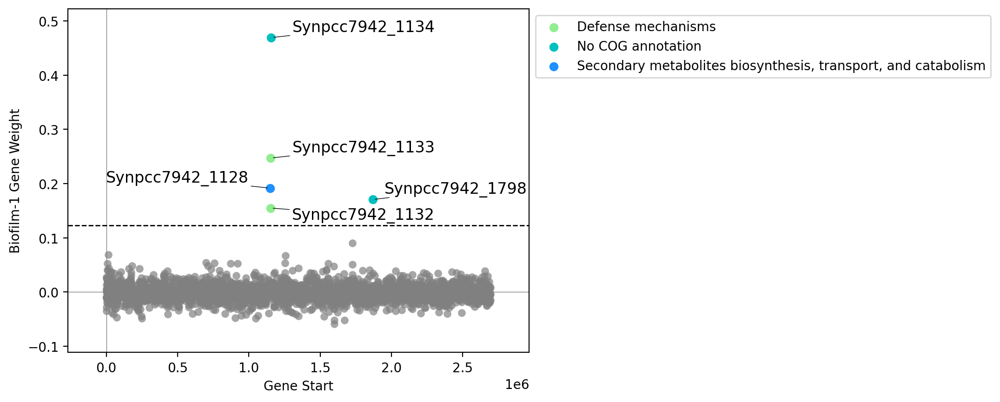

In [858]:
plot_gene_weights(ica_data,'Biofilm-1')

In [702]:
ica_data.view_imodulon('Biofilm-2').sort_values('gene_weight',ascending=False)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0049,0.258774,-,CP000100.1,,49550,49984,-,pilin polypeptide PilA-like,"Intracellular trafficking, secretion, and vesi...",Q31S88,Op80,
Synpcc7942_2070,0.206815,pilT1,CP000100.1,,2146366,2147454,-,twitching motility protein,Cell motility,Q31LG9,Op1558,
Synpcc7942_1890,0.201919,Synpcc7942_1890,CP000100.1,,1963748,1964254,+,conserved hypothetical protein,No COG annotation,Q31LZ9,Op1424,
Synpcc7942_2069,0.180399,pilC,CP000100.1,,2145109,2146341,-,fimbrial assembly protein PilC-like,"Intracellular trafficking, secretion, and vesi...",Q31LH0,Op1558,
Synpcc7942_1821,0.166704,Synpcc7942_1821,CP000100.1,,1893904,1894263,+,conserved hypothetical protein,No COG annotation,Q8GJL3,Op1376,
Synpcc7942_2483,0.161619,Synpcc7942_2483,CP000100.1,,2563680,2565164,-,conserved hypothetical protein,No COG annotation,Q31KA6,Op1862,
Synpcc7942_2482,0.146825,Synpcc7942_2482,CP000100.1,,2563111,2563704,-,hypothetical protein,No COG annotation,Q8GIS8,Op1861,
Synpcc7942_0048,0.143679,-,CP000100.1,,48927,49361,-,pilin polypeptide PilA-like,"Intracellular trafficking, secretion, and vesi...",Q31S89,Op79,
Synpcc7942_0046,0.137374,Synpcc7942_0046,CP000100.1,,45164,46507,+,Methylase involved in ubiquinone/menaquinone b...,"Secondary metabolites biosynthesis, transport,...",Q31S91,Op77,
Synpcc7942_1839,0.134953,Synpcc7942_1839,CP000100.1,,1906094,1906834,-,conserved hypothetical protein,Function unknown,Q31M50,Op1389,


<AxesSubplot:xlabel='Gene Start', ylabel='Biofilm-2 Gene Weight'>

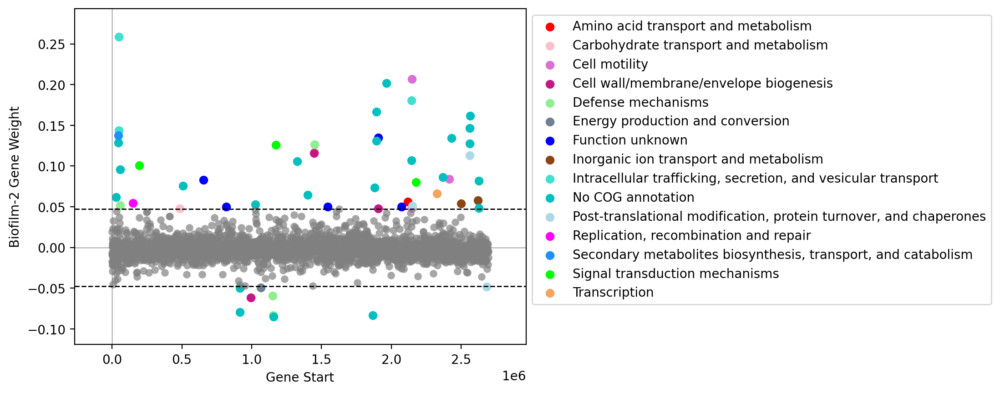

In [855]:
plot_gene_weights(ica_data,'Biofilm-2')

<AxesSubplot:xlabel='Biofilm-2 iModulon Activity', ylabel='competence iModulon Activity'>

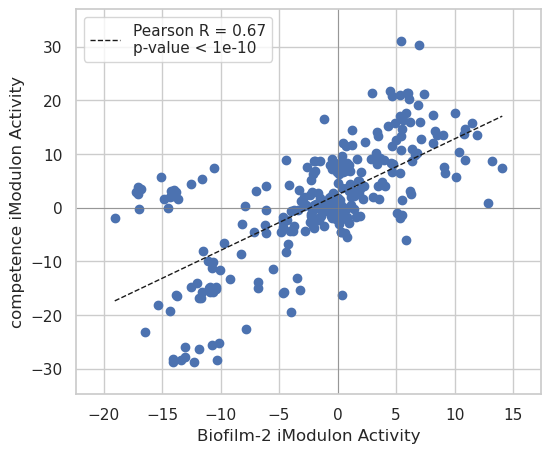

In [1792]:
compare_activities(ica_data,'Biofilm-2','competence')

<AxesSubplot:ylabel='Biofilm-1 iModulon\nActivity'>

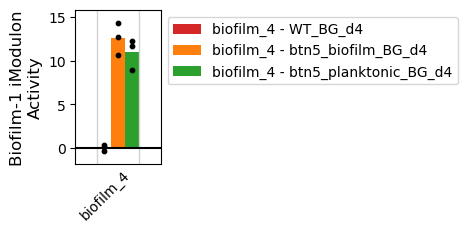

In [767]:
plot_activities(ica_data,'Biofilm-1',projects='biofilm_4')

<AxesSubplot:ylabel='Biofilm-2 iModulon\nActivity'>

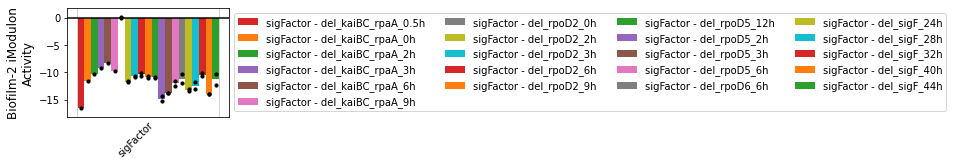

In [30]:
plot_activities(ica_data,'Biofilm-2',projects='sigFactor')

<AxesSubplot:ylabel='Biofilm-2 iModulon\nActivity'>

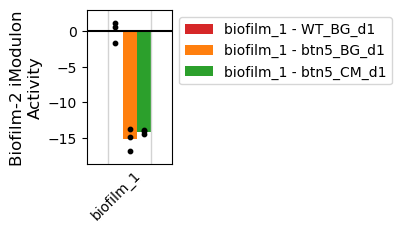

In [769]:
plot_activities(ica_data,'Biofilm-2',projects='biofilm_1')

<AxesSubplot:ylabel='Biofilm-1 iModulon\nActivity'>

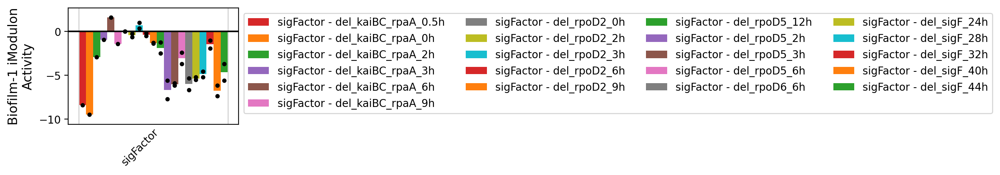

In [853]:
plot_activities(ica_data,'Biofilm-1',projects='sigFactor')

/home/annie/anaconda3/envs/modulome/lib/python3.7/site-packages/pymodulon/util.py:174: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`



<AxesSubplot:xlabel='biofilm_4:WT_BG_d4', ylabel='biofilm_4:btn5_biofilm_BG_d4'>

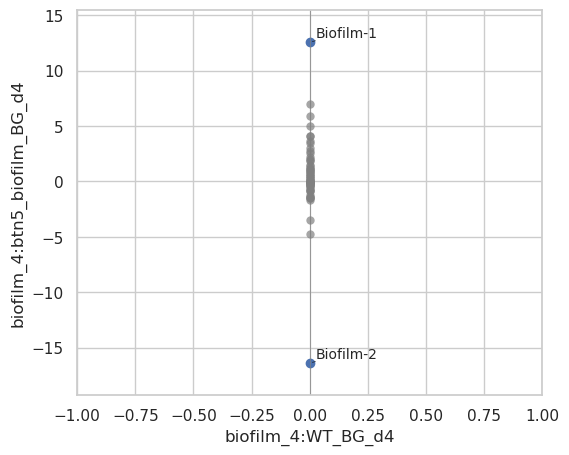

In [1793]:
plot_dima(ica_data,'biofilm_4:WT_BG_d4','biofilm_4:btn5_biofilm_BG_d4')

<AxesSubplot:ylabel='Biofilm-1 iModulon\nActivity'>

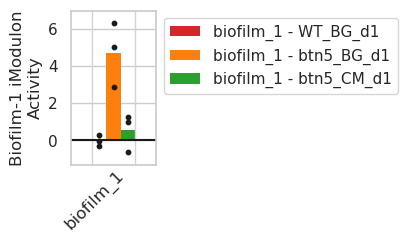

In [1794]:
plot_activities(ica_data,'Biofilm-1',projects='biofilm_1')

<AxesSubplot:ylabel='Biofilm-1 iModulon\nActivity'>

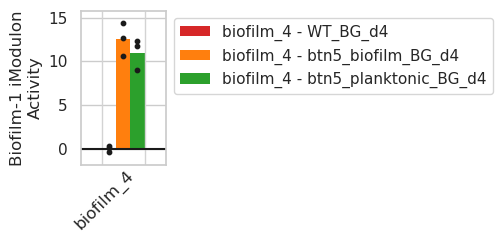

In [1795]:
plot_activities(ica_data,'Biofilm-1',projects='biofilm_4')

<AxesSubplot:xlabel='biofilm_1:WT_BG_d1', ylabel='biofilm_1:btn5_BG_d1'>

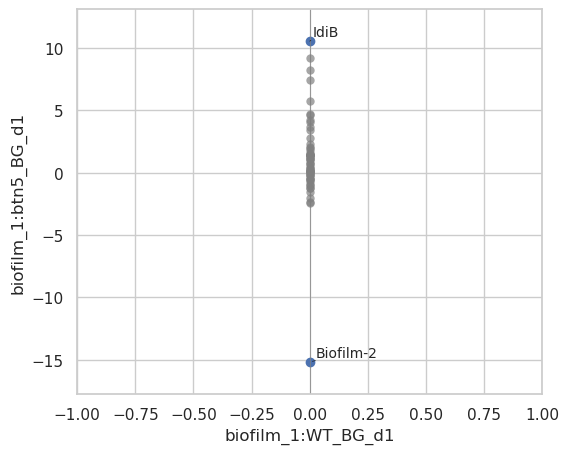

In [1796]:
plot_dima(ica_data,'biofilm_1:WT_BG_d1','biofilm_1:btn5_BG_d1')

<AxesSubplot:ylabel='Biofilm-1 iModulon\nActivity'>

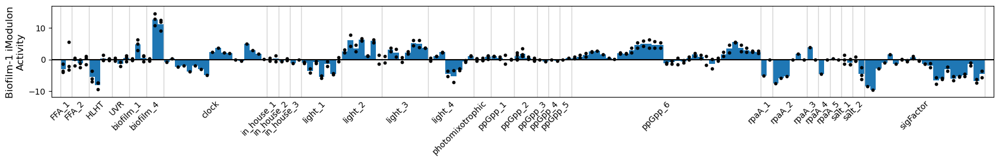

In [142]:
plot_activities(ica_data,'Biofilm-1')

<AxesSubplot:ylabel='Biofilm-2 iModulon\nActivity'>

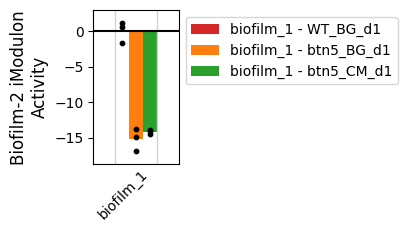

In [698]:
plot_activities(ica_data,'Biofilm-2',projects='biofilm_1')

<AxesSubplot:ylabel='Biofilm-2 iModulon\nActivity'>

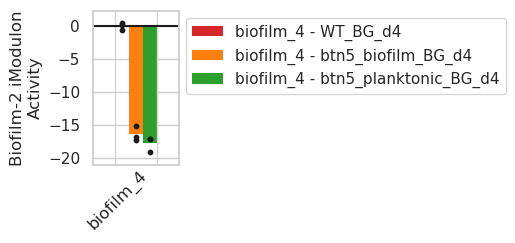

In [1797]:
plot_activities(ica_data,'Biofilm-2',projects='biofilm_4')

<AxesSubplot:xlabel='biofilm_4:WT_BG_d4', ylabel='biofilm_4:btn5_biofilm_BG_d4'>

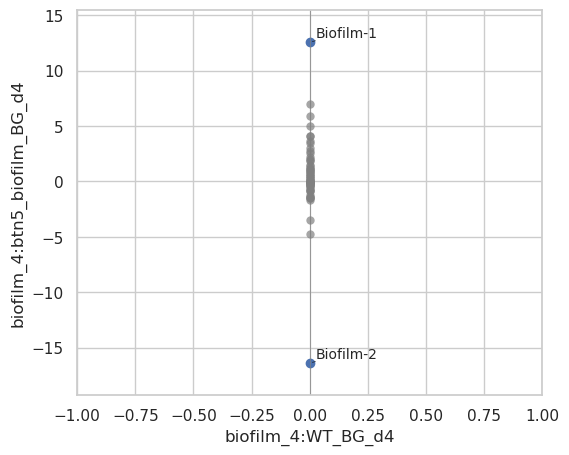

In [1798]:
plot_dima(ica_data,'biofilm_4:WT_BG_d4','biofilm_4:btn5_biofilm_BG_d4')

NC2-1 mutation proved effective in improving the HLHT tolerance in Synechococcus

<AxesSubplot:ylabel='Biofilm-1 iModulon\nActivity'>

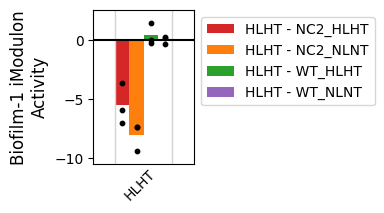

In [896]:
plot_activities(ica_data,'Biofilm-1',projects='HLHT')

<AxesSubplot:ylabel='Biofilm-2 iModulon\nActivity'>

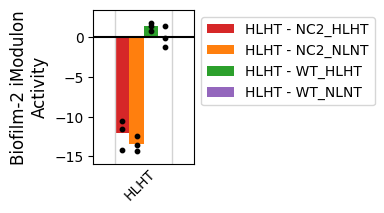

In [894]:
plot_activities(ica_data,'Biofilm-2',projects='HLHT')

<AxesSubplot:xlabel='HLHT:NC2_HLHT', ylabel='HLHT:WT_HLHT'>

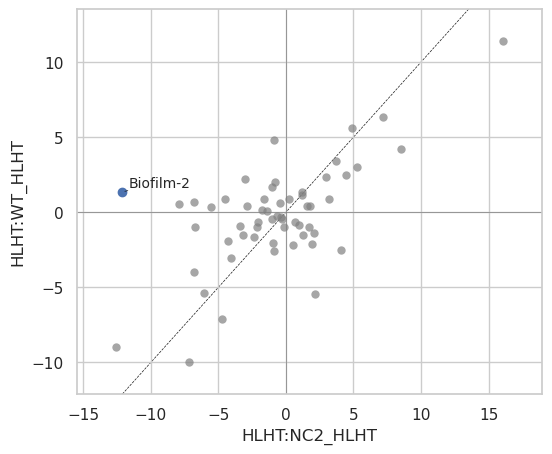

In [1799]:
plot_dima(ica_data,'HLHT:NC2_HLHT','HLHT:WT_HLHT')

<AxesSubplot:xlabel='HLHT:WT_NLNT', ylabel='HLHT:NC2_NLNT'>

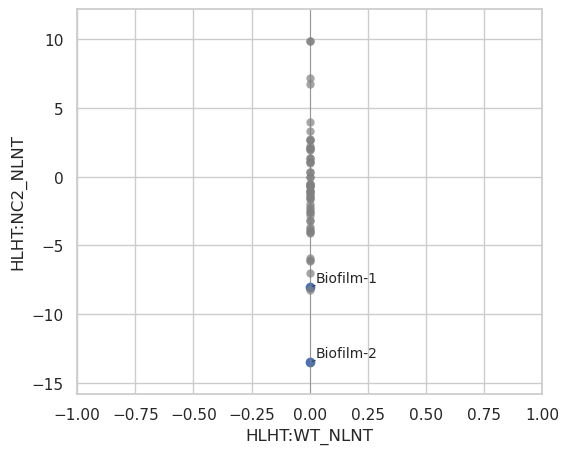

In [1800]:
plot_dima(ica_data,'HLHT:WT_NLNT','HLHT:NC2_NLNT')

In [770]:
# https://www.frontiersin.org/journals/microbiology/articles/10.3389/fmicb.2022.899150/full
de_biofilm = pd.read_excel('~/Downloads/Data_Sheet_2.XLSX',sheet_name='6) DEG Summary',
                           header=7)

In [ ]:
# with biofilm-1 up: 10, 15, 16, 17, 18, 21, 22, 23, 25, 26, 29, 30
# with biofilm-2 down: 10, 11, 15, 16, 20, 21, 22, 23, 25, 26

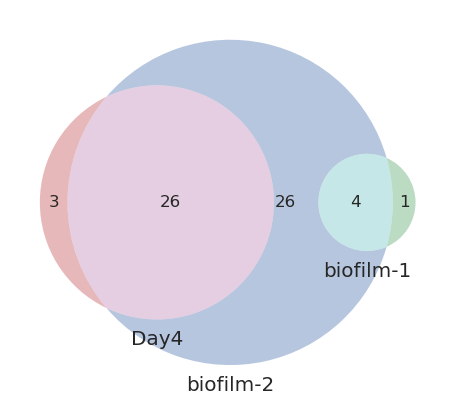

In [1801]:
venn3([set(de_biofilm[de_biofilm[de_biofilm.columns[15]] == 'Down'].ORF),
       set(ica_data.view_imodulon('Biofilm-1').index),
       set(ica_data.view_imodulon('Biofilm-2').index)],
       set_labels=['Day4','biofilm-1','biofilm-2'])

## Functional -- sufR and HLHT

In [899]:
ica_data.view_imodulon('sufR')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_1731,0.129343,Synpcc7942_1731,CP000100.1,NaN,1802686,1803171,-,conserved hypothetical protein,Nucleotide transport and metabolism,Q31MF8,Op1306,NaN
Synpcc7942_1732,0.106568,Synpcc7942_1732,CP000100.1,NaN,1803168,1803578,-,conserved hypothetical protein,No COG annotation,Q31MF7,Op1306,NaN
Synpcc7942_1734,0.130198,ftrC,CP000100.1,NaN,1804395,1804757,+,ferredoxin-thioredoxin reductase catalytic chain,Energy production and conversion,Q31MF5,Op1307,sufR
Synpcc7942_1735,0.141866,sufB,CP000100.1,NaN,1804805,1806244,+,Iron-regulated ABC transporter membrane compon...,"Post-translational modification, protein turno...",Q31MF4,Op1308,sufR
Synpcc7942_1736,0.172991,sufC,CP000100.1,NaN,1806290,1807075,+,Iron-regulated ABC transporter ATPase subunit ...,"Post-translational modification, protein turno...",Q31MF3,Op1309,sufR
Synpcc7942_1737,0.176528,sufD,CP000100.1,NaN,1807075,1808403,+,Iron-regulated ABC transporter permease protei...,"Post-translational modification, protein turno...",Q31MF2,Op1309,sufR
Synpcc7942_1738,0.186087,sufS,CP000100.1,NaN,1808413,1809672,+,cysteine desulfurase,Amino acid transport and metabolism,Q31MF1,Op1309,sufR
Synpcc7942_1739,0.176539,merR,CP000100.1,NaN,1809717,1810142,+,transcriptional regulator%2C MerR family,Transcription,Q31MF0,Op1310,NaN


<AxesSubplot:xlabel='Gene Start', ylabel='sufR Gene Weight'>

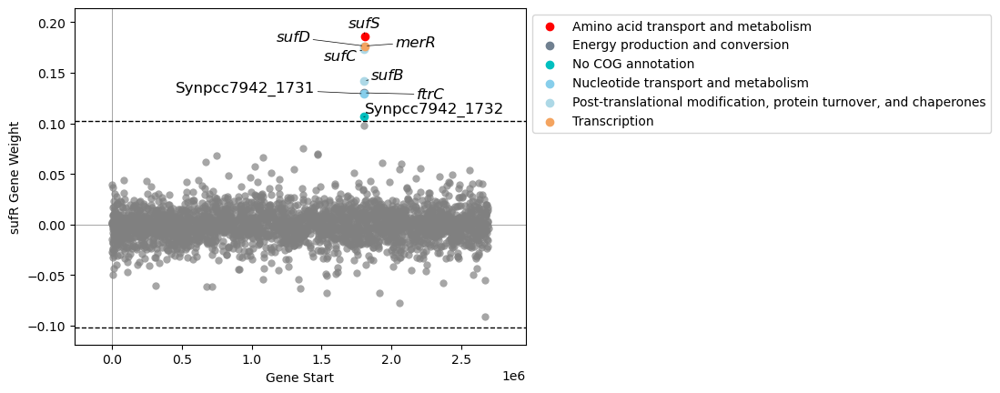

In [821]:
plot_gene_weights(ica_data,'sufR')

<AxesSubplot:ylabel='sufR iModulon\nActivity'>

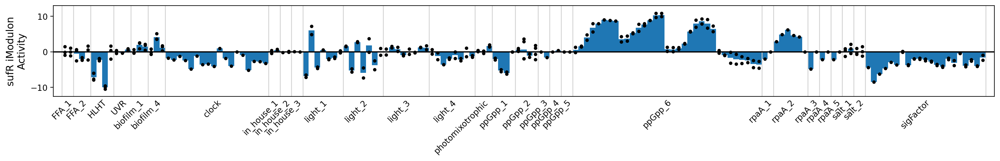

In [575]:
plot_activities(ica_data,'sufR')

<AxesSubplot:ylabel='sufR iModulon\nActivity'>

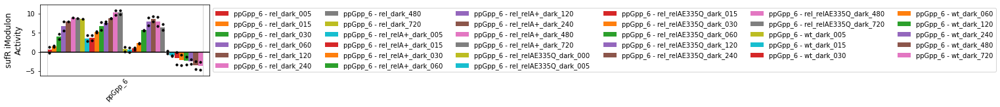

In [39]:
plot_activities(ica_data,'sufR',projects='ppGpp_6')

<AxesSubplot:ylabel='sufR iModulon\nActivity'>

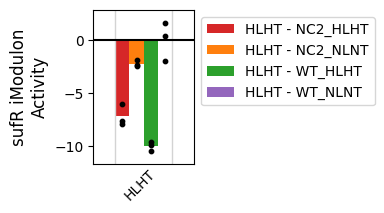

In [898]:
plot_activities(ica_data,'sufR',projects='HLHT')

<AxesSubplot:ylabel='sufR iModulon\nActivity'>

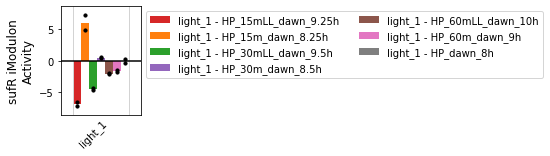

In [33]:
plot_activities(ica_data,'sufR',projects='light_1')

<AxesSubplot:xlabel='HLHT:WT_NLNT', ylabel='HLHT:WT_HLHT'>

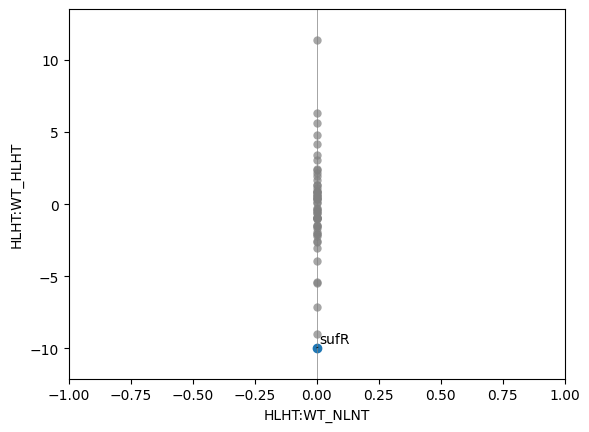

In [812]:
plot_dima(ica_data,'HLHT:WT_NLNT','HLHT:WT_HLHT')

## Regulon discovery -- CysR

In [890]:
ica_data.view_imodulon('CysR')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0019,0.089516,sir,CP000100.1,NaN,18615,20489,+,sulfite reductase (ferredoxin),Energy production and conversion,P30008,Op36,NaN
Synpcc7942_0020,0.073068,Synpcc7942_0020,CP000100.1,NaN,20490,21092,+,conserved hypothetical protein,No COG annotation,Q31SB7,Op36,NaN
Synpcc7942_0755,-0.063730,Synpcc7942_0755,CP000100.1,NaN,749431,750009,+,conserved hypothetical protein,Function unknown,Q31Q82,Op577,NaN
Synpcc7942_0797,-0.068807,Synpcc7942_0797,CP000100.1,NaN,792010,792270,+,hypothetical protein,No COG annotation,Q31Q40,Op614,NaN
Synpcc7942_0900,0.082095,Synpcc7942_0900,CP000100.1,NaN,909440,909643,-,conserved hypothetical protein,No COG annotation,Q31PT9,Op689,NaN
Synpcc7942_1240,-0.061442,nirA,CP000100.1,NaN,1263263,1264801,-,assimilatory nitrite reductase (ferredoxin) pr...,Energy production and conversion,P39661,Op934,"ntcA,ntcB"
Synpcc7942_1377,0.068692,Synpcc7942_1377,CP000100.1,NaN,1417540,1419879,+,metal dependent phosphohydrolase,Transcription,Q31NG2,Op1036,NaN
Synpcc7942_1661,0.055086,Synpcc7942_1661,CP000100.1,NaN,1731159,1731722,+,conserved hypothetical protein,No COG annotation,Q31MM8,Op1255,NaN
Synpcc7942_1680,0.208429,cysA,CP000100.1,NaN,1747842,1748858,-,Sulphate transport system permease protein 1,Inorganic ion transport and metabolism,P14788,Op1268,NaN
Synpcc7942_1681,0.350773,sbpA,CP000100.1,NaN,1749076,1750128,+,Thiosulphate-binding protein,Inorganic ion transport and metabolism,P27366,Op1269,NaN


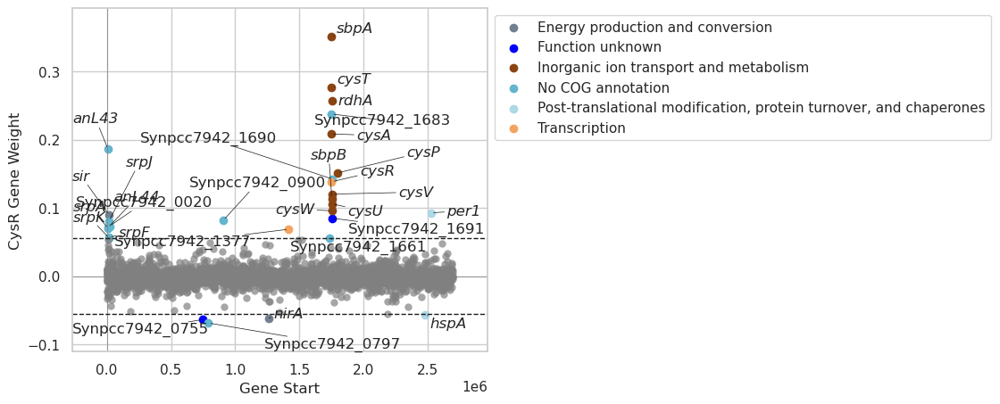

In [1414]:
plot_gene_weights(ica_data,'CysR',show_labels=True)
# plt.savefig('../data/Figures/CysR.pdf',bbox_inches='tight',transparent=True)

<AxesSubplot:ylabel='CysR iModulon\nActivity'>

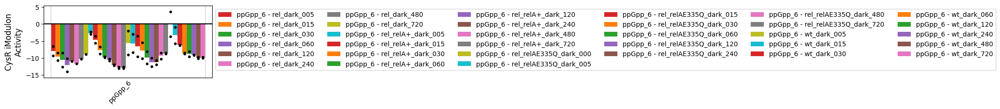

In [79]:
plot_activities(ica_data,'CysR',projects='ppGpp_6')

## Previous characterization efforts

/home/annie/anaconda3/envs/modulome/lib/python3.7/site-packages/sklearn/tree/_classes.py:370: FutureWarning:

Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.



<AxesSubplot:xlabel='prophage'>

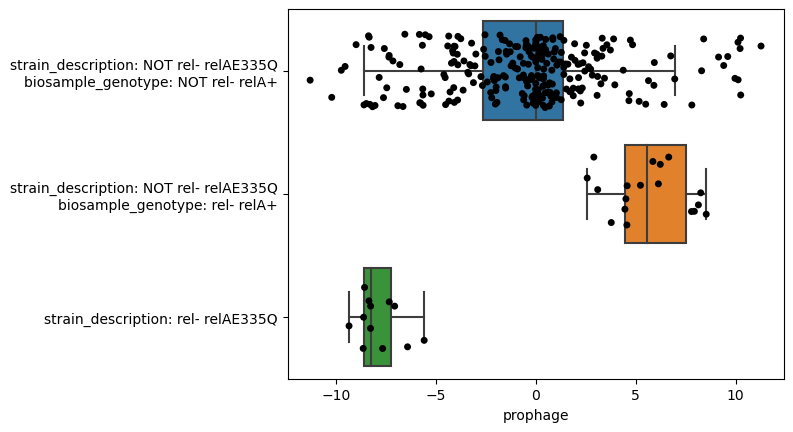

In [832]:
metadata_boxplot(ica_data,'prophage',n_boxes=3)

<AxesSubplot:ylabel='prophage iModulon\nActivity'>

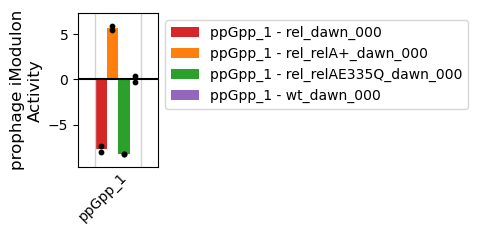

In [833]:
plot_activities(ica_data,'prophage',projects='ppGpp_1')

In [1802]:
ica_data.view_imodulon('RpaC')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0096,0.080034,Synpcc7942_0096,CP000100.1,,93764,94285,-,conserved hypothetical protein,Function unknown,Q31S41,Op109,
Synpcc7942_0122,0.065471,Synpcc7942_0122,CP000100.1,,121831,123408,-,EAL,Signal transduction mechanisms,Q31S15,Op129,
Synpcc7942_0193,0.078883,Synpcc7942_0193,CP000100.1,,192247,192471,-,conserved hypothetical protein,No COG annotation,Q31RU4,Op179,
Synpcc7942_0215,0.117702,Synpcc7942_0215,CP000100.1,,217424,217813,-,conserved hypothetical protein,"Replication, recombination and repair",Q31RS2,Op194,
Synpcc7942_0236,0.073112,Synpcc7942_0236,CP000100.1,,232018,232557,+,cyclic nucleotide-binding domain (cNMP-BD) pro...,No COG annotation,Q31RQ1,Op209,
Synpcc7942_0267,0.079543,rsmG,CP000100.1,,263757,264485,+,methyltransferase GidB,"Translation, ribosomal structure and biogenesis",Q31RM0,Op230,
Synpcc7942_0415,0.082752,Synpcc7942_0415,CP000100.1,,405168,406145,-,conserved hypothetical protein,Function unknown,Q31R72,Op335,
Synpcc7942_0433,0.112566,Synpcc7942_0433,CP000100.1,,423632,424840,+,conserved hypothetical protein,No COG annotation,Q8GMQ5,Op348,
Synpcc7942_0708,-0.072814,ubiB1,CP000100.1,,698708,700459,+,conserved hypothetical protein,Function unknown,Q31QC9,Op550,
Synpcc7942_0768,0.068486,Synpcc7942_0768,CP000100.1,,760522,761178,+,conserved hypothetical protein,No COG annotation,Q31Q69,Op589,


<AxesSubplot:ylabel='RpaC iModulon\nActivity'>

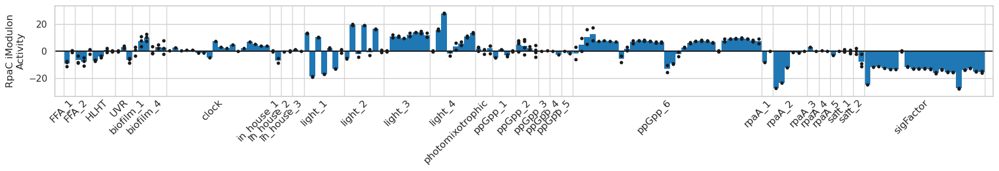

In [1803]:
plot_activities(ica_data,'RpaC')

kaiABC & rpoD & sigF

<AxesSubplot:ylabel='RpaC iModulon\nActivity'>

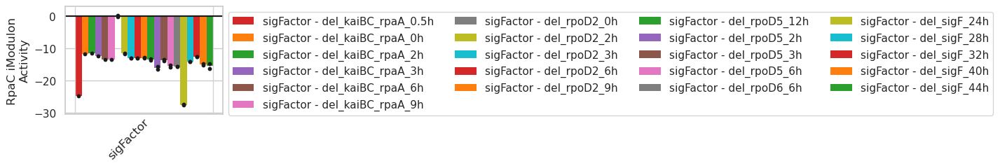

In [1804]:
plot_activities(ica_data,'RpaC',projects='sigFactor')

### iModulon 1: PSII

<AxesSubplot:xlabel='Gene Start', ylabel='1 Gene Weight'>

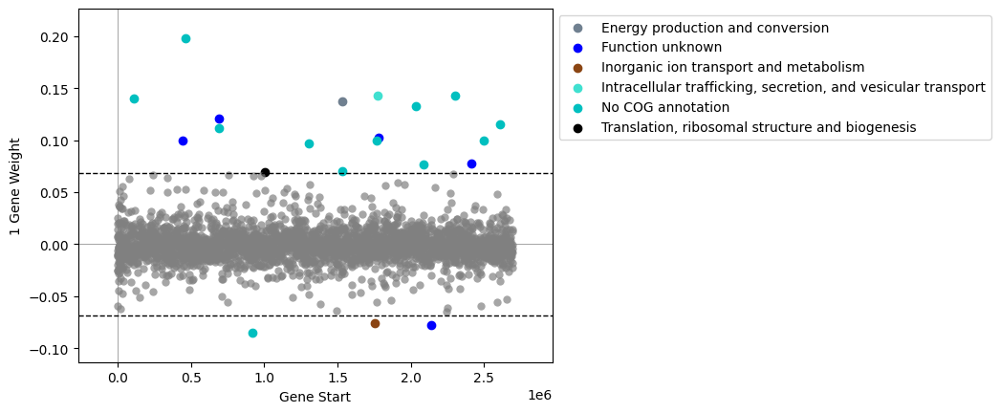

In [243]:
plot_gene_weights(ica_data,1)

<AxesSubplot:ylabel='1 iModulon\nActivity'>

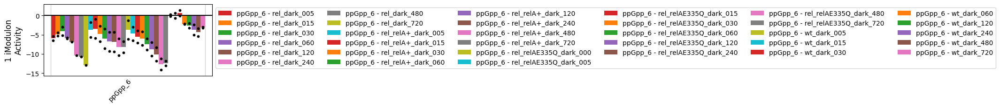

In [245]:
plot_activities(ica_data,1,projects = ['ppGpp_6'])

<AxesSubplot:ylabel='1 iModulon\nActivity'>

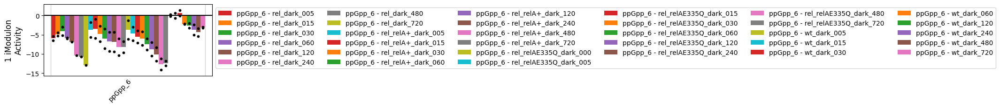

In [246]:
plot_activities(ica_data,1,projects = ['ppGpp_6'])

In [242]:
DF_enrichments[DF_enrichments.imodulon==1].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [249]:
# Update the ICA data object

# ica_data.rename_imodulons({1:'PSII-1'})
# ica_data.imodulon_table.loc['PSII-1','category'] = 'functional'

### iModulon 8: unknown

In [251]:
ica_data.view_imodulon(8)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0074,0.056229,Synpcc7942_0074,CP000100.1,,73306,73659,-,conserved hypothetical protein,No COG annotation,Q31S63,Op93,
Synpcc7942_0229,0.187914,Synpcc7942_0229,CP000100.1,,225658,226221,+,hypothetical protein,Function unknown,Q31RQ8,Op203,
Synpcc7942_0373,0.182087,Synpcc7942_0373,CP000100.1,,366738,368024,-,conserved hypothetical protein,Function unknown,Q31RB4,Op304,
Synpcc7942_0374,0.242159,Synpcc7942_0374,CP000100.1,,368290,368574,-,hypothetical protein,No COG annotation,Q31RB3,Op305,
Synpcc7942_0406,0.135708,Synpcc7942_0406,CP000100.1,,399953,400354,+,conserved hypothetical protein,No COG annotation,Q31R81,Op328,
Synpcc7942_0408,0.073553,trpF,CP000100.1,,400768,401421,+,phosphoribosylanthranilate isomerase,Amino acid transport and metabolism,Q31R79,Op330,
Synpcc7942_0443,0.178028,sek0027,CP000100.1,,433076,434317,-,conserved hypothetical protein,"Intracellular trafficking, secretion, and vesi...",Q8GMR4,Op356,
Synpcc7942_0444,0.192963,sek0026,CP000100.1,,434357,435040,-,conserved hypothetical protein,No COG annotation,Q8GAA4,Op356,
Synpcc7942_0553,0.073569,hlyD1,CP000100.1,,535182,536534,-,Secretion protein HlyD,Cell wall/membrane/envelope biogenesis,Q31QT4,Op432,
Synpcc7942_0585,0.131661,Synpcc7942_0585,CP000100.1,,566168,567388,-,PDZ/DHR/GLGF,"Post-translational modification, protein turno...",Q31QQ2,Op457,


<AxesSubplot:xlabel='Gene Start', ylabel='8 Gene Weight'>

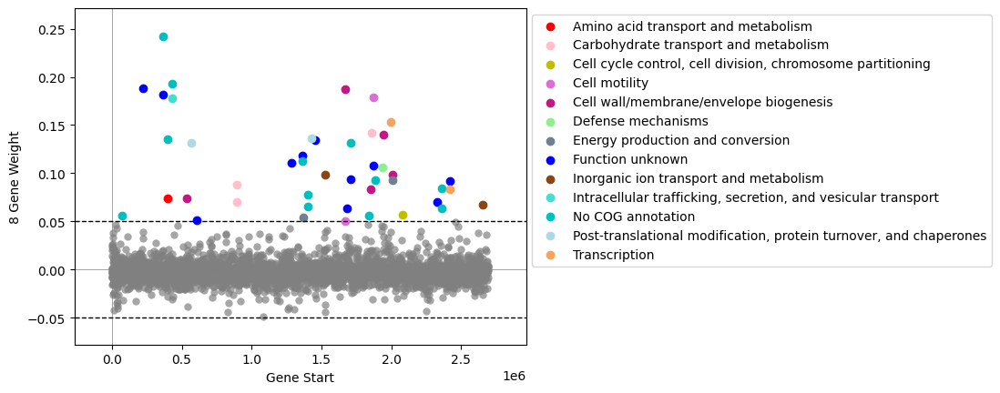

In [252]:
plot_gene_weights(ica_data,8)

<AxesSubplot:ylabel='8 iModulon\nActivity'>

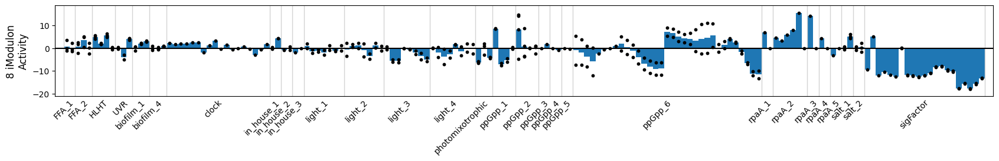

In [253]:
plot_activities(ica_data,8)

<AxesSubplot:ylabel='8 iModulon\nActivity'>

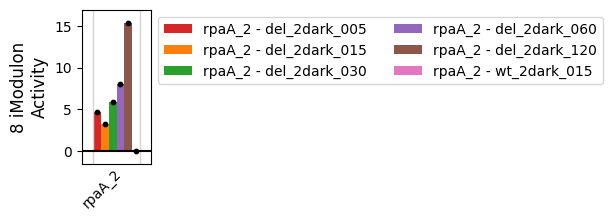

In [226]:
plot_activities(ica_data,8,projects='rpaA_2')

<AxesSubplot:ylabel='8 iModulon\nActivity'>

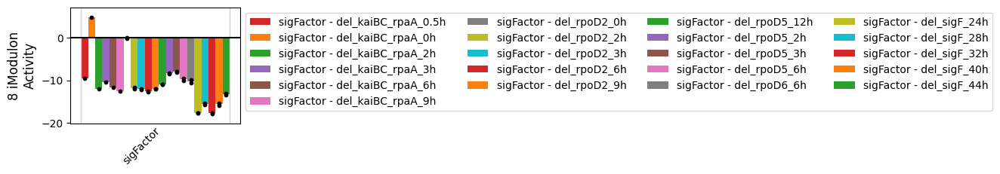

In [208]:
plot_activities(ica_data,8,projects = ['sigFactor'])

<AxesSubplot:ylabel='8 iModulon\nActivity'>

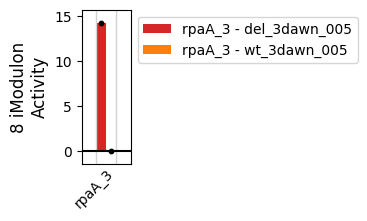

In [124]:
plot_activities(ica_data,8,projects = ['rpaA_3'])

<AxesSubplot:ylabel='8 iModulon\nActivity'>

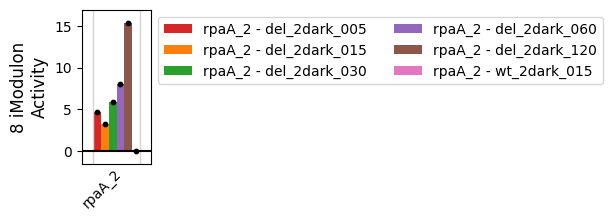

In [207]:
plot_activities(ica_data,8,projects = ['rpaA_2'])

In [206]:
DF_enrichments[DF_enrichments.imodulon=='8'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [331]:
# ica_data.rename_imodulons({8:'unchar-1'})
# ica_data.imodulon_table.loc['unchar-1','category'] = 'uncharacterized'

### iModulon 11: unknown - look closer

In [1226]:
ica_data.view_imodulon('unchar_3')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0095,-0.081149,rpaA,CP000100.1,,92590,93339,-,two component transcriptional regulator%2C win...,Transcription,Q31S42,Op108,
Synpcc7942_0195,0.060531,Synpcc7942_0195,CP000100.1,,195630,196058,+,conserved hypothetical protein,Signal transduction mechanisms,Q31RU2,Op181,
Synpcc7942_0267,0.083137,rsmG,CP000100.1,,263757,264485,+,methyltransferase GidB,"Translation, ribosomal structure and biogenesis",Q31RM0,Op230,
Synpcc7942_0291,0.062169,Synpcc7942_0291,CP000100.1,,288312,288530,+,conserved hypothetical protein,Function unknown,Q31RJ6,Op244,
Synpcc7942_0491,0.107984,ndhQ,CP000100.1,,479700,479837,+,hypothetical protein,No COG annotation,Q31QZ6,Op393,
Synpcc7942_0497,0.068040,-,CP000100.1,,484328,484504,-,conserved hypothetical protein,No COG annotation,Q31QZ0,Op398,
Synpcc7942_0522,0.086381,Synpcc7942_0522,CP000100.1,,507941,508312,+,hypothetical protein,No COG annotation,Q31QW5,Op411,
Synpcc7942_0573,0.068486,Synpcc7942_0573,CP000100.1,,555297,555533,-,hypothetical protein,No COG annotation,Q31QR4,Op447,
Synpcc7942_0592,0.069449,pfkA,CP000100.1,,579312,580394,-,6-phosphofructokinase,Coenzyme transport and metabolism,Q31QP5,Op463,
Synpcc7942_0667,0.060560,Synpcc7942_0667,CP000100.1,,663985,664296,+,conserved hypothetical protein,No COG annotation,Q31QH0,Op520,


<AxesSubplot:xlabel='Gene Start', ylabel='11 Gene Weight'>

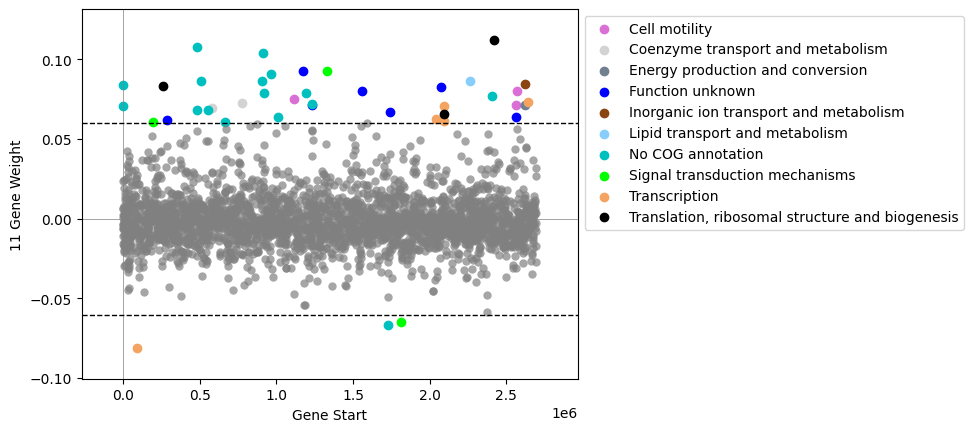

In [257]:
plot_gene_weights(ica_data,11)

<AxesSubplot:ylabel='11 iModulon\nActivity'>

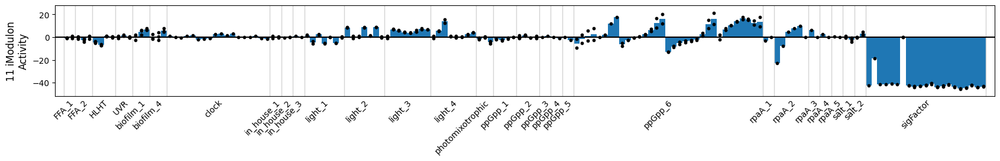

In [255]:
plot_activities(ica_data,11)

<AxesSubplot:ylabel='kaiABC iModulon\nActivity'>

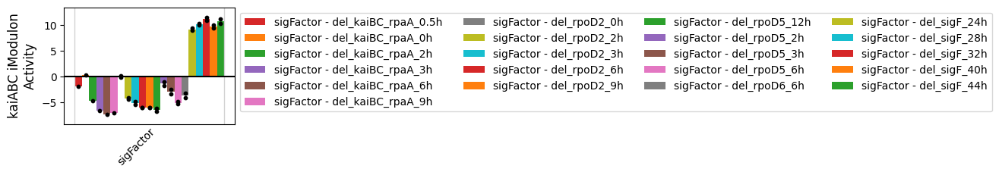

In [1637]:
plot_activities(ica_data,'kaiABC',projects='sigFactor')

<AxesSubplot:xlabel='kaiABC iModulon Activity', ylabel='unchar_3 iModulon Activity'>

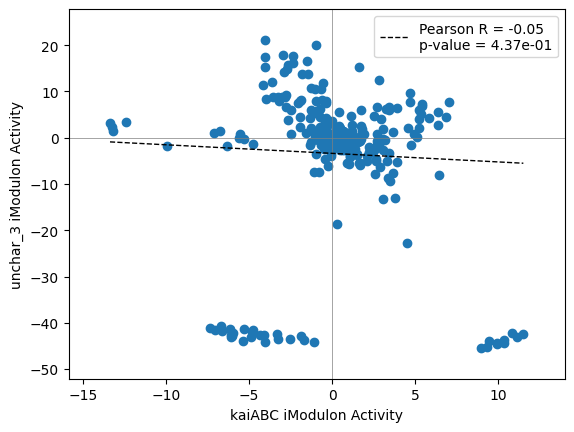

In [1636]:
compare_activities(ica_data,'kaiABC','unchar_3')

<AxesSubplot:ylabel='11 iModulon\nActivity'>

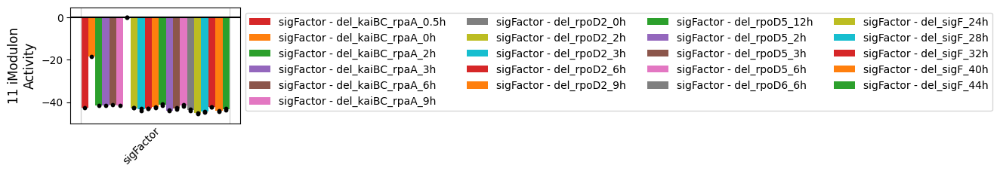

In [34]:
plot_activities(ica_data,11,projects='sigFactor')

In [258]:
DF_enrichments[DF_enrichments.imodulon=='11'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [332]:
# ica_data.rename_imodulons({11:'unchar-2'})
# ica_data.imodulon_table.loc['unchar-2','category'] = 'uncharacterized'

### iModulon 15: livJHMGF 
BCAA transporter

In [40]:
ica_data.view_imodulon(15)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon
Synpcc7942_1377,0.121401,Synpcc7942_1377,CP000100.1,NaN,1417540,1419879,+,metal dependent phosphohydrolase,Transcription,Q31NG2,Op1036
Synpcc7942_2492,0.148315,livF,CP000100.1,NaN,2573355,2574068,-,ATPase,Amino acid transport and metabolism,Q31K97,Op1871
Synpcc7942_2493,0.203961,livG,CP000100.1,NaN,2574061,2574822,-,ATPase,Amino acid transport and metabolism,Q8GIU0,Op1871
Synpcc7942_2494,0.221265,livM,CP000100.1,NaN,2574819,2575742,-,putative branched-chain amino acid ABC transpo...,Amino acid transport and metabolism,Q8GIU1,Op1871
Synpcc7942_2495,0.229308,livH,CP000100.1,NaN,2575746,2576687,-,integral membrane protein of the ABC-type Nat ...,Amino acid transport and metabolism,Q935W9,Op1871
Synpcc7942_2496,0.219909,livJ,CP000100.1,NaN,2576687,2577886,-,branched-chain amino-acid ABC transport system...,Amino acid transport and metabolism,Q935X0,Op1871
Synpcc7942_2497,0.169913,ndk,CP000100.1,NaN,2577916,2578371,-,nucleoside diphosphate kinase,Nucleotide transport and metabolism,P50590,Op1871


<AxesSubplot:xlabel='Gene Start', ylabel='15 Gene Weight'>

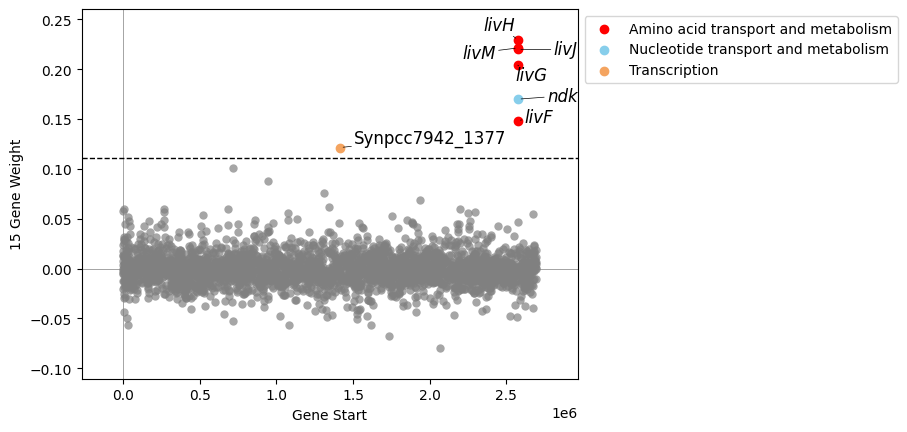

In [79]:
plot_gene_weights(ica_data,15)

<AxesSubplot:ylabel='15 iModulon\nActivity'>

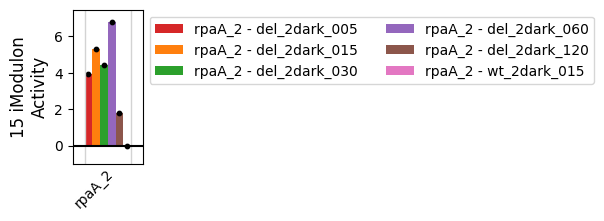

In [27]:
plot_activities(ica_data,15,projects='rpaA_2')

<AxesSubplot:ylabel='15 iModulon\nActivity'>

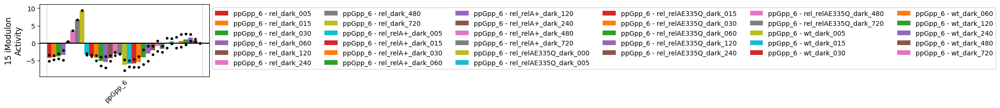

In [28]:
plot_activities(ica_data,15,projects='ppGpp_6')

In [42]:
DF_enrichments[DF_enrichments.imodulon=='15'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [99]:
# Update the ica_data object
# ica_data.rename_imodulons({15:'livJHMGF'})

### iModulon 17: heat shock

In [317]:
ica_data.view_imodulon(17)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0685,0.133449,groEL2,CP000100.1,,678881,680548,+,Chaperonin Cpn60/TCP-1,"Post-translational modification, protein turno...",Q31QF2,Op534,
Synpcc7942_1041,-0.107055,Synpcc7942_1041,CP000100.1,,1055349,1055621,-,hypothetical protein,No COG annotation,Q31PE8,Op795,
Synpcc7942_1290,-0.161369,-,CP000100.1,,1313290,1313460,-,SmtA metallothionein,Function unknown,P30331,Op968,smtB
Synpcc7942_1813,0.146426,htpG,CP000100.1,,1884434,1886350,-,ATP-binding region%2C ATPase-like,"Post-translational modification, protein turno...",Q79N42,Op1370,
Synpcc7942_2313,0.280411,groEL1,CP000100.1,,2381614,2383248,-,Chaperonin Cpn60/TCP-1,"Post-translational modification, protein turno...",P22879,Op1732,
Synpcc7942_2314,0.268450,groES,CP000100.1,,2383296,2383607,-,GroES protein%2C 10 kD chaperonin,"Post-translational modification, protein turno...",P22880,Op1732,"hrcA,hrcA"
Synpcc7942_2468,0.144976,dnaK2,CP000100.1,,2548622,2550526,+,Heat shock protein Hsp70,"Post-translational modification, protein turno...",P50021,Op1849,


<AxesSubplot:xlabel='Gene Start', ylabel='17 Gene Weight'>

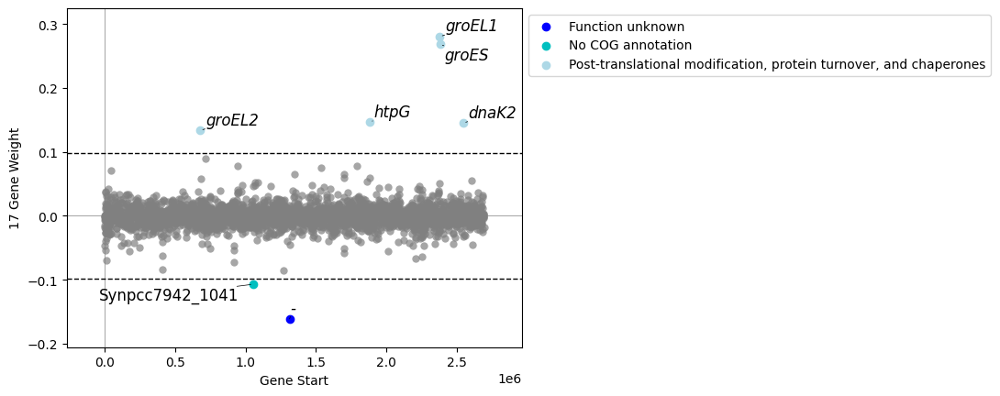

In [318]:
plot_gene_weights(ica_data,17)

<AxesSubplot:ylabel='17 iModulon\nActivity'>

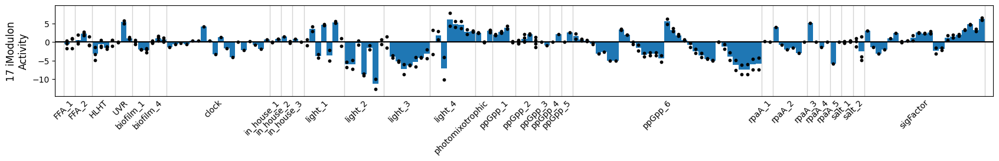

In [319]:
plot_activities(ica_data,17)

In [320]:
DF_enrichments[DF_enrichments.imodulon=='17'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
14,17,map04940,5.898137e-06,0.000302,0.285714,1.000000,0.444444,2.0,2.0,7.0,KEGG pathways,Type I diabetes mellitus,NaN
11,17,map05152,3.852772e-07,0.000079,0.428571,0.428571,0.428571,3.0,7.0,7.0,KEGG pathways,Tuberculosis,NaN
15,17,map05134,3.530041e-05,0.001447,0.285714,0.500000,0.363636,2.0,4.0,7.0,KEGG pathways,Legionellosis,NaN
12,17,map04212,1.808135e-06,0.000185,0.428571,0.272727,0.333333,3.0,11.0,7.0,KEGG pathways,Longevity regulating pathway - worm,NaN
13,17,map03018,4.963617e-06,0.000302,0.428571,0.200000,0.272727,3.0,15.0,7.0,KEGG pathways,RNA degradation,NaN
16,17,map04151,2.622705e-03,0.041358,0.142857,1.000000,0.250000,1.0,1.0,7.0,KEGG pathways,PI3K-Akt signaling pathway,NaN
17,17,map04612,2.622705e-03,0.041358,0.142857,1.000000,0.250000,1.0,1.0,7.0,KEGG pathways,Antigen processing and presentation,NaN
18,17,map04626,2.622705e-03,0.041358,0.142857,1.000000,0.250000,1.0,1.0,7.0,KEGG pathways,Plant-pathogen interaction,NaN
19,17,map04657,2.622705e-03,0.041358,0.142857,1.000000,0.250000,1.0,1.0,7.0,KEGG pathways,IL-17 signaling pathway,NaN
20,17,map04659,2.622705e-03,0.041358,0.142857,1.000000,0.250000,1.0,1.0,7.0,KEGG pathways,Th17 cell differentiation,NaN


In [321]:
# Update the ica_data object
# ica_data.rename_imodulons({17:'heat shock'})
# ica_data.imodulon_table.loc['heat shock','category'] = 'functional'

### iModulon 20: unknown

In [179]:
ica_data.view_imodulon(20)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0059,0.097932,Synpcc7942_0059,CP000100.1,,60867,61112,-,hypothetical protein,No COG annotation,Q31S78,Op84,
Synpcc7942_0138,0.096519,Synpcc7942_0138,CP000100.1,,139416,140018,+,Membrane proteins%2C metalloendopeptidases-like,Cell wall/membrane/envelope biogenesis,Q31RZ9,Op142,
Synpcc7942_0291,0.059013,Synpcc7942_0291,CP000100.1,,288312,288530,+,conserved hypothetical protein,Function unknown,Q31RJ6,Op244,
Synpcc7942_0494,0.135969,Synpcc7942_0494,CP000100.1,,482631,482984,-,conserved hypothetical protein,No COG annotation,Q31QZ3,Op396,
Synpcc7942_0540,0.069529,Synpcc7942_0540,CP000100.1,,524367,524828,+,conserved hypothetical protein,No COG annotation,Q31QU7,Op423,
Synpcc7942_0551,0.139794,Synpcc7942_0551,CP000100.1,,533570,533941,+,conserved hypothetical protein,No COG annotation,Q31QT6,Op430,
Synpcc7942_0631,0.070703,rplL,CP000100.1,,623876,624262,-,LSU ribosomal protein L12P,"Translation, ribosomal structure and biogenesis",Q31QK6,Op492,L10_leader
Synpcc7942_0705,0.087230,Synpcc7942_0705,CP000100.1,,695935,696570,+,conserved hypothetical protein,Amino acid transport and metabolism,Q31QD2,Op548,
Synpcc7942_0784,0.111330,Synpcc7942_0784,CP000100.1,,779531,779848,+,conserved hypothetical protein,No COG annotation,Q31Q53,Op601,
Synpcc7942_0875,0.077962,Synpcc7942_0875,CP000100.1,,877453,877887,-,conserved hypothetical protein,No COG annotation,Q31PW4,Op669,


<AxesSubplot:ylabel='20 iModulon\nActivity'>

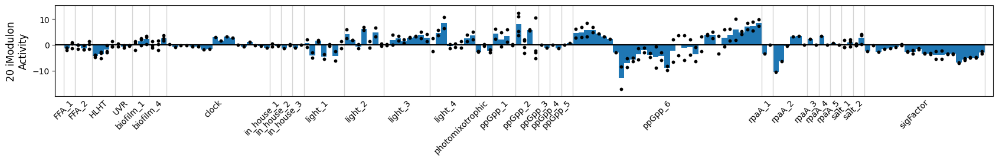

In [180]:
plot_activities(ica_data,20)

In [181]:
DF_enrichments[DF_enrichments.imodulon=='20'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [333]:
# ica_data.rename_imodulons({20:'unchar-3'})
# ica_data.imodulon_table.loc['unchar-3','category'] = 'uncharacterized'

### iModulon 24: unknown

In [182]:
ica_data.view_imodulon(24)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
HTX97_RS00035,-0.042732,HTX97_RS00035,NC_004990.1,,6605,6793,+,hypothetical protein,No COG annotation,,Op15,
Synpcc7942_0014,0.122956,Synpcc7942_0014,CP000100.1,,13067,13411,-,conserved hypothetical protein,Signal transduction mechanisms,Q31SC3,Op29,
Synpcc7942_0015,0.065007,phyA1,CP000100.1,,13577,14248,-,Prolyl 4-hydroxylase%2C alpha subunit,Energy production and conversion,Q31SC2,Op31,
Synpcc7942_0017,0.050202,eda,CP000100.1,,15630,16193,-,2-keto-3-deoxy-phosphogluconate aldolase,Carbohydrate transport and metabolism,Q31SC0,Op34,
Synpcc7942_0035,0.054934,Synpcc7942_0035,CP000100.1,,34357,35115,-,conserved hypothetical protein,No COG annotation,Q31SA2,Op55,
...,...,...,...,...,...,...,...,...,...,...,...,...
Synpcc7942_B2622,0.046958,srpC,CP000101.1,,13100,14281,+,probable chromate transport transmembrane protein,No COG annotation,Q55027,Op30,
Synpcc7942_B2630,0.107528,srpM,CP000101.1,,20808,21608,+,sulfonate ABC transporter%2C permease protein%...,No COG annotation,Q9R6V0,Op35,
Synpcc7942_B2632,0.044521,anL59,CP000101.1,,23609,24160,-,hypothetical protein,No COG annotation,Q31JU8,Op40,
Synpcc7942_B2657,0.082873,anL03,CP000101.1,,29150,29365,-,hypothetical protein,No COG annotation,Q8KUX0,Op47,


<AxesSubplot:xlabel='Gene Start', ylabel='24 Gene Weight'>

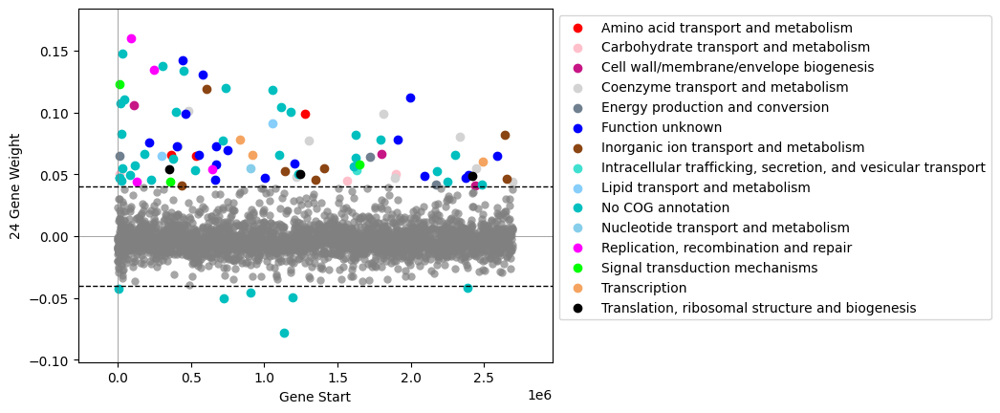

In [186]:
plot_gene_weights(ica_data,24)

<AxesSubplot:ylabel='24 iModulon\nActivity'>

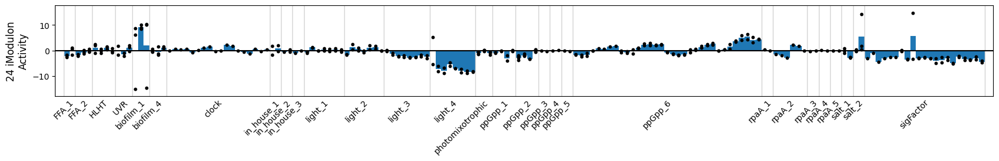

In [183]:
plot_activities(ica_data,24)

<AxesSubplot:ylabel='24 iModulon\nActivity'>

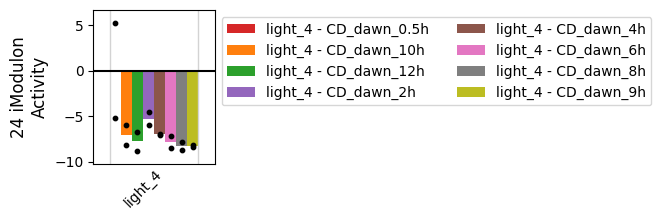

In [184]:
plot_activities(ica_data,24,projects = 'light_4')

In [185]:
DF_enrichments[DF_enrichments.imodulon=='24'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [334]:
# ica_data.rename_imodulons({24:'unchar-4'})
# ica_data.imodulon_table.loc['unchar-4','category'] = 'uncharacterized'

### iModulon 28: phosphate

In [56]:
ica_data.view_imodulon(28)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon
Synpcc7942_0188,0.232471,Synpcc7942_0188,CP000100.1,NaN,185682,187418,+,diguanylate cyclase/phosphodiesterase (GGDEF %...,Signal transduction mechanisms,Q31RU9,Op175
Synpcc7942_1254,-0.247238,Synpcc7942_1254,CP000100.1,NaN,1277460,1277855,+,cyclic nucleotide-binding domain (cNMP-BD) pro...,Signal transduction mechanisms,Q31NT5,Op944
Synpcc7942_1957,0.148413,Synpcc7942_1957,CP000100.1,NaN,2029234,2029671,-,cyclic nucleotide-binding domain (cNMP-BD) pro...,Signal transduction mechanisms,Q54777,Op1472
Synpcc7942_2356,0.320988,Synpcc7942_2356,CP000100.1,NaN,2422193,2422819,-,transcriptional regulator%2C Crp/Fnr family,Transcription,Q31KN3,Op1766
Synpcc7942_2441,0.133085,pstB,CP000100.1,NaN,2517856,2518650,-,Phosphate transport system permease protein 1,Inorganic ion transport and metabolism,Q31KE8,Op1827
Synpcc7942_2442,0.150088,pstA,CP000100.1,NaN,2518698,2519609,-,Phosphate transport system permease protein 2,Inorganic ion transport and metabolism,Q31KE7,Op1828
Synpcc7942_2443,0.138548,pstC,CP000100.1,NaN,2519609,2520541,-,Phosphate ABC transporter%2C permease protein ...,Inorganic ion transport and metabolism,Q31KE6,Op1828
Synpcc7942_2444,0.224572,pstS,CP000100.1,NaN,2520627,2521640,-,Phosphate binding protein,Inorganic ion transport and metabolism,Q31KE5,Op1829
Synpcc7942_2445,0.468764,sphX,CP000100.1,NaN,2521920,2522933,-,Phosphate binding protein,Inorganic ion transport and metabolism,P39665,Op1830


<AxesSubplot:xlabel='Gene Start', ylabel='phosphate Gene Weight'>

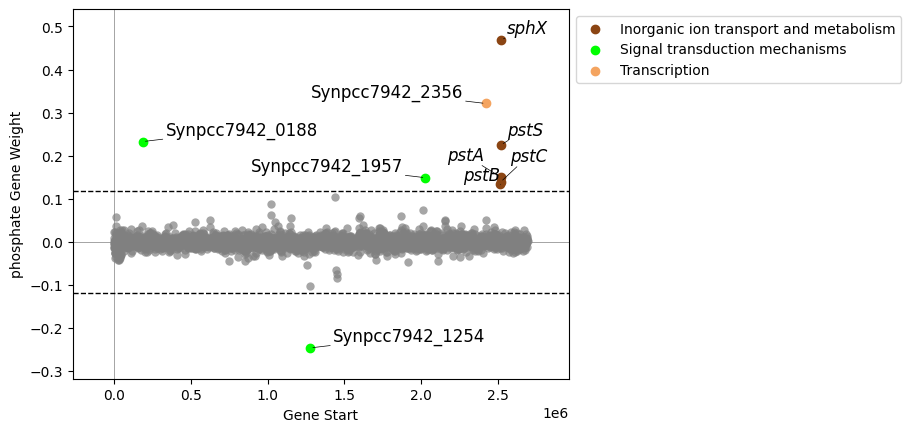

In [22]:
plot_gene_weights(ica_data,'phosphate')

<AxesSubplot:ylabel='28 iModulon\nActivity'>

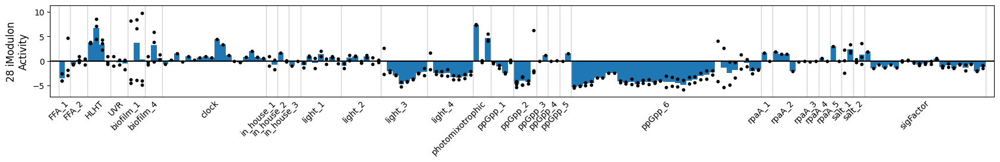

In [57]:
plot_activities(ica_data,28)

<AxesSubplot:ylabel='28 iModulon\nActivity'>

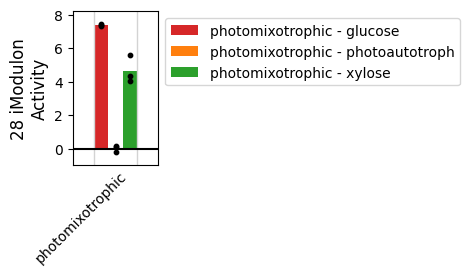

In [29]:
plot_activities(ica_data,28,projects='photomixotrophic')

In [148]:
DF_enrichments[DF_enrichments.imodulon=='28'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
16,28,M00222,3.289537e-11,6.710655e-09,0.294118,0.833333,0.434783,5.0,6.0,17.0,KEGG modules,NaN,NaN
17,28,M00434,3.819746e-05,3.896141e-03,0.117647,1.000000,0.210526,2.0,2.0,17.0,KEGG modules,NaN,NaN
37,28,map05152,7.872263e-04,5.379380e-02,0.117647,0.285714,0.166667,2.0,7.0,17.0,KEGG pathways,Tuberculosis,NaN
36,28,map02020,1.309164e-04,1.341893e-02,0.235294,0.090909,0.131148,4.0,44.0,17.0,KEGG pathways,Two-component system,NaN
35,28,map02010,3.622232e-05,7.425576e-03,0.294118,0.076923,0.121951,5.0,65.0,17.0,KEGG pathways,ABC transporters,NaN


In [21]:
# Update the ica_data object
# ica_data.rename_imodulons({28:'phosphate'})

### iModulon 38: photosystem - closer look later

In [1170]:
ica_data.view_imodulon('PSII-1')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0113,0.140393,Synpcc7942_0113,CP000100.1,,113196,113288,+,hypothetical protein,No COG annotation,Q31S24,Op122,
Synpcc7942_0456,0.099624,psbK,CP000100.1,,445209,445346,+,photosystem II PsbK protein,Function unknown,Q79AV1,Op366,
Synpcc7942_0475,0.198139,petN,CP000100.1,,460449,460544,-,cytochrome b6-f complex subunit VIII,No COG annotation,Q31R12,Op381,
Synpcc7942_0696,0.111621,psbT,CP000100.1,,689050,689145,-,photosystem II PsbT protein,No COG annotation,Q31QE1,Op543,
Synpcc7942_0699,0.120552,psbM,CP000100.1,,691619,691726,+,photosystem II PsbM protein,Function unknown,Q31QD8,Op546,
Synpcc7942_0911,-0.085067,Synpcc7942_0911,CP000100.1,,918998,919249,+,conserved hypothetical protein,No COG annotation,Q31PS8,Op699,
Synpcc7942_0997,0.069600,rpmF,CP000100.1,,1005256,1005432,-,LSU ribosomal protein L32P,"Translation, ribosomal structure and biogenesis",Q31PJ2,Op763,
Synpcc7942_1279,0.096820,Synpcc7942_1279,CP000100.1,,1301796,1302047,-,hypothetical protein,No COG annotation,Q31NR0,Op962,
Synpcc7942_1479,0.136983,petG,CP000100.1,,1530970,1531083,+,cytochrome b6-f complex subunit 5,Energy production and conversion,Q9Z3G1,Op1117,
Synpcc7942_1483,0.070285,Synpcc7942_1483,CP000100.1,,1534449,1534877,-,conserved hypothetical protein,No COG annotation,Q31N56,Op1120,


<AxesSubplot:ylabel='PSII-2 iModulon\nActivity'>

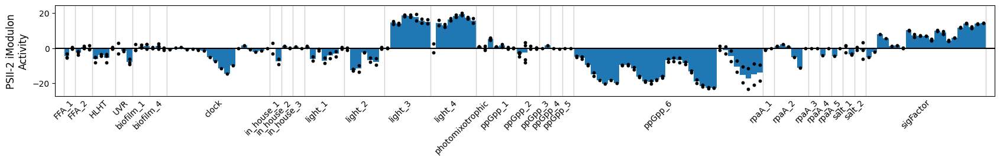

In [1081]:
plot_activities(ica_data,'PSII-2')

<AxesSubplot:ylabel='PSII-1 iModulon\nActivity'>

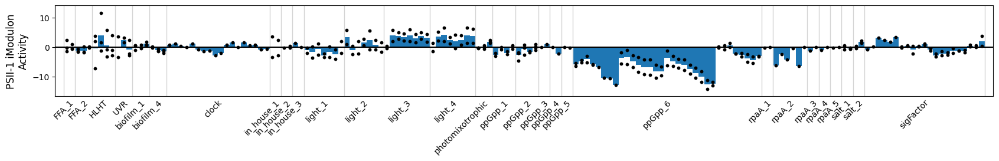

In [1082]:
plot_activities(ica_data,'PSII-1')

In [899]:
ica_data.view_imodulon('sufR')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_1731,0.129343,Synpcc7942_1731,CP000100.1,NaN,1802686,1803171,-,conserved hypothetical protein,Nucleotide transport and metabolism,Q31MF8,Op1306,NaN
Synpcc7942_1732,0.106568,Synpcc7942_1732,CP000100.1,NaN,1803168,1803578,-,conserved hypothetical protein,No COG annotation,Q31MF7,Op1306,NaN
Synpcc7942_1734,0.130198,ftrC,CP000100.1,NaN,1804395,1804757,+,ferredoxin-thioredoxin reductase catalytic chain,Energy production and conversion,Q31MF5,Op1307,sufR
Synpcc7942_1735,0.141866,sufB,CP000100.1,NaN,1804805,1806244,+,Iron-regulated ABC transporter membrane compon...,"Post-translational modification, protein turno...",Q31MF4,Op1308,sufR
Synpcc7942_1736,0.172991,sufC,CP000100.1,NaN,1806290,1807075,+,Iron-regulated ABC transporter ATPase subunit ...,"Post-translational modification, protein turno...",Q31MF3,Op1309,sufR
Synpcc7942_1737,0.176528,sufD,CP000100.1,NaN,1807075,1808403,+,Iron-regulated ABC transporter permease protei...,"Post-translational modification, protein turno...",Q31MF2,Op1309,sufR
Synpcc7942_1738,0.186087,sufS,CP000100.1,NaN,1808413,1809672,+,cysteine desulfurase,Amino acid transport and metabolism,Q31MF1,Op1309,sufR
Synpcc7942_1739,0.176539,merR,CP000100.1,NaN,1809717,1810142,+,transcriptional regulator%2C MerR family,Transcription,Q31MF0,Op1310,NaN


<AxesSubplot:ylabel='sufR iModulon\nActivity'>

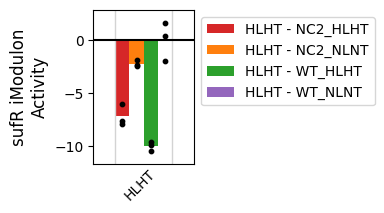

In [898]:
plot_activities(ica_data,'sufR',projects='HLHT')

<AxesSubplot:xlabel='HLHT:WT_NLNT', ylabel='HLHT:WT_HLHT'>

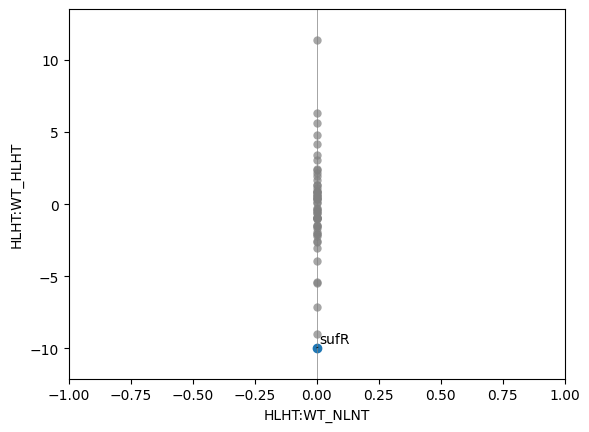

In [812]:
plot_dima(ica_data,'HLHT:WT_NLNT','HLHT:WT_HLHT')

<AxesSubplot:ylabel='38 iModulon\nActivity'>

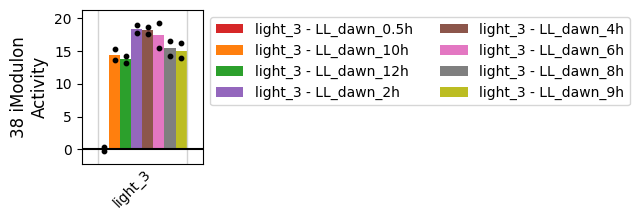

In [136]:
plot_activities(ica_data,38,projects='light_3')

<AxesSubplot:ylabel='38 iModulon\nActivity'>

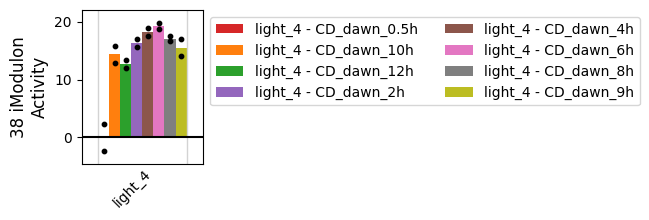

In [137]:
plot_activities(ica_data,38,projects='light_4')

<AxesSubplot:ylabel='38 iModulon\nActivity'>

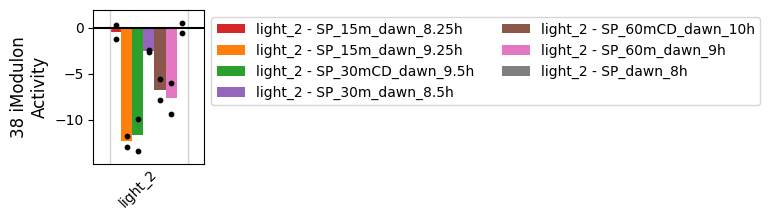

In [139]:
plot_activities(ica_data,38,projects='light_2')

<AxesSubplot:ylabel='PSII-2 iModulon\nActivity'>

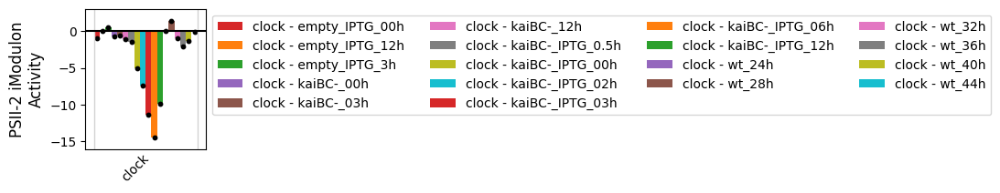

In [365]:
plot_activities(ica_data,'PSII-2',projects='clock')

<AxesSubplot:ylabel='PSII-2 iModulon\nActivity'>

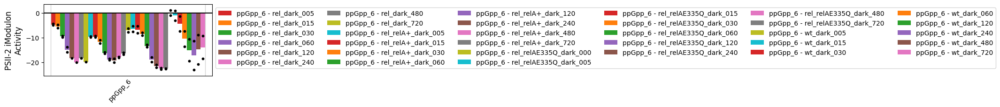

In [364]:
plot_activities(ica_data,'PSII-2',projects='ppGpp_6')

In [140]:
DF_enrichments[DF_enrichments.imodulon=='38'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
42,38,map00196,5.173019e-22,1.060469e-19,0.295455,0.812500,0.433333,13.0,16.0,44.0,KEGG pathways,Photosynthesis - antenna proteins,NaN
43,38,map00195,6.934575e-10,7.107940e-08,0.250000,0.192982,0.217822,11.0,57.0,44.0,KEGG pathways,Photosynthesis,NaN
20,38,M00161,2.289009e-07,4.669579e-05,0.113636,0.500000,0.185185,5.0,10.0,44.0,KEGG modules,NaN,Photosystem II
45,38,map02025,1.309164e-04,6.709466e-03,0.090909,0.235294,0.131148,4.0,17.0,44.0,KEGG pathways,Biofilm formation - Pseudomonas aeruginosa,NaN
21,38,M00507,8.082307e-05,8.243953e-03,0.068182,0.500000,0.120000,3.0,6.0,44.0,KEGG modules,NaN,NaN
46,38,map02020,6.501595e-04,2.665654e-02,0.113636,0.113636,0.113636,5.0,44.0,44.0,KEGG pathways,Two-component system,NaN
44,38,map01100,1.897039e-08,1.296310e-06,0.590909,0.047445,0.087838,26.0,548.0,44.0,KEGG pathways,Metabolic pathways,NaN


In [250]:
# Update the ICA data object

# ica_data.rename_imodulons({'photosystem':'PSII-2'})
# ica_data.imodulon_table.loc['photosystem','category'] = 'functional'

### iModulon 42: unknown

In [198]:
ica_data.view_imodulon(42)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
HTX97_RS00010,-0.038047,HTX97_RS00010,NC_004990.1,pUH24_03%2CST32046_p3,574,1161,-,hypothetical protein,No COG annotation,,Op3,
HTX97_RS00005,-0.035832,HTX97_RS00005,NC_004990.1,pUH24_01%2CST32046_p1,7504,8145,-,hypothetical protein,No COG annotation,,Op17,
Synpcc7942_0014,0.048969,Synpcc7942_0014,CP000100.1,,13067,13411,-,conserved hypothetical protein,Signal transduction mechanisms,Q31SC3,Op29,
Synpcc7942_0032,0.087094,Synpcc7942_0032,CP000100.1,,32849,33202,-,conserved hypothetical protein,Function unknown,Q31SA5,Op50,
Synpcc7942_0033,0.185011,-,CP000100.1,,33174,33506,-,conserved hypothetical protein,Function unknown,Q31SA4,Op51,
...,...,...,...,...,...,...,...,...,...,...,...,...
Synpcc7942_B2662,0.035924,srpI,CP000101.1,,5275,6195,-,major membrane protein I,No COG annotation,Q55032,Op12,
Synpcc7942_B2616,0.077161,anL42,CP000101.1,,8691,9050,+,conserved hypothetical protein,No COG annotation,Q8KUU4,Op19,
Synpcc7942_B2655,0.110961,anL58,CP000101.1,,22675,23511,-,conserved hypothetical protein,No COG annotation,Q8KUT3,Op39,
Synpcc7942_B2656,0.160087,anL02,CP000101.1,,27980,28894,-,hypothetical protein,No COG annotation,Q8KUX3,Op45,


<AxesSubplot:xlabel='Gene Start', ylabel='42 Gene Weight'>

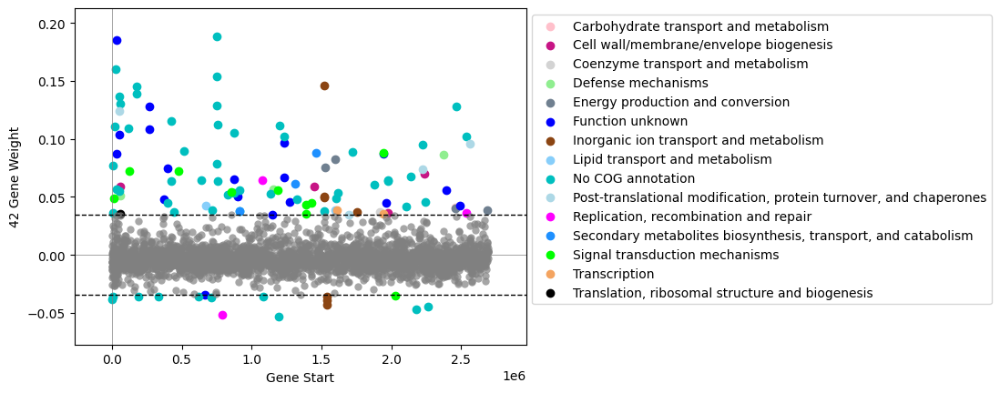

In [199]:
plot_gene_weights(ica_data,42)

<AxesSubplot:ylabel='42 iModulon\nActivity'>

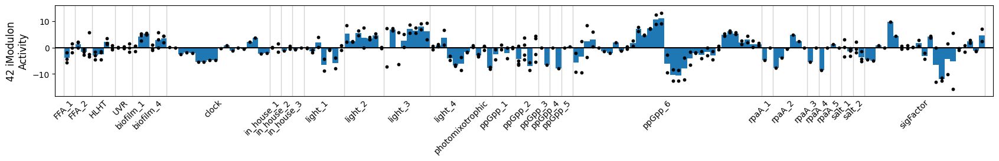

In [200]:
plot_activities(ica_data,42)

In [201]:
DF_enrichments[DF_enrichments.imodulon=='42'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
22,42,M00321,0.000343,0.070018,0.025,0.75,0.048387,3.0,4.0,120.0,KEGG modules,NaN,NaN


In [335]:
# Update ICA data object
# ica_data.rename_imodulons({42:'unchar-5'})
# ica_data.imodulon_table.loc['unchar-5','category'] = 'uncharacterized'

### iModulon 45: unknown

In [171]:
ica_data.view_imodulon(45)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0437,0.087484,sel0033,CP000100.1,,427463,428029,+,putative glutathione peroxidase,No COG annotation,Q8GMQ9,Op350,
Synpcc7942_0918,-0.111153,fadD,CP000100.1,,924079,926028,+,long-chain-fatty-acid CoA ligase,Lipid transport and metabolism,Q31PS1,Op704,
Synpcc7942_1023,0.147188,-,CP000100.1,,1037841,1038086,-,conserved hypothetical protein,No COG annotation,Q31PG6,Op782,
Synpcc7942_1563,0.091060,Synpcc7942_1563,CP000100.1,,1621096,1621512,-,signal transduction inhibitor,No COG annotation,Q31MX6,Op1181,
Synpcc7942_2127,0.098265,nblA,CP000100.1,,2207167,2207346,+,phycobilisome degradation protein NblA,No COG annotation,P35087,Op1601,


<AxesSubplot:xlabel='Gene Start', ylabel='45 Gene Weight'>

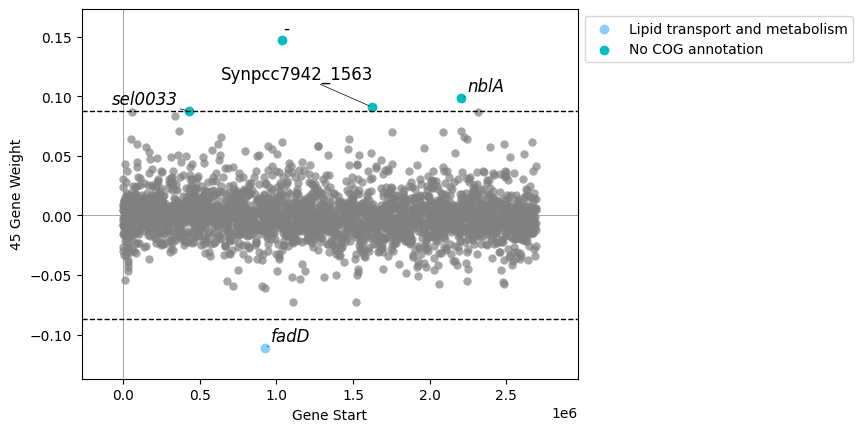

In [172]:
plot_gene_weights(ica_data,45)

<AxesSubplot:ylabel='45 iModulon\nActivity'>

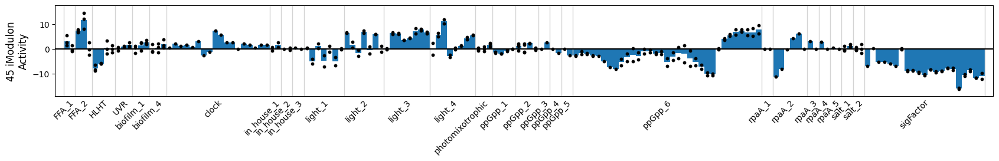

In [173]:
plot_activities(ica_data,45)

<AxesSubplot:ylabel='45 iModulon\nActivity'>

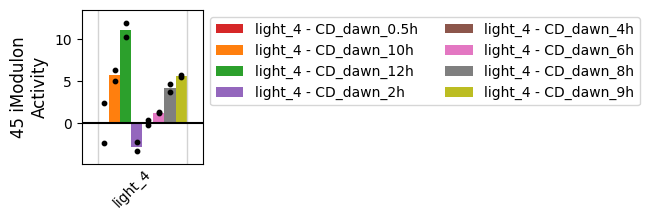

In [178]:
plot_activities(ica_data,45,projects = 'light_4')

In [151]:
DF_enrichments[DF_enrichments.imodulon=='45'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [337]:
# ica_data.rename_imodulons({45:'unchar-6'})
# ica_data.imodulon_table.loc['unchar-6','category'] = 'uncharacterized'

### iModulon 47: sps_ko

In [67]:
ica_data.view_imodulon(47)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon
Synpcc7942_0808,0.361658,spsA,CP000100.1,NaN,800851,802980,-,HAD-superfamily hydrolase subfamily IIB,Cell wall/membrane/envelope biogenesis,Q31Q29,Op621
Synpcc7942_0809,-0.204011,Synpcc7942_0809,CP000100.1,NaN,803073,804815,+,conserved hypothetical protein,Cell wall/membrane/envelope biogenesis,Q31Q28,Op622
Synpcc7942_0810,-0.098993,Synpcc7942_0810,CP000100.1,NaN,804853,805086,+,hypothetical protein,No COG annotation,Q31Q27,Op622
Synpcc7942_1290,-0.102221,-,CP000100.1,NaN,1313290,1313460,-,SmtA metallothionein,Function unknown,P30331,Op968
Synpcc7942_1475,0.107325,sbtA,CP000100.1,NaN,1525833,1526954,-,sodium-dependent bicarbonate transporter,Function unknown,Q31N64,Op1113
Synpcc7942_1488,-0.101347,cmpA,CP000100.1,NaN,1538545,1539897,+,membrane protein,Inorganic ion transport and metabolism,P39660,Op1122
Synpcc7942_1489,-0.121481,cmpB,CP000100.1,NaN,1539953,1540789,+,nitrate transport permease,Inorganic ion transport and metabolism,Q55106,Op1122
Synpcc7942_1490,-0.155393,cmpC,CP000100.1,NaN,1540818,1542809,+,nitrate transport ATP-binding subunits C and D,Inorganic ion transport and metabolism,Q55107,Op1122
Synpcc7942_1491,-0.159504,cmpD,CP000100.1,NaN,1542834,1543670,+,nitrate transport ATP-binding subunits C and D,Inorganic ion transport and metabolism,Q55108,Op1122
Synpcc7942_B2617,0.104781,anL43,CP000101.1,NaN,9300,9845,-,conserved hypothetical protein,No COG annotation,Q8KUU3,Op21


<AxesSubplot:xlabel='Gene Start', ylabel='47 Gene Weight'>

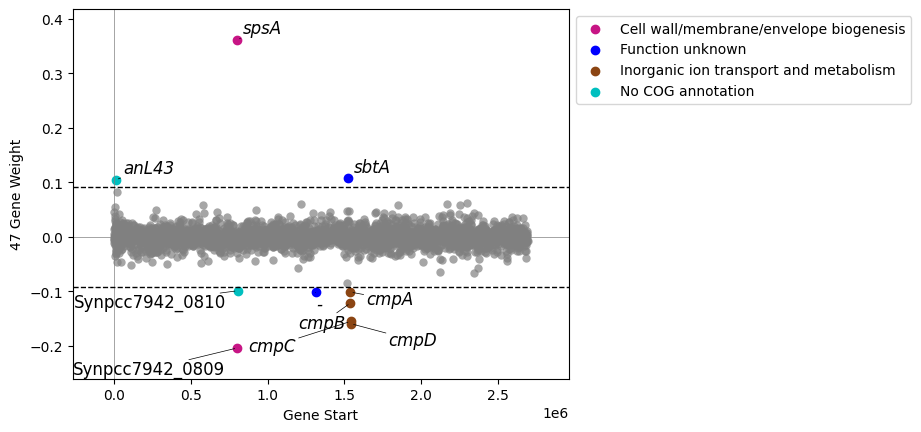

In [23]:
plot_gene_weights(ica_data,47)

<AxesSubplot:ylabel='47 iModulon\nActivity'>

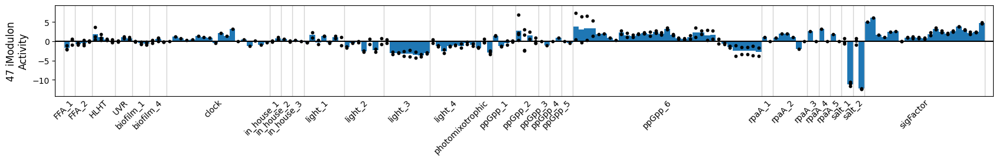

In [68]:
plot_activities(ica_data,47)

<AxesSubplot:ylabel='47 iModulon\nActivity'>

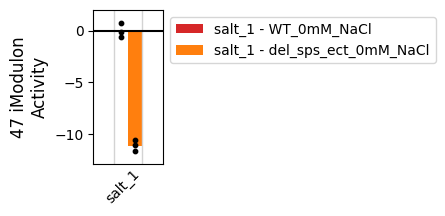

In [30]:
plot_activities(ica_data,47,projects='salt_1')

<AxesSubplot:ylabel='47 iModulon\nActivity'>

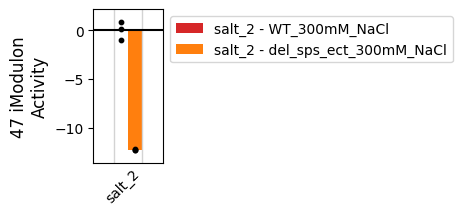

In [31]:
plot_activities(ica_data,47,projects='salt_2')

In [152]:
DF_enrichments[DF_enrichments.imodulon=='47'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [24]:
# Update ICA data object
# ica_data.rename_imodulons({47:'sps_ko'})
# ica_data.imodulon_table.loc['yxi-operon','category'] = 'functional'

### iModulon 51: ribosome

In [161]:
ica_data.view_imodulon(51)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0632,0.086440,rplJ,CP000100.1,NaN,624322,624849,-,LSU ribosomal protein L10P,"Translation, ribosomal structure and biogenesis",Q31QK5,Op493,L10_leader
Synpcc7942_0633,0.081628,rplA,CP000100.1,NaN,625078,625791,-,LSU ribosomal protein L1P,"Translation, ribosomal structure and biogenesis",Q31QK4,Op494,NaN
Synpcc7942_0634,0.083561,rplK,CP000100.1,NaN,625866,626291,-,LSU ribosomal protein L11P,"Translation, ribosomal structure and biogenesis",Q31QK3,Op495,NaN
Synpcc7942_0693,0.088678,Synpcc7942_0693,CP000100.1,NaN,686247,687080,-,conserved hypothetical protein,Function unknown,Q31QE4,Op540,NaN
Synpcc7942_0886,0.083238,rpsG,CP000100.1,NaN,893112,893582,-,SSU ribosomal protein S7P,"Translation, ribosomal structure and biogenesis",Q31PV3,Op678,NaN
Synpcc7942_0887,0.080060,rpsL,CP000100.1,NaN,893750,894124,-,SSU ribosomal protein S12P,"Translation, ribosomal structure and biogenesis",P63200,Op679,NaN
Synpcc7942_1084,-0.079708,-,CP000100.1,NaN,1099185,1099628,-,hypothetical protein,No COG annotation,Q31PA5,Op825,NaN
Synpcc7942_1122,0.120325,rpmG,CP000100.1,NaN,1140801,1140995,+,LSU ribosomal protein L33P,"Translation, ribosomal structure and biogenesis",Q31P67,Op851,NaN
Synpcc7942_1123,0.117764,rpsR,CP000100.1,NaN,1141051,1141266,+,SSU ribosomal protein S18P,"Translation, ribosomal structure and biogenesis",Q31P66,Op852,NaN
Synpcc7942_1222,0.078151,truB,CP000100.1,NaN,1242925,1243809,+,tRNA pseudouridine synthase B,"Translation, ribosomal structure and biogenesis",Q8KIY0,Op923,NaN


<AxesSubplot:ylabel='51 iModulon\nActivity'>

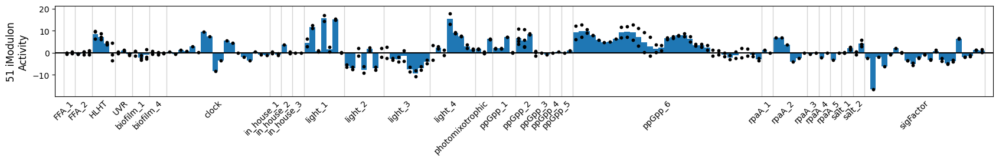

In [162]:
plot_activities(ica_data,51)

In [163]:
DF_enrichments[DF_enrichments.imodulon=='51'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
50,51,map03010,4.404872e-13,9.029988e-11,0.642857,0.169811,0.268657,9.0,53.0,14.0,KEGG pathways,Ribosome,NaN
24,51,M00178,4.404872e-13,8.985939e-11,0.642857,0.169811,0.268657,9.0,53.0,14.0,KEGG modules,NaN,NaN
25,51,M00179,2.364095e-07,2.411377e-05,0.357143,0.166667,0.227273,5.0,30.0,14.0,KEGG modules,NaN,NaN


In [166]:
# Update ICA data object
# ica_data.rename_imodulons({51:'ribosome'})
# ica_data.imodulon_table.loc['ribosome','category'] = 'functional'

### iModulon 52: unknown

In [187]:
ica_data.view_imodulon(52)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_1165,0.423366,Synpcc7942_1165,CP000100.1,,1198844,1199239,-,hypothetical protein,Nucleotide transport and metabolism,Q31P24,Op888,
Synpcc7942_1539,-0.093939,-,CP000100.1,,1597516,1597818,-,conserved hypothetical protein,No COG annotation,Q31N00,Op1160,
Synpcc7942_2157,0.104686,Synpcc7942_2157,CP000100.1,,2240800,2241084,-,conserved hypothetical protein,No COG annotation,Q31L82,Op1625,
Synpcc7942_2275,0.293566,Synpcc7942_2275,CP000100.1,,2343631,2343915,+,hypothetical protein,No COG annotation,Q31KW4,Op1704,


<AxesSubplot:xlabel='Gene Start', ylabel='52 Gene Weight'>

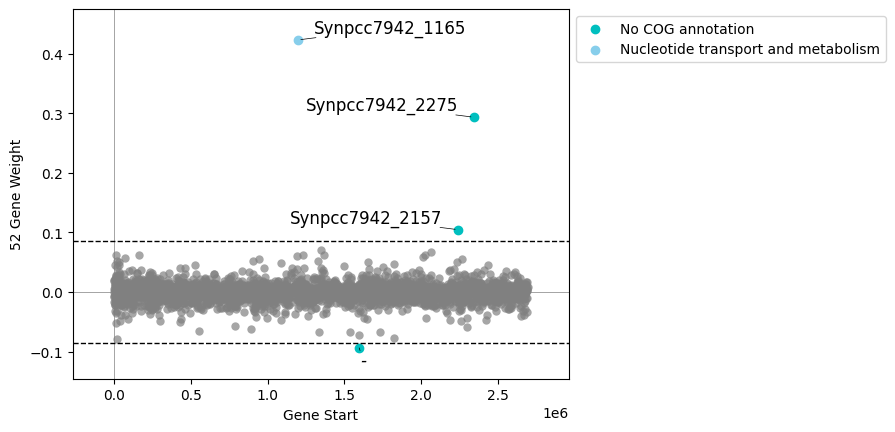

In [188]:
plot_gene_weights(ica_data,52)

<AxesSubplot:ylabel='52 iModulon\nActivity'>

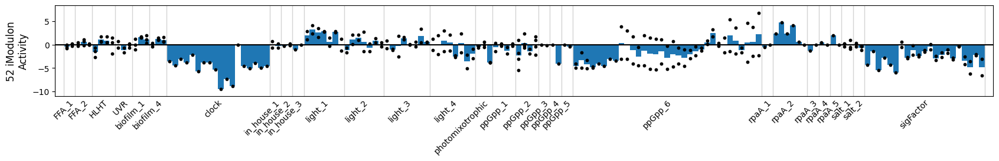

In [189]:
plot_activities(ica_data,52)

<AxesSubplot:ylabel='52 iModulon\nActivity'>

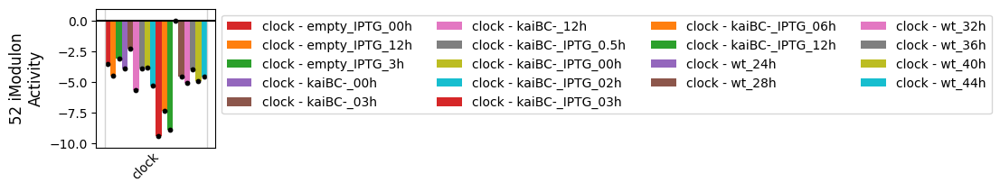

In [191]:
plot_activities(ica_data,52,projects='clock')

In [190]:
DF_enrichments[DF_enrichments.imodulon=='52'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [338]:
# Update ICA data object
# ica_data.rename_imodulons({52:'unchar-7'})
# ica_data.imodulon_table.loc['unchar-7','category'] = 'uncharacterized'

### iModulon 53: unknown

In [192]:
ica_data.view_imodulon(53)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0063,-0.077730,Synpcc7942_0063,CP000100.1,,64266,64706,-,dual specificity protein phosphatase,Signal transduction mechanisms,Q31S74,Op86,
Synpcc7942_0353,0.068353,Synpcc7942_0353,CP000100.1,,345470,346432,+,Na+-dependent transporter-like,Function unknown,Q31RD4,Op288,
Synpcc7942_0383,0.087053,Synpcc7942_0383,CP000100.1,,375762,376448,-,hypothetical protein,Function unknown,Q31RA4,Op310,
Synpcc7942_0630,0.071614,Synpcc7942_0630,CP000100.1,,622432,623574,+,hypothetical protein,Function unknown,Q31QK7,Op491,
Synpcc7942_1281,0.083935,Synpcc7942_1281,CP000100.1,,1303144,1303836,-,conserved hypothetical protein,Function unknown,Q31NQ8,Op962,
Synpcc7942_1343,0.099991,ndhA,CP000100.1,,1377217,1378335,+,NADH dehydrogenase subunit 1,Energy production and conversion,Q31NJ6,Op1011,
Synpcc7942_1344,0.072562,ndhI,CP000100.1,,1378378,1378986,+,NADH-plastoquinone oxidoreductase%2C I subunit...,Energy production and conversion,Q31NJ5,Op1011,
Synpcc7942_1361,0.068843,Synpcc7942_1361,CP000100.1,,1401085,1401588,+,conserved hypothetical protein,Function unknown,Q31NH8,Op1021,
Synpcc7942_1426,0.073147,cbbL,CP000100.1,,1479461,1480879,+,ribulose-1%2C5-bisphosphate carboxylase/oxygen...,Coenzyme transport and metabolism,Q31NB3,Op1077,
Synpcc7942_1648,0.102862,Synpcc7942_1648,CP000100.1,,1716189,1716638,-,putative ferric uptake regulator%2C FUR family,Transcription,Q31MP1,Op1244,perR


<AxesSubplot:xlabel='Gene Start', ylabel='53 Gene Weight'>

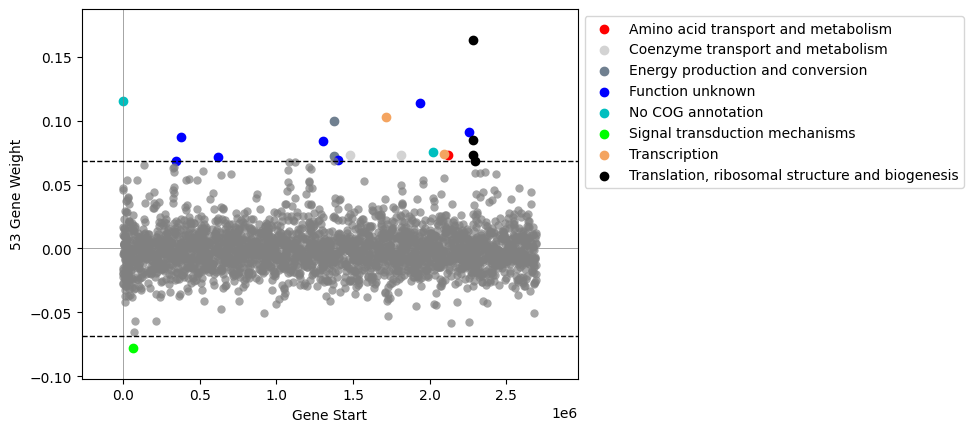

In [330]:
plot_gene_weights(ica_data,53)

<AxesSubplot:ylabel='53 iModulon\nActivity'>

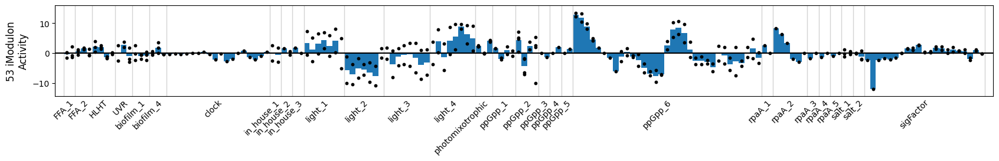

In [193]:
plot_activities(ica_data,53)

<AxesSubplot:ylabel='53 iModulon\nActivity'>

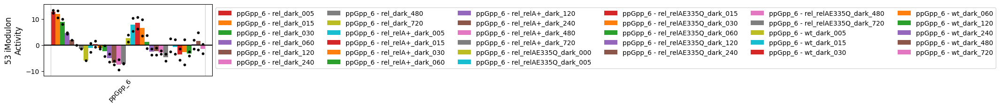

In [194]:
plot_activities(ica_data,53,projects='ppGpp_6')

<AxesSubplot:ylabel='53 iModulon\nActivity'>

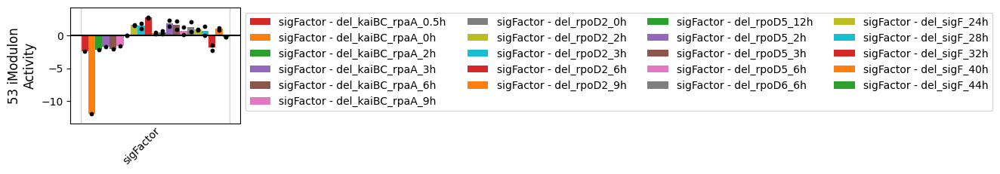

In [195]:
plot_activities(ica_data,53,projects='sigFactor')

In [160]:
DF_enrichments[DF_enrichments.imodulon=='53'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [339]:
# Update ICA data object
# ica_data.rename_imodulons({53:'unchar-8'})
# ica_data.imodulon_table.loc['unchar-8','category'] = 'uncharacterized'

# DIMA

/home/annie/anaconda3/envs/modulome/lib/python3.7/site-packages/pymodulon/util.py:174: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`



<AxesSubplot:xlabel='clock:kaiBC-_IPTG_03h', ylabel='clock:kaiBC-_IPTG_00h'>

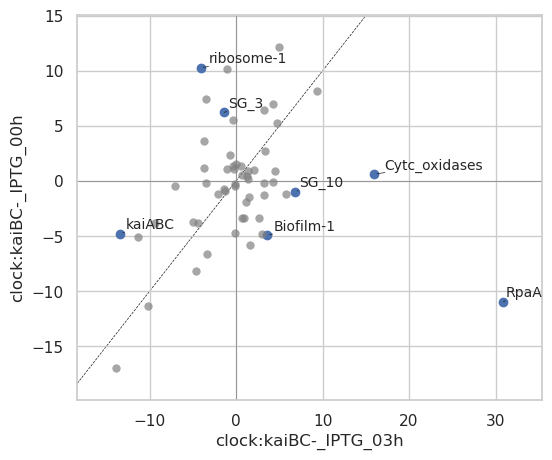

In [1805]:
plot_dima(ica_data,'clock:kaiBC-_IPTG_03h','clock:kaiBC-_IPTG_00h')

<AxesSubplot:xlabel='clock:empty_IPTG_3h', ylabel='clock:kaiBC-_IPTG_03h'>

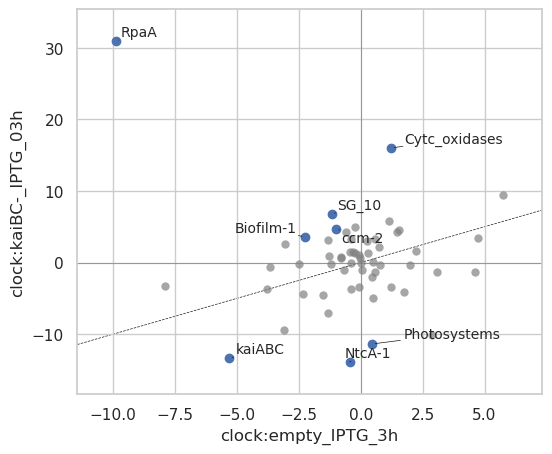

In [1806]:
plot_dima(ica_data,'clock:empty_IPTG_3h','clock:kaiBC-_IPTG_03h')

<AxesSubplot:xlabel='clock:kaiBC-_IPTG_0.5h', ylabel='clock:kaiBC-_IPTG_02h'>

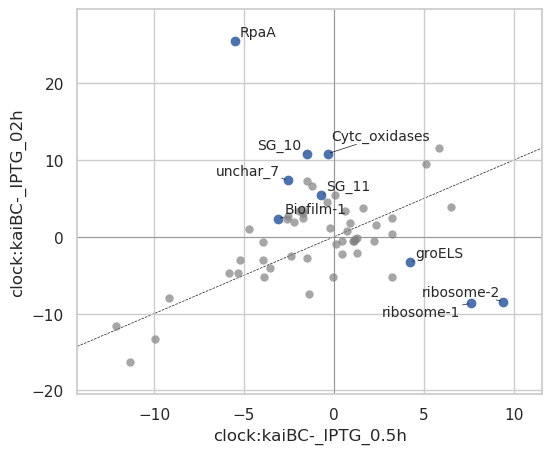

In [1807]:
plot_dima(ica_data,'clock:kaiBC-_IPTG_0.5h','clock:kaiBC-_IPTG_02h')

<AxesSubplot:xlabel='rpaA_2:del_2dark_015', ylabel='rpaA_2:wt_2dark_015'>

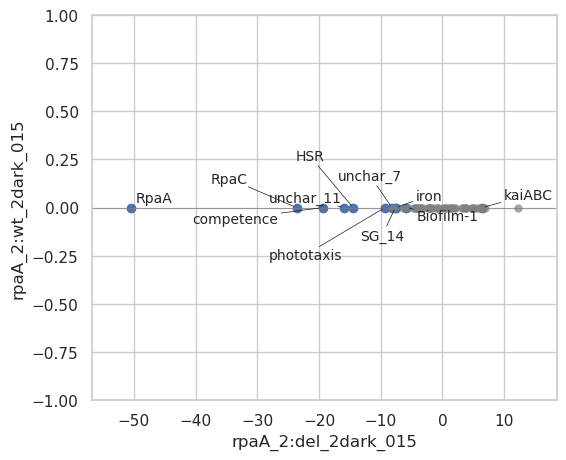

In [1808]:
plot_dima(ica_data,'rpaA_2:del_2dark_015','rpaA_2:wt_2dark_015')

<AxesSubplot:xlabel='light_4:CD_dawn_2h', ylabel='light_4:CD_dawn_9h'>

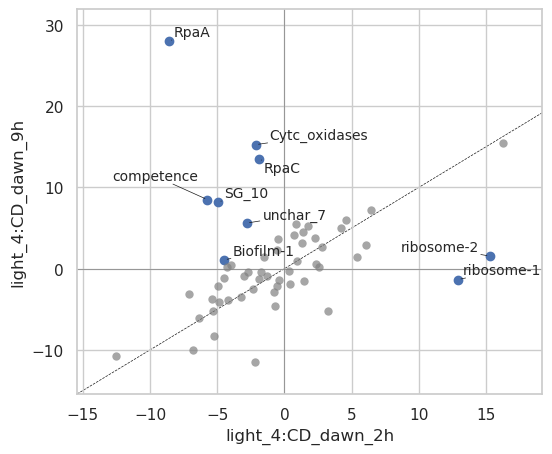

In [1809]:
plot_dima(ica_data,'light_4:CD_dawn_2h','light_4:CD_dawn_9h')

<AxesSubplot:xlabel='light_4:CD_dawn_2h', ylabel='light_4:CD_dawn_10h'>

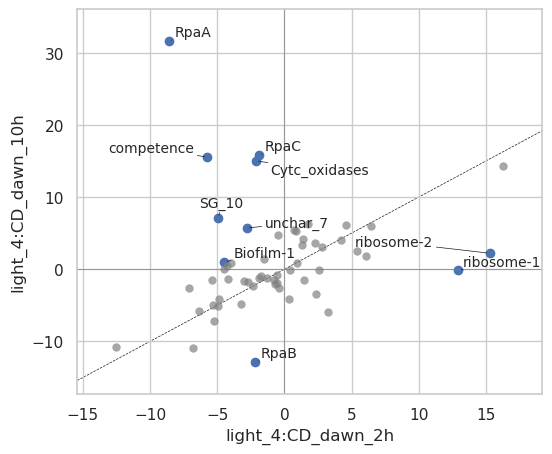

In [1810]:
plot_dima(ica_data,'light_4:CD_dawn_2h','light_4:CD_dawn_10h')

<AxesSubplot:xlabel='light_4:CD_dawn_2h', ylabel='light_4:CD_dawn_12h'>

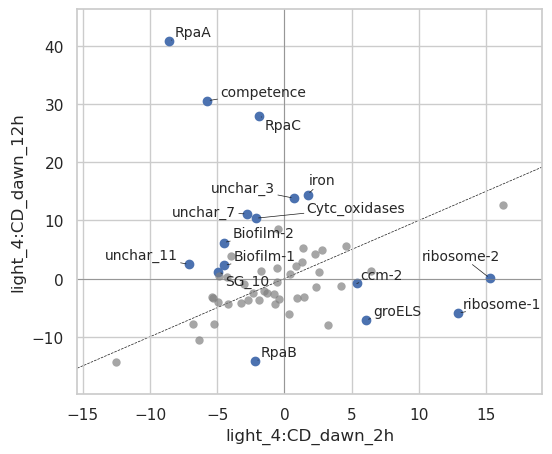

In [1811]:
plot_dima(ica_data,'light_4:CD_dawn_2h','light_4:CD_dawn_12h')

<AxesSubplot:xlabel='rpaA_2:del_2dark_015', ylabel='rpaA_2:wt_2dark_015'>

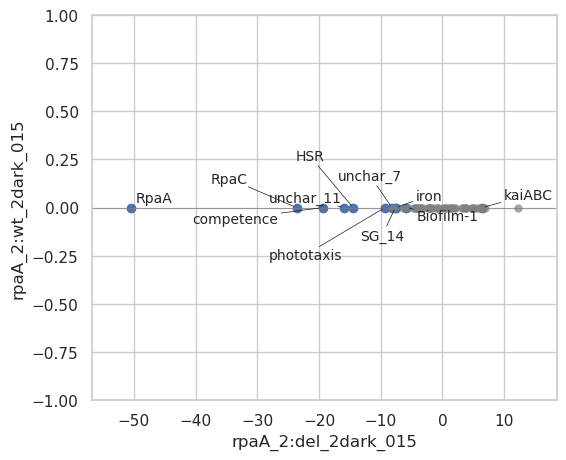

In [1812]:
plot_dima(ica_data,'rpaA_2:del_2dark_015','rpaA_2:wt_2dark_015')

# Cluster Activity

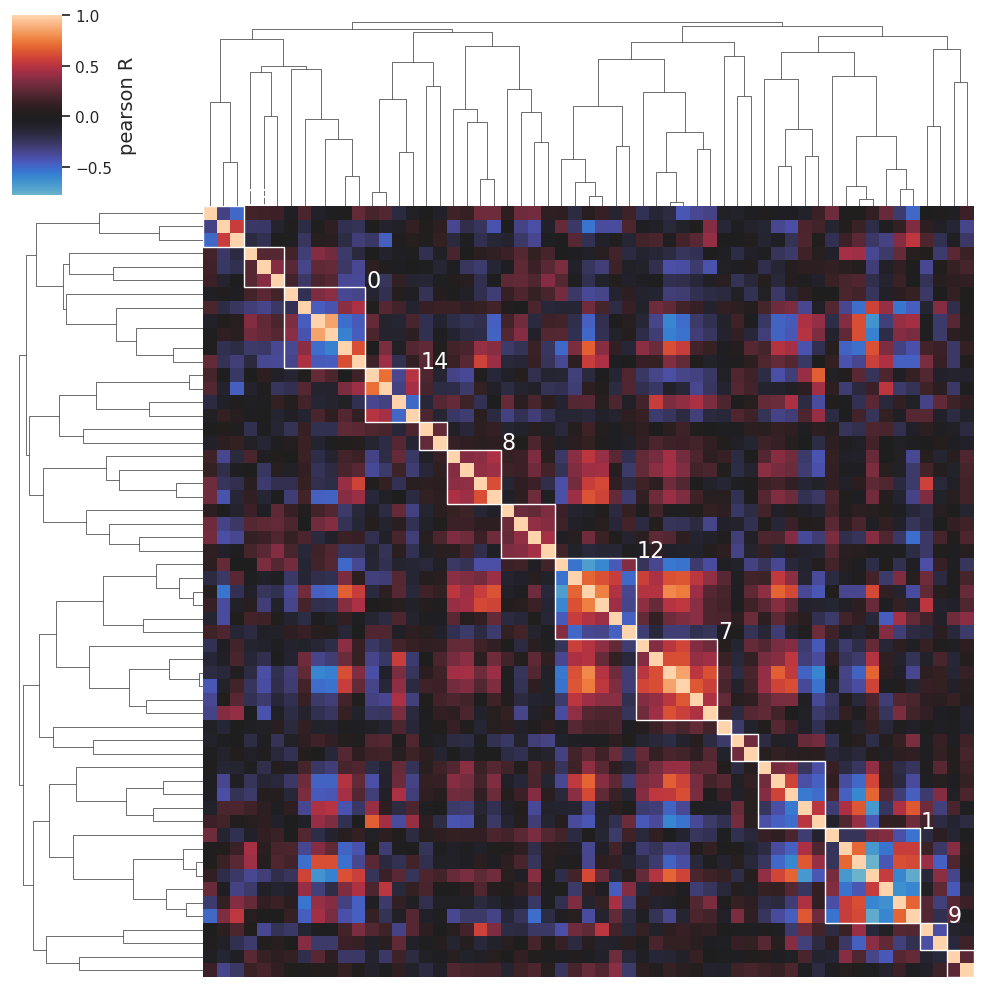

[AgglomerativeClustering(affinity='precomputed', compute_full_tree=True,
                         distance_threshold=0.8, linkage='complete',
                         n_clusters=None)]

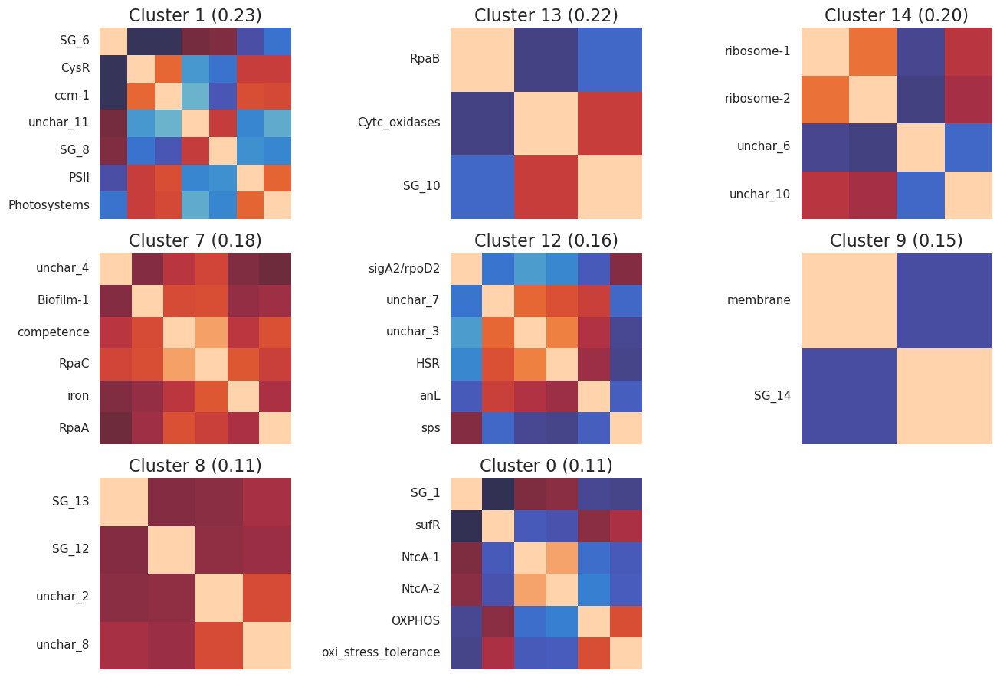

In [1815]:
cluster_activities(ica_data,
                   distance_threshold=0.8,
                   show_best_clusters=True,
                   correlation_method = 'pearson')

# Activity trends

In [14]:
clock_idx = ica_data.sample_table[ica_data.sample_table['project'] == 'clock'].index

In [532]:
def ppgpp6_activity(ica_data,imod_list):
    A = ica_data.A
    _15 = ['SRX3176782','SRX3176800']
    _30 = ['SRX3176783','SRX3176801']
    _60 = ['SRX3176784','SRX3176802']
    _120 = ['SRX3176785','SRX3176803']
    _240 = ['SRX3176786','SRX3176804']
    _480 = ['SRX3176787','SRX3176805']
    _720 = ['SRX3176788','SRX3176806']
    
    rela_5 = ['SRX3312460', 'SRX3312478']
    rela_15 = ['SRX3312461', 'SRX3312479']
    rela_30 = ['SRX3312462', 'SRX3312480']
    rela_60 = ['SRX3312463', 'SRX3312481']
    rela_120 = ['SRX3312464', 'SRX3312482']
    rela_240 = ['SRX3312465', 'SRX3312483']
    rela_480 = ['SRX3312466', 'SRX3312484']
    rela_720 = ['SRX3312467', 'SRX3312485']

    del_rela_5 = ['SRX3176790', 'SRX3176808']
    del_rela_15 = ['SRX3176791', 'SRX3176809']
    del_rela_30 = ['SRX3176792', 'SRX3176810']
    del_rela_60 = ['SRX3176793', 'SRX3176811']
    del_rela_120 = ['SRX3176794']
    del_rela_240 = ['SRX3176795']
    del_rela_480 = ['SRX3176796']
    del_rela_720 = ['SRX3176797']
    
    relae335q_0 = ['SRX3312468', 'SRX3312486']
    relae335q_5 = ['SRX3312469', 'SRX3312487']
    relae335q_15 = ['SRX3312470', 'SRX3312488']
    relae335q_30 = ['SRX3312471','SRX3312489']
    relae335q_60 = ['SRX3312472', 'SRX3312490']
    relae335q_120 = ['SRX3312473', 'SRX3312491']
    relae335q_240 = ['SRX3312474', 'SRX3312492']
    relae335q_480 = ['SRX3312475', 'SRX3312493']
    relae335q_720 = ['SRX3312476', 'SRX3312494']
    
    activity_array = []
    for imod in imod_list:
        result = []
        lists = [_15, _30, _60, _120, _240, _480, _720,rela_5, rela_15, rela_30, rela_60, rela_120, rela_240, 
                 rela_480, rela_720,del_rela_5, del_rela_15, del_rela_30, del_rela_60]
        for sublist in lists:
            avg = (A.loc[imod][sublist[0]] + A.loc[imod][sublist[1]]) / 2
            result.append(avg)
        
        result.append(A.loc[imod][del_rela_120][0])
        result.append(A.loc[imod][del_rela_240][0])
        result.append(A.loc[imod][del_rela_480][0])        
        result.append(A.loc[imod][del_rela_720][0])
        
        lists = [relae335q_0, relae335q_5, relae335q_15, relae335q_30, relae335q_60, relae335q_120, relae335q_240, 
        relae335q_480, relae335q_720]
        for sublist in lists:
            avg = (A.loc[imod][sublist[0]] + A.loc[imod][sublist[1]]) / 2
            result.append(avg)
        
        activity_array.append(result)
    col_index = ["_15", "_30", "_60", "_120", "_240", "_480", "_720","rela_5", "rela_15", "rela_30", 
                  "rela_60", "rela_120", "rela_240", "rela_480", "rela_720","del_rela_5", "del_rela_15", 
                  "del_rela_30", "del_rela_60", "del_rela_120", "del_rela_240", "del_rela_480", "del_rela_720",
                  "relae335q_0", "relae335q_5", "relae335q_15", "relae335q_30", "relae335q_60", "relae335q_120",
                  "relae335q_240", "relae335q_480", "relae335q_720"]

    activity_df = pd.DataFrame(activity_array,index=imod_list,columns = col_index)
    return activity_df

In [1654]:
def dark(ica_data,imod_list):
    A = ica_data.A
    _15 = ['SRX3176782','SRX3176800']
    _30 = ['SRX3176783','SRX3176801']
    _60 = ['SRX3176784','SRX3176802']
    _120 = ['SRX3176785','SRX3176803']
    _240 = ['SRX3176786','SRX3176804']
    _480 = ['SRX3176787','SRX3176805']
    _720 = ['SRX3176788','SRX3176806']
    
    
    activity_array = []
    for imod in imod_list:
        result = []
        lists = [_15, _30, _60, _120, _240, _480, _720]
        for sublist in lists:
            avg = (A.loc[imod][sublist[0]] + A.loc[imod][sublist[1]]) / 2
            result.append(avg)

        activity_array.append(result)
    col_index = ["15 min", "30 min", "60 min", "120 min", "240 min", "480 min", "720 min"]

    activity_df = pd.DataFrame(activity_array,index=imod_list,columns = col_index)
    return activity_df

In [533]:
def light3_activity(ica_data,imod_list):
    A = ica_data.A
#     ctrl = ["SRX3211304", "SRX3211305"]
    _2h = ["SRX3211306", "SRX3211307"]
    _4h = ["SRX3211308", "SRX3211309"]
    _6h = ["SRX3211310", "SRX3211311"]
    _8h = ["SRX3211312", "SRX3211313"]
    _9h = ["SRX3211314", "SRX3211315"]
    _10h = ["SRX3211316", "SRX3211317"]
    _12h = ["SRX3211318", "SRX3211319"]
    
    activity_array = []
    for imod in imod_list:
#         a1 = (A.loc[imod][ctrl[0]] + A.loc[imod][ctrl[1]]) / 2
        a2 = (A.loc[imod][_2h[0]] + A.loc[imod][_2h[1]]) / 2
        a3 = (A.loc[imod][_4h[0]] + A.loc[imod][_4h[1]]) / 2
        a4 = (A.loc[imod][_6h[0]] + A.loc[imod][_6h[1]]) / 2
        a5 = (A.loc[imod][_8h[0]] + A.loc[imod][_8h[1]]) / 2
        a6 = (A.loc[imod][_9h[0]] + A.loc[imod][_9h[1]]) / 2
        a7 = (A.loc[imod][_10h[0]] + A.loc[imod][_10h[1]]) / 2
        a8 = (A.loc[imod][_12h[0]] + A.loc[imod][_12h[1]]) / 2

        activity_array.append([a2,a3,a4,a5,a6,a7,a8])
    activity_df = pd.DataFrame(activity_array,index=imod_list,columns = ['LL_2h','LL_4h','LL_6h',
                                                                            'LL_8h','LL_9h','LL_10h','LL_12h'])
    return activity_df

In [534]:
def light4_activity(ica_data,imod_list):
    A = ica_data.A
#     ctrl = ['SRX3211320','SRX3211321']
    _2h = ['SRX3211322','SRX3211323']
    _4h = ['SRX3211324','SRX3211325']
    _6h = ['SRX3211326','SRX3211327']
    _8h = ['SRX3211328','SRX3211329']
    _9h = ['SRX3211330','SRX3211331']
    _10h = ['SRX3211332','SRX3211333']
    _12h = ['SRX3211334','SRX3211335']
    
    activity_array = []
    for imod in imod_list:
#         a1 = (A.loc[imod][ctrl[0]] + A.loc[imod][ctrl[1]]) / 2
        a2 = (A.loc[imod][_2h[0]] + A.loc[imod][_2h[1]]) / 2
        a3 = (A.loc[imod][_4h[0]] + A.loc[imod][_4h[1]]) / 2
        a4 = (A.loc[imod][_6h[0]] + A.loc[imod][_6h[1]]) / 2
        a5 = (A.loc[imod][_8h[0]] + A.loc[imod][_8h[1]]) / 2
        a6 = (A.loc[imod][_9h[0]] + A.loc[imod][_9h[1]]) / 2
        a7 = (A.loc[imod][_10h[0]] + A.loc[imod][_10h[1]]) / 2
        a8 = (A.loc[imod][_12h[0]] + A.loc[imod][_12h[1]]) / 2

        activity_array.append([a2,a3,a4,a5,a6,a7,a8])
    activity_df = pd.DataFrame(activity_array,index=imod_list,columns = ['CD_2h','CD_4h','CD_6h',
                                                                            'CD_8h','CD_9h','CD_10h','CD_12h'])
    return activity_df

In [1764]:
def shade_pulse(ica_data,imod_list):
    A = ica_data.A
    ctrl = ['SRX3211336','SRX3211337']
    sp_15 = ['SRX3211349','SRX3211350']
    sp_30 = ['SRX3211351','SRX3211352']
    sp_60 = ['SRX3211353','SRX3211354']
    sp_cd_15 = ['SRX3211355','SRX3211356']
    sp_cd_30 = ['SRX3211357','SRX3211358']
    sp_cd_60 = ['SRX3211359','SRX3211360']
    
    
    activity_array = []
    for imod in imod_list:
        result = []
        lists = [ctrl,sp_15,sp_30,sp_60,sp_cd_15,sp_cd_30,sp_cd_60]
        for sublist in lists:
            avg = (A.loc[imod][sublist[0]] + A.loc[imod][sublist[1]]) / 2
            result.append(avg)

        activity_array.append(result)
    activity_df = pd.DataFrame(activity_array,index=imod_list,columns = ['CD_8h','SP_15','SP_30','SP_60',
                                                                         'SP_CD_15','SP_CD_30','CD_10h',
                                                                         ])
    return activity_df

In [1763]:
def high_light(ica_data,imod_list):
    A = ica_data.A
    ctrl = ['SRX3211347','SRX3211348']
    hp_15 = ['SRX3211338','SRX3211339']
    hp_30 = ['SRX3211340','SRX3211341']
    hp_60 = ['SRX3211301','SRX3211342']
    hp_ll_15 = ['SRX3211302','SRX3211303']
    hp_ll_30 = ['SRX3211343','SRX3211344']
    hp_ll_60 = ['SRX3211345','SRX3211346']
    
    activity_array = []
    for imod in imod_list:
        result = []
        lists = [ctrl,hp_15,hp_30,hp_60,hp_ll_15,hp_ll_30,hp_ll_60]
        for sublist in lists:
            avg = (A.loc[imod][sublist[0]] + A.loc[imod][sublist[1]]) / 2
            result.append(avg)

        activity_array.append(result)
    activity_df = pd.DataFrame(activity_array,index=imod_list,columns = ['LL_8h','HP_15','HP_30','HP_60',
                                                                         'HP_LL_15','HP_LL_30','LL_10h'])
    return activity_df

In [561]:
def clock_wt_activity(ica_data,imod_list):
    A = ica_data.A
#     ctrl = ["SRX3211304", "SRX3211305"]
    _24h = ["SRX359366"]
    _28h = ["SRX359367"]
    _32h = ["SRX359368"]
    _36h = ["SRX359369"]
    _40h = ["SRX359370"]
    _44h = ["SRX359371"]
    
    activity_array = []
    for imod in imod_list:
#         a1 = (A.loc[imod][ctrl[0]] + A.loc[imod][ctrl[1]]) / 2
        a2 = A.loc[imod][_24h[0]]
        a3 = A.loc[imod][_28h[0]]
        a4 = A.loc[imod][_32h[0]]
        a5 = A.loc[imod][_36h[0]]
        a6 = A.loc[imod][_40h[0]]
        a7 = A.loc[imod][_44h[0]]

        activity_array.append([a2,a3,a4,a5,a6,a7])
    activity_df = pd.DataFrame(activity_array,index=imod_list,columns = ['24h','28h','32h','36h','40h','44h'])
    return activity_df

Text(0, 0.5, 'SG_14 iModulon Activity')

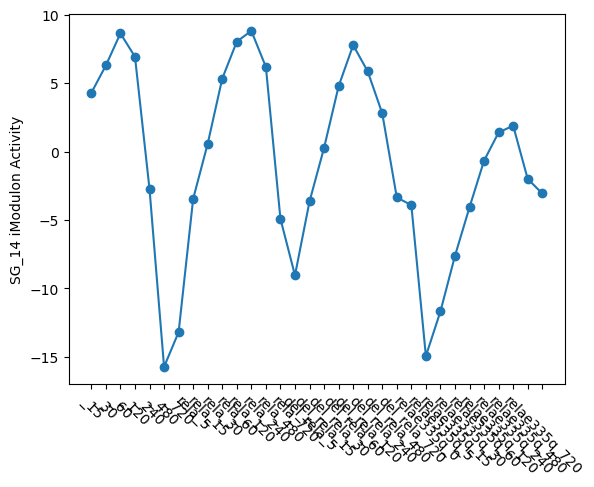

In [660]:
plt.figure()
plt.plot(ppgpp6_activity(ica_data,['RpaA']).T,'-o')
plt.xticks(rotation=-45)
plt.ylabel(str(i)+' iModulon Activity')
# plt.ylim([-15,45])

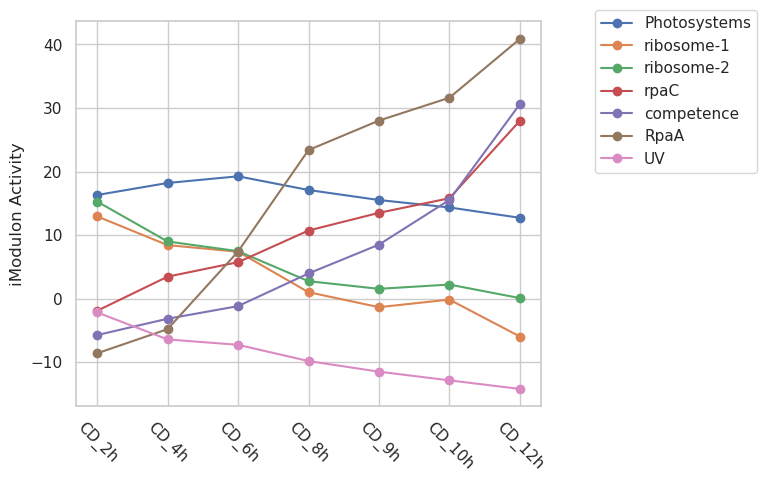

In [1649]:
plt.figure()
plt.plot(light4_activity(ica_data,['Photosystems','ribosome-1','ribosome-2','rpaC','competence','RpaA','UV']).T,'-o')
plt.xticks(rotation=-45)
plt.ylabel('iModulon Activity')
plt.legend(['Photosystems','ribosome-1','ribosome-2','rpaC','competence','RpaA','UV'],bbox_to_anchor=(1.1, 1.05))

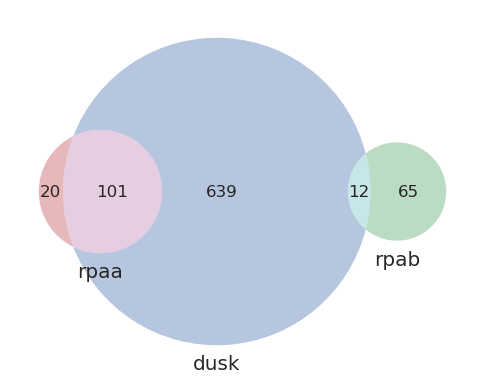

In [1719]:
venn3([set(ica_data.view_imodulon('RpaA').index),set(ica_data.view_imodulon('RpaB').index),set(dusk_genes)],
     set_labels=['rpaa','rpab','dusk'])

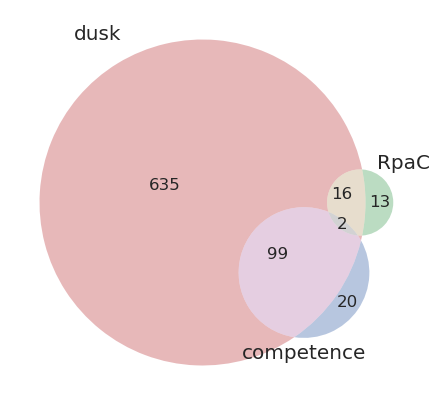

In [1750]:
venn3([set(dusk_genes),set(ica_data.view_imodulon('RpaC').index),set(ica_data.view_imodulon('RpaA').index)],
     set_labels=['dusk','RpaC','competence'])

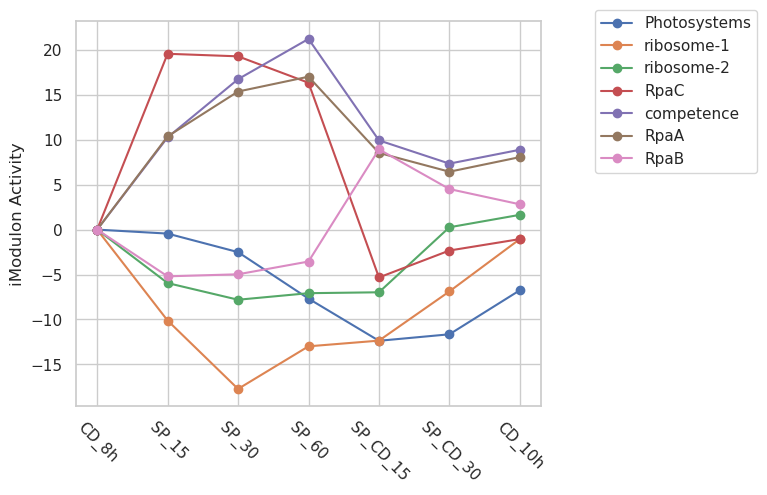

In [1765]:
plt.figure()
plt.plot(shade_pulse_1(ica_data,['Photosystems','ribosome-1','ribosome-2','RpaC','competence','RpaA','RpaB']).T,'-o')
plt.xticks(rotation=-45)
plt.ylabel('iModulon Activity')
plt.legend(['Photosystems','ribosome-1','ribosome-2','RpaC','competence','RpaA','RpaB'],bbox_to_anchor=(1.1, 1.05))
plt.savefig('../data/Figures/shade_line.pdf',transparent=True)

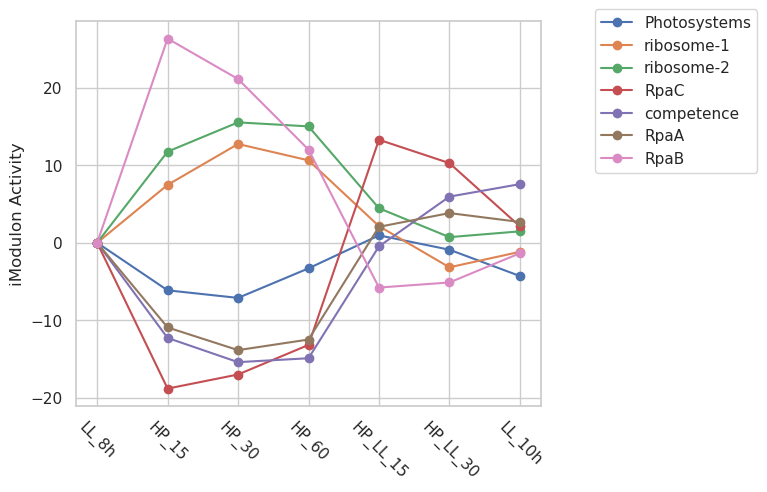

In [1766]:
plt.figure()
plt.plot(high_light_1(ica_data,['Photosystems','ribosome-1','ribosome-2','RpaC','competence','RpaA','RpaB']).T,'-o')
plt.xticks(rotation=-45)
plt.ylabel('iModulon Activity')
plt.legend(['Photosystems','ribosome-1','ribosome-2','RpaC','competence','RpaA','RpaB'],bbox_to_anchor=(1.1, 1.05))
plt.savefig('../data/Figures/light_line.pdf',transparent=True)

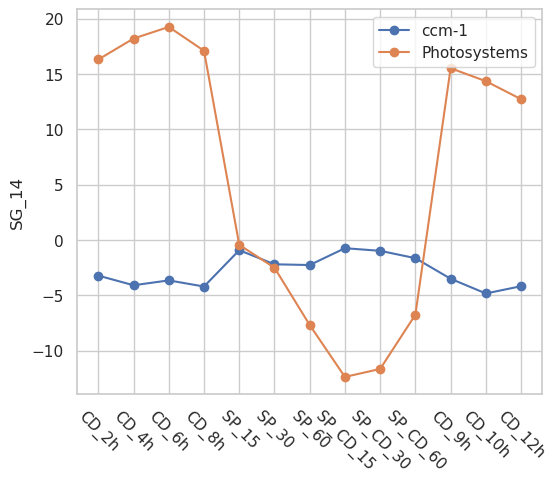

In [1483]:
plt.figure()
plt.plot(shade_pulse(ica_data,['ccm-1','Photosystems']).T,'-o')
plt.xticks(rotation=-45)
plt.ylabel(i)
plt.legend(['ccm-1','Photosystems'])

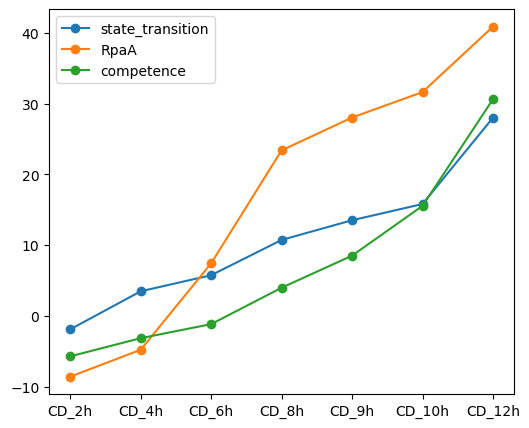

In [1147]:
plt.plot(light4_activity(ica_data,['state_transition','RpaA','competence']).T,'-o')
plt.legend(['state_transition','RpaA','competence'])

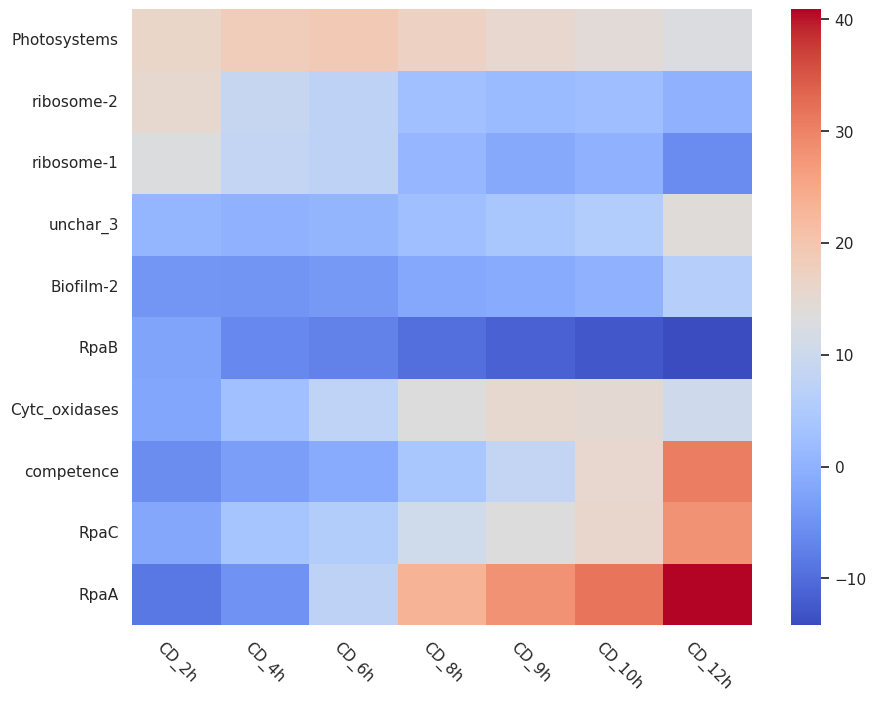

In [1767]:
plt.figure(figsize=(10,8))
sns.heatmap(light4_activity(ica_data,['Photosystems','ribosome-2','ribosome-1','unchar_3','Biofilm-2',"RpaB",
                                      'Cytc_oxidases',
                                      'competence','RpaC','RpaA']),cmap='coolwarm')

plt.xticks(rotation=-45)
None
# plt.savefig('../data/Figures/day_pattern.pdf',transparent=True)

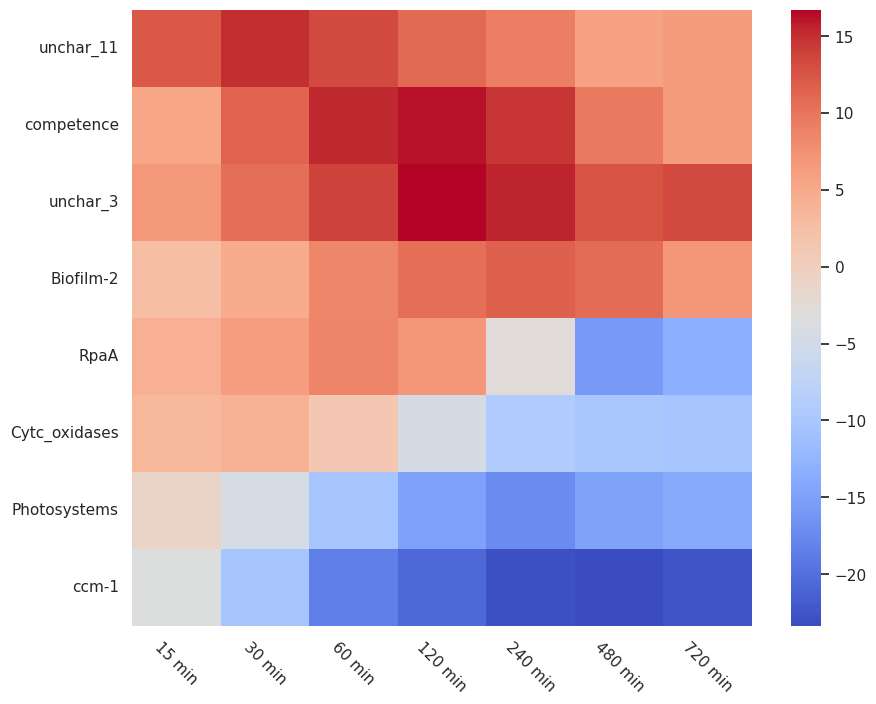

In [1768]:
plt.figure(figsize=(10,8))
sns.heatmap(dark(ica_data,['unchar_11','competence','unchar_3','Biofilm-2','RpaA','Cytc_oxidases',
                           'Photosystems','ccm-1']),cmap='coolwarm')

plt.xticks(rotation=-45)
None
# plt.savefig('../data/Figures/night_pattern.pdf',transparent=True)

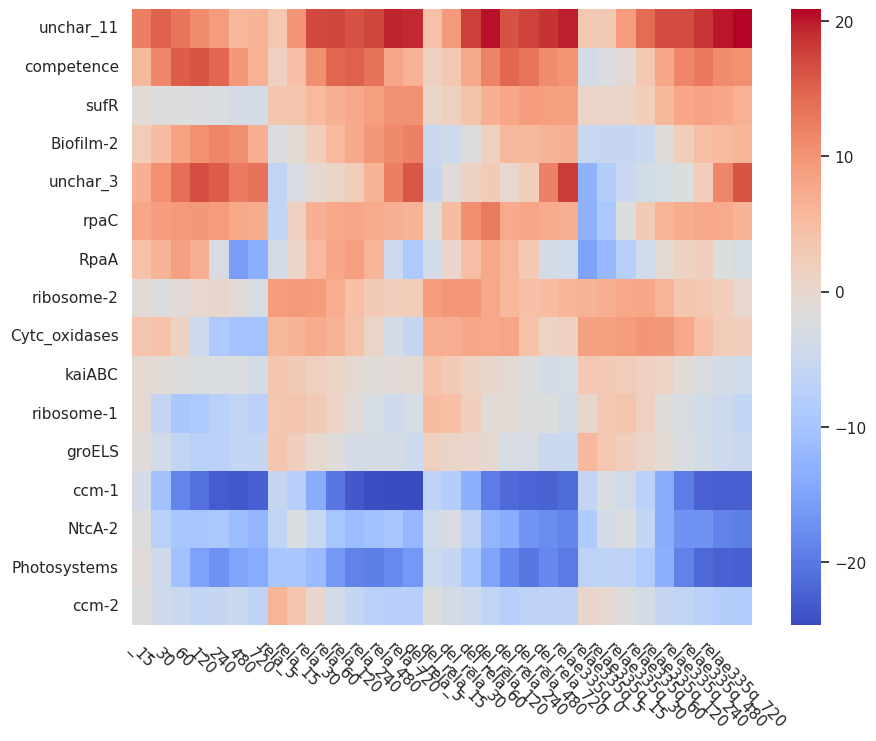

In [1630]:
plt.figure(figsize=(10,8))
sns.heatmap(ppgpp6_activity(ica_data,['unchar_11','competence','sufR','Biofilm-2','unchar_3','rpaC',
                                      'RpaA','ribosome-2','Cytc_oxidases','kaiABC','ribosome-1','groELS',
                                      'ccm-1','NtcA-2','Photosystems','ccm-2']),cmap='coolwarm')
plt.xticks(rotation=-45)
None
# plt.savefig('../data/Figures/night_pattern.pdf',transparent=True)

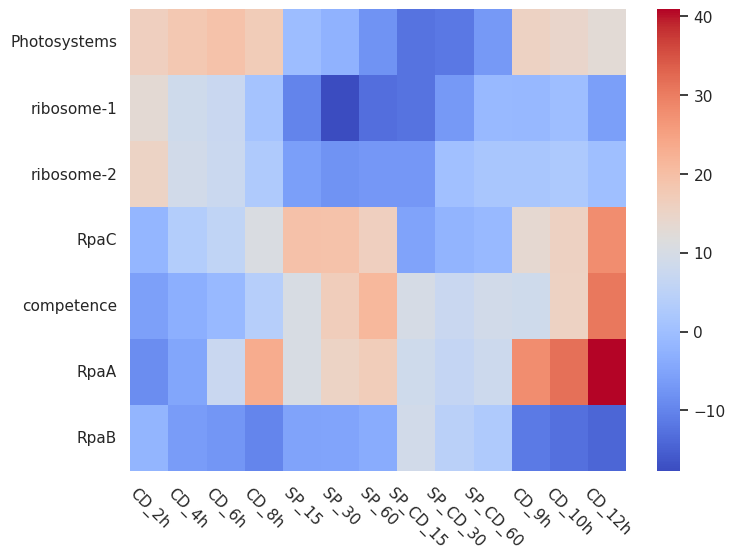

In [1727]:
plt.figure(figsize=(8,6))
sns.heatmap(shade_pulse(ica_data,['Photosystems','ribosome-1','ribosome-2','RpaC','competence',
                                  'RpaA','RpaB']),cmap='coolwarm')
plt.xticks(rotation=-45)
None
# plt.savefig('../data/Figures/shade_pulse.pdf',transparent=True)

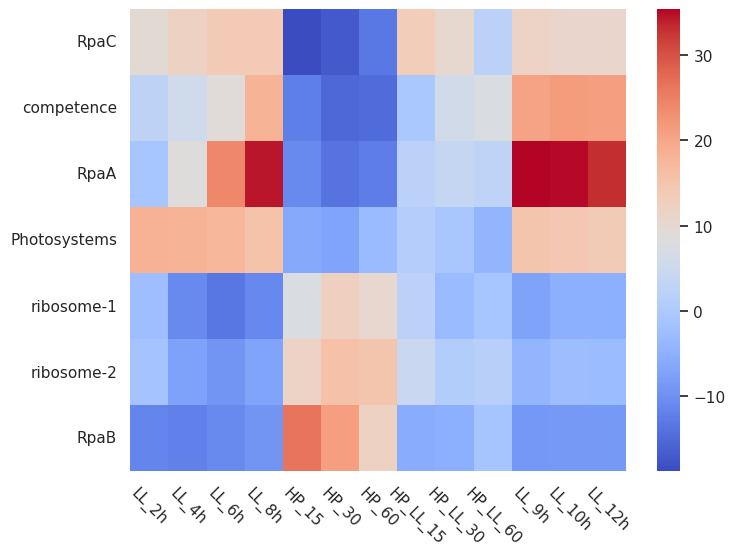

In [1728]:
plt.figure(figsize=(8,6))
sns.heatmap(high_light(ica_data,['RpaC','competence','RpaA','Photosystems','ribosome-1',
                                 'ribosome-2','RpaB']),cmap='coolwarm')
plt.xticks(rotation=-45)
None
# plt.savefig('../data/Figures/light_pulse.pdf',transparent=True)

# Save final ICA data object

In [1817]:
save_to_json(ica_data, path.join(data_dir, 'ica_wip.json.gz'))

In [1818]:
ica_data.imodulon_table.to_csv(path.join(data_dir, 'imodulon_table.csv'))